In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from scipy.optimize import minimize
from scipy.integrate import odeint
from tqdm import tqdm
from scipy.sparse import csr_matrix
from joblib import Parallel, delayed
from scipy.optimize import basinhopping
import sys
from scipy.optimize import differential_evolution
from scipy.optimize import dual_annealing

In [2]:
def expand_array(short_array):
    long_array = np.zeros(63001)  # Create a zero array of the desired size

    # Assign values at the correct positions
    long_array[np.arange(251) * (251 + 1)] = short_array
    return long_array

# Load dictionary
with open("Proper_London_Patch_Populations_1_5km_fixed.pkl", "rb") as file:
    pop_dict = pickle.load(file)

# Extract values in order
short_pop_vector = np.array(list(pop_dict.values()))

pop_vector = expand_array(short_pop_vector)
    
with open("London Borough List.pkl", 'rb') as f:
    borough_list = pickle.load(f)
    
with open("London Station List.pkl", "rb") as file:
    station_list = pickle.load(file)
    
with open("London Station Borough List.pkl", 'rb') as f:
    station_borough_list = pickle.load(f)
    
with open("Proper London Station Borough Proportions Dict.pkl", 'rb') as f:
    props_dict = pickle.load(f)
    
covid_df = pd.read_csv("phe_cases_london_boroughs_fixed.csv")

borough_populations = pd.read_csv("london population 1801 to 2021_cleaned.csv")

# Define main control panel functions

# with open("London new Nj.pkl", "rb") as file:
    # Nj = pickle.load(file)
    
with open("London Home Patch Indices.pkl", "rb") as file:
    home_patches = pickle.load(file)
    
# Load files
with open("Sparse London P Matrix.pkl", "rb") as file:
    sparse_p = pickle.load(file)

p_matrix = sparse_p.toarray()
Nj = pop_vector @ p_matrix

with open("London Unique Patches.pkl", 'rb') as f:
    valid_patches = pickle.load(f)
    
with open("London Valid Patch Indices.pkl", 'rb') as f:
    valid_patch_indices = pickle.load(f)
    
travel_patches = []
for i in valid_patch_indices:
    if i not in home_patches:
        travel_patches.append(i)

In [186]:
np.any(p_matrix < 0)

np.True_

In [3]:


# with open("Final Commuter Matrix Buenos Aires.pkl", "rb") as file:
    # commuter_array = pickle.load(file)
################################################################################################
################################################################################################
################################################################################################
################################################################################################
    
def get_timeseries(station_name,covid_df,props_dict):
    
    current_borough = props_dict[station_name][0]
    
    # Filter data for the given area_name "Lambeth" and within the maximum date range
    filtered_df = covid_df[
        (covid_df['date'] <= "2020-03-22") & 
        (covid_df['area_name'] == current_borough)
    ]

    # Find the earliest date where total_cases is nonzero
    # earliest_nonzero_date = filtered_df.loc[filtered_df['total_cases'] > 0, 'date'].min()
    earliest_nonzero_date = "2020-03-07"

    # Filter again using the adjusted start date
    filtered_df = filtered_df[
        (filtered_df['date'] >= earliest_nonzero_date) & 
        (filtered_df['date'] <= "2020-03-07")
    ]
    
    borough_timeseries = np.array(list(filtered_df['total_cases']))
    
    station_timeseries = props_dict[station_name][1]*borough_timeseries
    

    
    
    return station_timeseries



def get_timeseries_with_five(station_name, covid_df, props_dict):
    current_borough = props_dict[station_name][0]

    # Define the start and end dates
    end_date = "2020-06-22"
    earliest_nonzero_date = "2020-03-07"
    five_days_before = "2020-03-04"  # 5 days before the earliest nonzero date

    # Filter data for the given borough within the maximum date range
    filtered_df = covid_df[
        (covid_df['date'] >= earliest_nonzero_date) & 
        (covid_df['date'] <= end_date) & 
        (covid_df['area_name'] == current_borough)
    ]
    
    borough_timeseries = np.array(filtered_df['total_cases'])
    station_timeseries = props_dict[station_name][1] * borough_timeseries

    # Get new cases in the 5 days before the earliest nonzero date
    previous_df = covid_df[
        (covid_df['date'] >= five_days_before) & 
        (covid_df['date'] < earliest_nonzero_date) & 
        (covid_df['area_name'] == current_borough)
    ]
    
    total_new_cases_prev_5_days = props_dict[station_name][1]*previous_df['new_cases'].sum()

    return station_timeseries, total_new_cases_prev_5_days


################################################################################################
################################################################################################
################################################################################################
################################################################################################


all_station_timeseries = []
all_new_cases_prev_5_days = []
for i in range(len(station_list)):
    timeseries = get_timeseries_with_five(station_list[i],covid_df,props_dict)
    all_station_timeseries.append(timeseries[0])
    all_new_cases_prev_5_days.append(timeseries[1])
    
    
all_station_timeseries = np.array(all_station_timeseries)
day_range = all_station_timeseries[0].shape[0]
print(day_range)

def expand_array(short_array):
    long_array = np.zeros(63001)  # Create a zero array of the desired size

    # Assign values at the correct positions
    long_array[np.arange(251) * (251 + 1)] = short_array
    return long_array


def expand_timeseries(short_timeseries,timespan=day_range):
    
    transposed = short_timeseries.T
    
    long_timeseries = np.zeros((timespan,63001))
    for i in range(timespan):
        long_timeseries[i] = expand_array(transposed[i])
        
    long_timeseries = np.array(long_timeseries)
    
    return long_timeseries

working_timeseries = expand_timeseries(all_station_timeseries,day_range)
short_pop_vector = np.array(list(pop_dict.values()))
pop_vector = expand_array(short_pop_vector)
day_list = np.arange(day_range)
data = np.column_stack((day_list[:, None], working_timeseries))


current_cases = np.array(all_new_cases_prev_5_days)
cum_cases = data[0][1:]


np.set_printoptions(suppress=True)


108


In [7]:
# Define function to process solution
def process_solution(solution,timesteps):
    # Grouping by station subpopulation
    S_sol = solution[:63001]
    I_sol = solution[63001:126002]
    I_sol_total = solution[126002:]

    return [S_sol,I_sol,I_sol_total]



def run_model_London(params):
    S0,I0,I_total0,beta,gamma,timesteps = params
    
    print(beta.shape)
    
    if beta.shape[0]==837:
        beta = expand_betas(beta,63001)

    
    # Ensure no dividing by zero
    Nj[Nj == 0] = 1
    
    # Set up initial y0 vector
    y0 = np.concatenate((S0,I0,I_total0))
    
    # beta_p_matrix = (beta*p_matrix.T).T
    # beta_p_matrix = beta[:, None] * p_matrix 
    beta_p_matrix = sparse_p.multiply(beta[:, None])
    
    t = np.linspace(0,timesteps-1,num=timesteps)
    
    
    
    def sir(y,timestep):
        S = y[:63001]
        I = y[63001:126002]
        I_total = y[126002:]

        dSdt = np.zeros_like(S)
        dIdt = np.zeros_like(I)
        dI_totaldt = np.zeros_like(I_total)

        Ij = p_matrix.T @ I
        
        
        method = "vector"
        
        if method == "vector":

            # Compute Ij_div_Nj efficiently
            Ij_div_Nj = Ij / Nj  # Shape (63001,)
        
            # Vectorized computation of infection terms using sparse matrix multiplication
            infection_terms = beta_p_matrix.multiply(S[:, None])  # (63001, 63001)
            infection_terms = infection_terms @ Ij_div_Nj  # (63001,)
        
            # Update derivatives
            dSdt -= infection_terms
            dIdt += infection_terms
            

        else:
            # Essentially, for all i, all j, dSdt[i] += -beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
            for i in valid_patch_indices:
                for j in valid_patch_indices:
                    dSdt[i] += -beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
            dIdt -= dSdt
    
        dI_totaldt += dIdt

        # Add the gamma terms
        dIdt -= gamma * I
        # dSdt += gamma * I

        # Concatenate results
        dx = np.concatenate((dSdt, dIdt, dI_totaldt))

        return dx
    
    y_log = np.zeros((len(t)+1,189003))
    y_log[0] = y0.copy()

    for step in range(len(t)):
        # print("step:",step)
        results = sir(y_log[step],step)
        y_log[step+1] = y_log[step] + results
    
    solution = process_solution(y_log.T,timesteps)
    
    return solution
    

In [4]:
def expand_timeseries(short_timeseries,timespan=day_range):
    
    transposed = short_timeseries.T
    
    long_timeseries = np.zeros((timespan,63001))
    for i in range(timespan):
        long_timeseries[i] = expand_array(transposed[i])
        
    long_timeseries = np.array(long_timeseries)
    
    return long_timeseries

def expand_timeseries2(short_timeseries):
    
    transposed = short_timeseries.T
    day_range = all_station_timeseries2[0].shape[0]
    
    long_timeseries = np.zeros((day_range,63001))
    for i in range(day_range):
        long_timeseries[i] = expand_array(transposed[i])
        
    long_timeseries = np.array(long_timeseries)
    
    return long_timeseries


def expand_array(short_array):
    long_array = np.zeros(63001)  # Create a zero array of the desired size

    # Assign values at the correct positions
    long_array[np.arange(251) * (251 + 1)] = short_array
    return long_array



def compress_timeseries(long_timeseries,timespan=day_range):
    compressed = np.zeros((timespan, 251))  # Adjusted to match the original short array shape
    
    for i in range(timespan):
        compressed[i] = compress_array(long_timeseries[i])
        
    return compressed.T  # Transpose back to match original input shape

def compress_array(long_array):
    return long_array[np.arange(251) * (251 + 1)]  # Extract values from the expanded positions


def expand_betas(short_betas,long_length):
    
    long_betas = np.zeros(long_length)
    index = 0
    for i in valid_patch_indices:
        long_betas[i] = short_betas[index]
        index += 1
    
    return long_betas

In [83]:
best_beta_yet_0

array([0.47327663, 0.6300031 , 0.35567162, 0.58732807, 0.48559222,
       0.49333212, 0.45699795, 0.50088589, 0.53624926, 0.5607019 ,
       0.89994776, 0.50757475, 0.51507289, 0.44230306, 0.45329964,
       0.48424938, 0.51381974, 0.45350492, 0.54051009, 0.3679068 ,
       0.68980329, 0.37634398, 0.54807093, 0.54585682, 0.4742354 ,
       0.48274495, 0.36766871, 0.44298714, 0.5718019 , 0.37026497,
       0.44640754, 0.49244254, 0.44248727, 0.54688467, 0.35391119,
       0.43178914, 0.89994776, 0.61067819, 0.45275677, 0.5463641 ,
       0.89994776, 0.42964947, 0.47495952, 0.5668418 , 0.56654015,
       0.56471341, 0.45843187, 0.44755893, 0.48726836, 0.56153035,
       0.43952106, 0.50987167, 0.50833893, 0.58650127, 0.47267849,
       0.47881303, 0.48429089, 0.44876396, 0.45118627, 0.44028755,
       0.56358207, 0.43976256, 0.44641065, 0.47418761, 0.48898849,
       0.5783257 , 0.42020751, 0.47903077, 0.4377117 , 0.43353587,
       0.44323243, 0.45512731, 0.45620552, 0.44476721, 0.47035

In [4]:
np.max(best_beta_yet_0)-np.min(best_beta_yet_0)

np.float64(0.19486950258077618)

In [10]:
np.median(best_beta_yet_0)

np.float64(0.46549396099122564)

In [6]:
np.average(best_beta_yet_0)

np.float64(0.476446211963138)

In [7]:
np.std(best_beta_yet_0, ddof=1)

np.float64(0.045794501610169)

In [5]:
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    best_beta_yet_0 = pickle.load(file)
    
best_beta_yet_0

array([0.46400659, 0.48078284, 0.40066743, 0.55419176, 0.47245387,
       0.47764779, 0.45133736, 0.48255419, 0.48636672, 0.53697462,
       0.47846802, 0.48339782, 0.4720035 , 0.44338233, 0.45402565,
       0.47469322, 0.47367896, 0.4533014 , 0.53703741, 0.40961556,
       0.48024813, 0.41236202, 0.48365634, 0.53693612, 0.46336027,
       0.4677234 , 0.4027697 , 0.44652904, 0.56215081, 0.400502  ,
       0.45145937, 0.47629906, 0.4453252 , 0.54146892, 0.41698762,
       0.43677191, 0.47904442, 0.57225624, 0.45195415, 0.48432447,
       0.47941168, 0.4435787 , 0.46233471, 0.55610693, 0.55499653,
       0.54383825, 0.45196362, 0.45452798, 0.48384038, 0.48281757,
       0.43854056, 0.47254485, 0.47291594, 0.5585062 , 0.46767003,
       0.45865248, 0.48223917, 0.45234962, 0.45880565, 0.44254263,
       0.5441272 , 0.44119475, 0.45321898, 0.47208595, 0.48011669,
       0.56135965, 0.42020751, 0.47903077, 0.4377117 , 0.43353587,
       0.44323243, 0.45512731, 0.45620552, 0.44476721, 0.47035

(108, 63002)
(63001,)


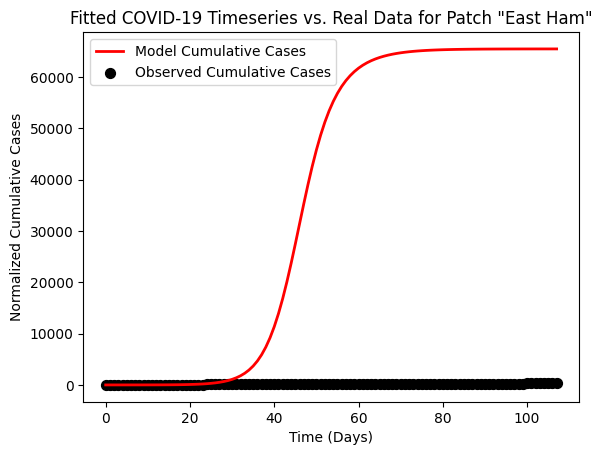

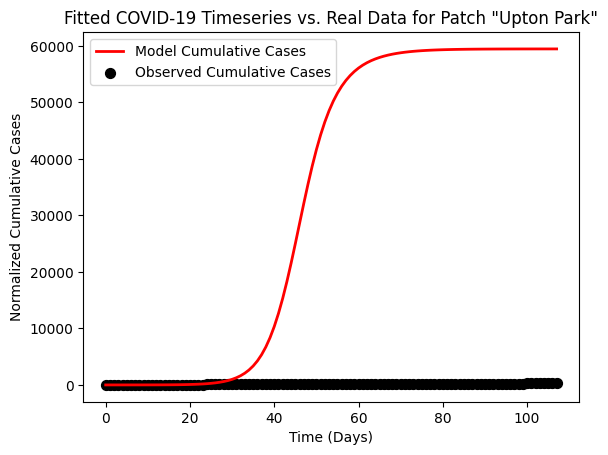

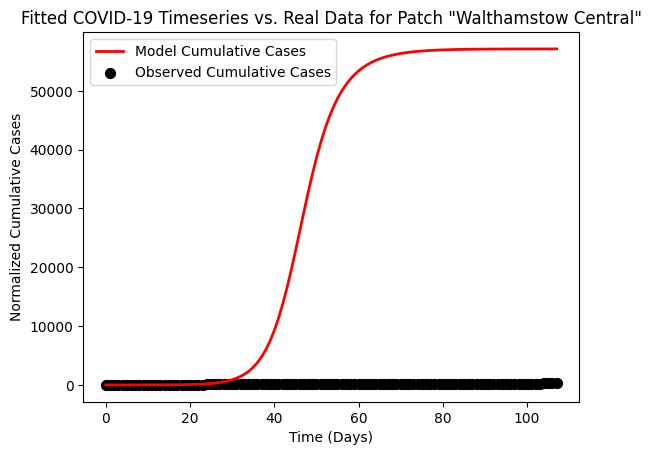

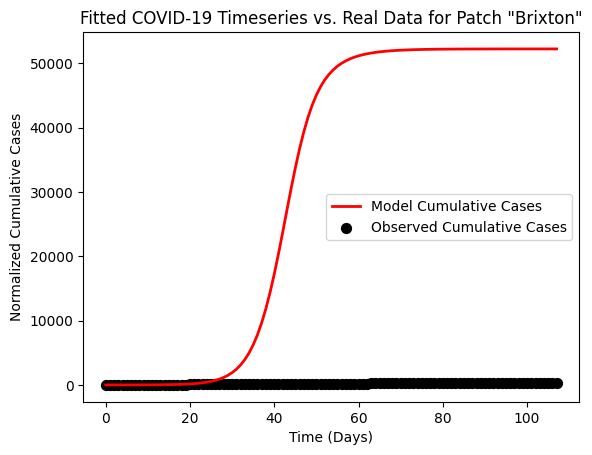

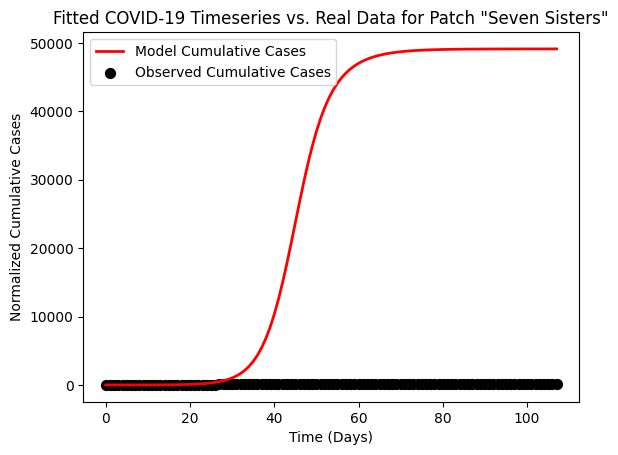

...

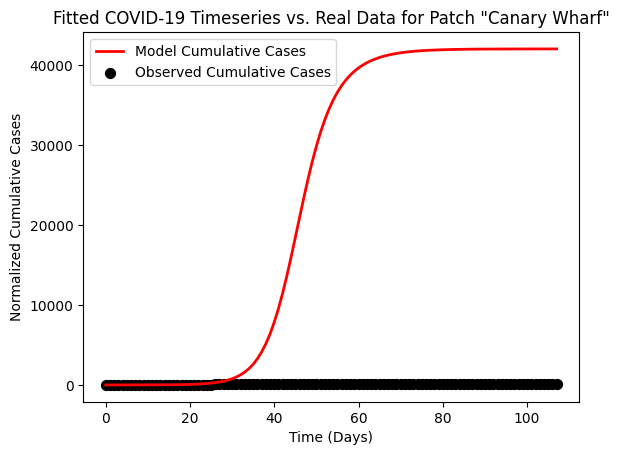

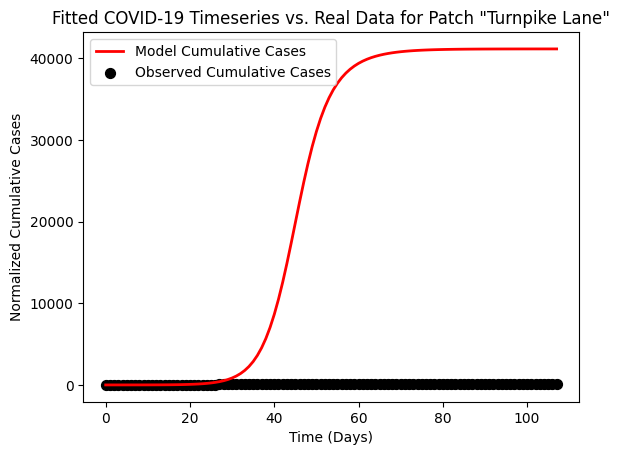

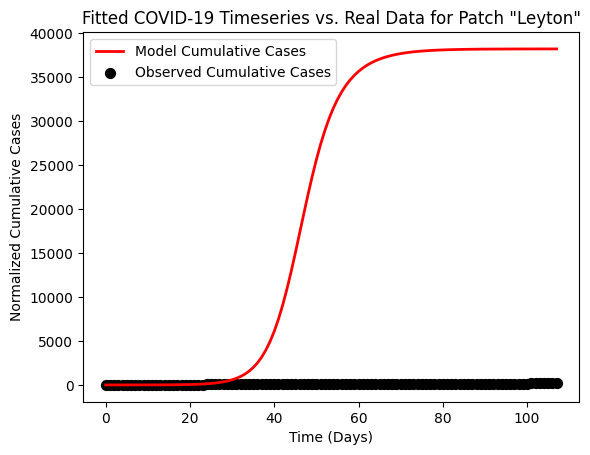

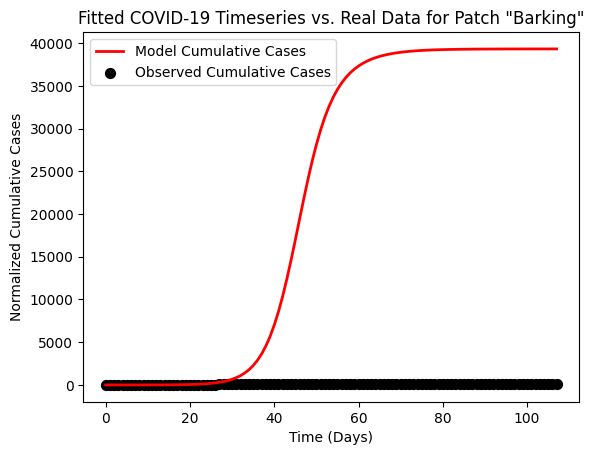

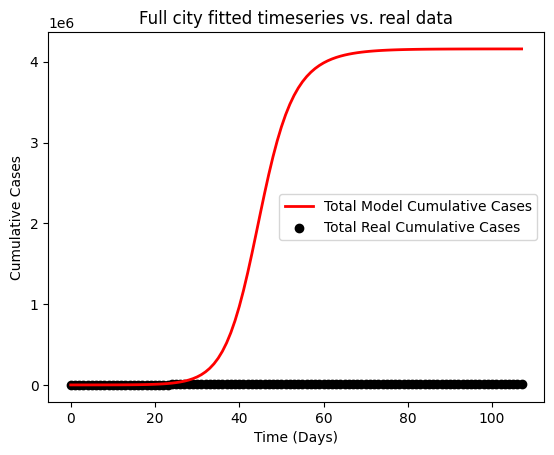

In [8]:
import pickle
import numpy as np
import matplotlib.pyplot as plt


        
def make_detailed_beta(short_beta):
    new_beta_0 = np.zeros(837)

    for i in range(251):
        new_beta_0[i] = short_beta[i]
    for i in range(837-251):
        new_beta_0[i+251] = short_beta[-1]
    return np.array(new_beta_0)

def expand_detailed_beta(detailed_beta):
    big_beta = np.zeros(63001)
    home_betas = detailed_beta[:251]
    travel_betas = detailed_beta[251:]
    big_beta[home_patches] = home_betas
    big_beta[travel_patches] = travel_betas
    
    return big_beta

# Load best beta values
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    best_beta_yet_0 = pickle.load(file)
    
def expand_concise_betas(home_patches,travel_patches,concise_beta):
    long_beta = np.zeros(63001)
    for i in range(251):
        long_beta[home_patches[i]] = concise_beta[i]
    long_beta[travel_patches] = concise_beta[-1]
    
    return long_beta
    
best_beta_yet = expand_concise_betas(home_patches,travel_patches,best_beta_yet_0)

def plot_best_beta_vs_data(full_timeseries, pop_dict):
    """
    Extracts the relevant data, runs the SIR model with best_beta_yet, 
    and plots the beta values against the corresponding observed data.

    Parameters:
        full_timeseries (array-like): The full dataset of observed values.
        pop_dict (dict): Dictionary mapping population values.
    """
     # Load data
    working_timeseries = expand_timeseries(full_timeseries,day_range)
    
    short_pop_vector = np.array(list(pop_dict.values()))
    pop_vector = expand_array(short_pop_vector)
    
    day_list = np.arange(day_range)  # There are day_range days

    # Stack so each row is [day_index, corresponding 9 values]
    data = np.column_stack((day_list[:, None], working_timeseries))

    tspan = data[:, 0]
    timespan = tspan.shape[0] - 1
    gamma = 1 / 5

    print(data.shape)
    

    I0 = expand_array(current_cases)
    S0 = pop_vector - I0
    I_total_0 = cum_cases
    
    params = [S0, I0, I_total_0, best_beta_yet, gamma, timespan]
    solution = run_model_London(params)
    y = solution[2]

    I_sum_model = compress_timeseries(y.T,day_range)
    raw_real_data = compress_timeseries(data.T[1:].T,day_range)
    # normalizer = compress_array(pop_vector)[:, np.newaxis]
    normalizer = 1
    test_data = I_sum_model / normalizer
    real_data = raw_real_data / normalizer

    # Get indices of the 10 stations with the highest total populations
    top_10_indices = np.argsort(-short_pop_vector)[:10]
    

    # Plot results
    for i in top_10_indices:
        plt.figure()
        plt.plot(data[:, 0], test_data[i], 'r-', linewidth=2, label='Model Cumulative Cases')
        plt.scatter(data[:, 0], real_data[i], c='k', s=50, label='Observed Cumulative Cases')

        plt.xlabel('Time (Days)')
        plt.ylabel('Normalized Cumulative Cases')
        plt.title(f'Fitted COVID-19 Timeseries vs. Real Data for Patch "{station_list[i]}"')
        plt.legend()
        plt.show()
        
    # Plot total summed data across all patches
    summed_model = test_data.sum(axis=0)
    summed_real = real_data.sum(axis=0)

    plt.figure()
    plt.plot(data[:, 0], summed_model, 'r-', linewidth=2, label='Total Model Cumulative Cases')
    plt.scatter(data[:, 0], summed_real, color='k', label='Total Real Cumulative Cases')
    plt.xlabel('Time (Days)')
    plt.ylabel('Cumulative Cases')
    plt.title('Full city fitted timeseries vs. real data')
    plt.legend()
    plt.show()
        
    return np.array(solution),params

solution,params = plot_best_beta_vs_data(all_station_timeseries, pop_dict)

In [49]:
short_pop_vector.shape

(251,)

In [203]:
final_infected = solution[2][home_patches].T[-1]
final_infected_prop = final_infected/short_pop_vector
final_infected_prop

array([0.0004665 , 0.00054057, 0.00037581, 0.0006104 , 0.00044128,
       0.00043467, 0.00037223, 0.00042654, 0.00055241, 0.00064001,
       0.00053438, 0.00056193, 0.0003041 , 0.00028744, 0.00051075,
       0.0005701 , 0.00030008, 0.00044556, 0.00079523, 0.00038132,
       0.00053886, 0.00031799, 0.00054822, 0.00077422, 0.00046046,
       0.00038331, 0.00036979, 0.00051321, 0.00078643, 0.00036311,
       0.00051842, 0.00043163, 0.00045568, 0.00078956, 0.0004004 ,
       0.00030387, 0.00053584, 0.00062911, 0.00044447, 0.00054975,
       0.00053655, 0.00028665, 0.00046059, 0.00077928, 0.00077456,
       0.0006444 , 0.00036821, 0.00052362, 0.00058678, 0.00054708,
       0.00041824, 0.00029995, 0.0003017 , 0.00061765, 0.00047848,
       0.0004612 , 0.00077385, 0.00051211, 0.00052543, 0.00030326,
       0.00064383, 0.00042212, 0.00052132, 0.00057509, 0.00056601,
       0.00075563, 0.00028812, 0.00053569, 0.00046169, 0.00045849,
       0.00028776, 0.00044653, 0.00052012, 0.00045115, 0.00044

In [14]:
station_list.index("Oval")

155

(63001,)


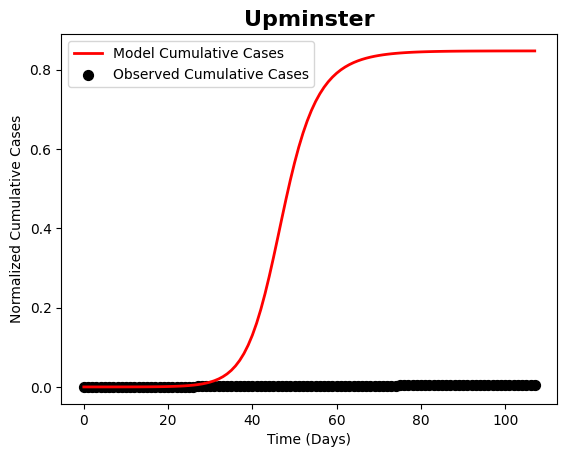

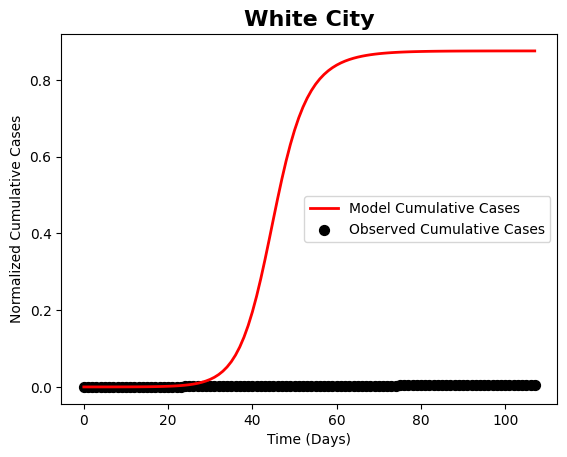

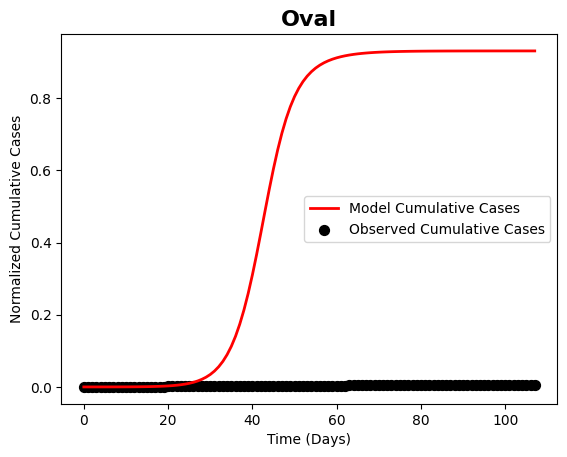

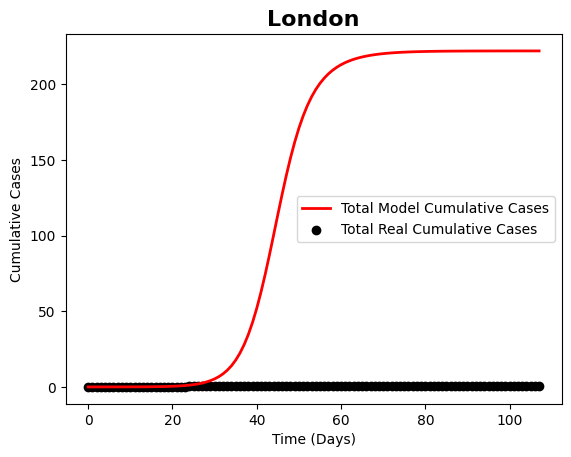

In [34]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

travel_patches = [i for i in valid_patch_indices if i not in home_patches]

def make_detailed_beta(short_beta):
    new_beta_0 = np.zeros(837)
    new_beta_0[:251] = short_beta[:251]
    new_beta_0[251:] = short_beta[-1]
    return new_beta_0

def expand_detailed_beta(detailed_beta):
    big_beta = np.zeros(63001)
    big_beta[home_patches] = detailed_beta[:251]
    big_beta[travel_patches] = detailed_beta[251:]
    return big_beta

# Load best beta values
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    best_beta_yet_0 = pickle.load(file)

best_beta_yet = expand_concise_betas(home_patches,travel_patches,best_beta_yet_0)

def compute_fit_error(model_data, real_data):
    """Compute error as the sum of absolute differences between model and real data."""
    return np.sum(np.abs(model_data - real_data), axis=1)

def plot_best_beta_vs_data(full_timeseries, pop_dict):
    """
    Extracts relevant data, runs the SIR model with best_beta_yet, 
    and plots the beta values against the corresponding observed data in order of fit quality.
    """
    # Load data
    working_timeseries = expand_timeseries(full_timeseries)
    short_pop_vector = np.array(list(pop_dict.values()))
    pop_vector = expand_array(short_pop_vector)
    
    day_list = np.arange(day_range)
    data = np.column_stack((day_list[:, None], working_timeseries))

    tspan = data[:, 0]
    timespan = tspan.shape[0] - 1
    gamma = 1 / 5

    I0 = expand_array(current_cases)
    S0 = pop_vector - I0
    I_total_0 = cum_cases
    
    params = [S0, I0, I_total_0, best_beta_yet, gamma, timespan]
    solution = run_model_London(params)
    y = solution[2]

    I_sum_model = compress_timeseries(y.T,day_range)
    raw_real_data = compress_timeseries(data.T[1:].T,day_range)
    normalizer = compress_array(pop_vector)[:, np.newaxis]
    
    test_data = I_sum_model / normalizer
    real_data = raw_real_data / normalizer

    # Compute error for sorting
    errors = compute_fit_error(test_data, real_data)
    sorted_indices = np.argsort(errors)  # Sort from best (lowest error) to worst (highest error)
    
    # Plot all 251 stations in sorted order
    for rank, i in enumerate(sorted_indices[0:251]):
        if station_list[i] in ["Oval","White City","Upminster"]:
            plt.figure()
            plt.plot(data[:, 0], test_data[i], 'r-', linewidth=2, label='Model Cumulative Cases')
            plt.scatter(data[:, 0], real_data[i], c='k', s=50, label='Observed Cumulative Cases')

            plt.xlabel('Time (Days)')
            plt.ylabel('Normalized Cumulative Cases')
            plt.title(f'{station_list[i]}',fontweight='bold',fontsize=16)
            plt.legend()
            plt.show()
        
    # Plot total summed data across all patches
    summed_model = test_data.sum(axis=0)
    summed_real = real_data.sum(axis=0)

    plt.figure()
    plt.plot(data[:, 0], summed_model, 'r-', linewidth=2, label='Total Model Cumulative Cases')
    plt.scatter(data[:, 0], summed_real, color='k', label='Total Real Cumulative Cases')
    plt.xlabel('Time (Days)')
    plt.ylabel('Cumulative Cases')
    plt.title('London',fontweight='bold',fontsize=16)
    plt.legend()
    plt.show()
    
    return np.array(solution), params

solution, params = plot_best_beta_vs_data(all_station_timeseries, pop_dict)


In [321]:
station_list.index("Knightsbridge")

118

In [4]:
voronoi_gdf

NameError: name 'voronoi_gdf' is not defined

In [7]:
import geopandas as gpd
import numpy as np
import os
import tempfile
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from IPython.display import HTML
from datetime import timedelta, datetime
from tqdm import tqdm  # Progress bar
import IPython


pop_array = np.array(list(pop_dict.values()))

def create_voronoi_gif(solution, params, label_mode="number"):
    output_filename = "london_voronoi_disease.gif"
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")  
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    map_data = solution
    station_data = map_data[1][home_patches]
    
    num_timesteps = station_data.shape[1]
    for i in range(251):
        station_data[i] = station_data[i] / pop_array[i]

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']
    start_date = datetime(2020, 3, 7)

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Frames", unit="frame"):
            color_values = station_data[:, t]
            color_min, color_max = np.nanmin(color_values), np.nanmax(color_values)
            if color_max > color_min:
                voronoi_gdf["color"] = (color_values - color_min) / (color_max - color_min)
            else:
                voronoi_gdf["color"] = 0.5

            fig, ax = plt.subplots(figsize=(6, 6))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(ax=ax, column="color", cmap="plasma", edgecolor="black", linewidth=0.5, alpha=1)
            stations_gdf.plot(ax=ax, color="black", markersize=1)

            label_text = (start_date + timedelta(days=t)).strftime("%m/%d/%Y") if label_mode == "date" else f"t = {t}"
            ax.text(0.5, 1.01, label_text, transform=ax.transAxes, fontsize=12, ha="center", va="bottom", fontweight="bold")
            ax.set_axis_off()
            plt.tight_layout(pad=0)

            temp_filepath = os.path.join(temp_dir, f"frame_{t}.png")
            plt.savefig(temp_filepath, bbox_inches='tight', pad_inches=0)
            plt.close(fig)
            frames.append(imageio.imread(temp_filepath))

        print("Creating GIF...")
        imageio.mimsave(output_filename, frames, duration=3.0, loop=0)

    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')

# Example usage:
create_voronoi_gif(solution, params, label_mode="date")


Generating Frames: 100%|██████████| 138/138 [00:39<00:00,  3.51frame/s]


Creating GIF...


In [26]:
import geopandas as gpd
import numpy as np
import os
import tempfile
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import HTML
from datetime import timedelta, datetime
from tqdm import tqdm

def create_voronoi_gif(solution, params, label_mode="number"):
    output_filename = "london_voronoi_disease_2.gif"
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")  
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    map_data = solution
    station_data = map_data[1][home_patches]
    
    num_timesteps = station_data.shape[1]
    for i in range(station_data.shape[0]):
        station_data[i] = station_data[i] / pop_array[i]

    global_min = np.nanmin(station_data)
    global_max = np.nanmax(station_data)
    global_mid = (global_min + global_max) / 2

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']
    start_date = datetime(2020, 3, 7)

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Frames", unit="frame"):
            color_values = station_data[:, t]
            voronoi_gdf["color"] = color_values

            fig, ax = plt.subplots(figsize=(8, 6))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(
                ax=ax,
                column="color",
                cmap="plasma",
                edgecolor="black",
                linewidth=0.5,
                vmin=global_min,
                vmax=global_max
            )
            stations_gdf.plot(ax=ax, color="black", markersize=1)

            sm = plt.cm.ScalarMappable(cmap="plasma", norm=plt.Normalize(vmin=global_min, vmax=global_max))
            sm.set_array([])  # continuous gradient
            cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.01)
            cbar.set_label("Per Capita Prevalence", fontsize=14)
            cbar.set_ticks([global_min, global_mid, global_max])
            cbar.set_ticklabels([f"{global_min:.2f}", f"{global_mid:.2f}", f"{global_max:.2f}"],fontsize=12)


            label_text = (start_date + timedelta(days=t)).strftime("%m/%d/%Y") if label_mode == "date" else f"t = {t}"
            ax.text(0.5, 1.01, label_text, transform=ax.transAxes, fontsize=16, ha="center", va="bottom", fontweight="bold")
            ax.set_axis_off()
            plt.tight_layout(pad=0)

            temp_filepath = os.path.join(temp_dir, f"frame_{t}.png")
            plt.savefig(temp_filepath, bbox_inches='tight', pad_inches=0, dpi=200)
            plt.close(fig)

            img = Image.open(temp_filepath).convert("RGB").resize((800, 600))
            frames.append(np.array(img))

        print("Creating GIF...")
        imageio.mimsave(output_filename, frames, duration=3.0, loop=0)

    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')
# Example usage:
create_voronoi_gif(solution, params, label_mode="date")



Generating Frames: 100%|██████████| 108/108 [00:53<00:00,  2.00frame/s]


Creating GIF...


In [24]:
def create_voronoi_gif(solution, params, label_mode="number"):
    output_filename = "london_voronoi_disease_2_tight.gif"
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")  
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    map_data = solution
    station_data = map_data[1][home_patches]
    
    num_timesteps = station_data.shape[1]
    for i in range(station_data.shape[0]):
        station_data[i] = station_data[i] / pop_array[i]

    global_min = np.nanmin(station_data)
    global_max = np.nanmax(station_data)
    global_mid = (global_min + global_max) / 2

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']
    start_date = datetime(2020, 3, 7)

    bounds = voronoi_gdf.total_bounds  # [minx, miny, maxx, maxy]
    aspect = (bounds[2] - bounds[0]) / (bounds[3] - bounds[1])  # width / height

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Frames", unit="frame"):
            color_values = station_data[:, t]
            voronoi_gdf["color"] = color_values

            fig_width = 8
            fig_height = fig_width / aspect
            fig, ax = plt.subplots(figsize=(fig_width, fig_height))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(
                ax=ax,
                column="color",
                cmap="plasma",
                edgecolor="black",
                linewidth=0.5,
                vmin=global_min,
                vmax=global_max
            )
            stations_gdf.plot(ax=ax, color="black", markersize=1)

            sm = plt.cm.ScalarMappable(cmap="plasma", norm=plt.Normalize(vmin=global_min, vmax=global_max))
            sm.set_array([])
            cbar = fig.colorbar(sm, ax=ax, fraction=0.025, pad=0.01, extend='both')
            cbar.set_label("Per Capita Prevalence", fontsize=10)
            cbar.set_ticks([global_min, global_mid, global_max])
            cbar.set_ticklabels([f"{global_min:.2f}", f"{global_mid:.2f}", f"{global_max:.2f}"])

            label_text = (start_date + timedelta(days=t)).strftime("%m/%d/%Y") if label_mode == "date" else f"t = {t}"
            ax.text(0.5, 1.01, label_text, transform=ax.transAxes, fontsize=12, ha="center", va="bottom", fontweight="bold")

            ax.set_axis_off()
            fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

            temp_filepath = os.path.join(temp_dir, f"frame_{t}.png")
            fig.savefig(temp_filepath, bbox_inches='tight', pad_inches=0, dpi=200)
            plt.close(fig)

            img = Image.open(temp_filepath).convert("RGB")
            frames.append(np.array(img))

        print("Creating GIF...")
        imageio.mimsave(output_filename, frames, duration=3.0, loop=0)

    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')

create_voronoi_gif(solution, params, label_mode="date")

Generating Frames: 100%|██████████| 108/108 [00:32<00:00,  3.28frame/s]


Creating GIF...


In [25]:
import geopandas as gpd
import numpy as np
import os
import tempfile
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from IPython.display import HTML
from datetime import timedelta, datetime
from tqdm import tqdm

pop_array = np.array(list(pop_dict.values()))

def create_voronoi_gif_with_center(solution, params, label_mode="number"):
    output_filename = "london_voronoi_disease_with_center.gif"
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")  
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    map_data = solution
    station_data = map_data[1][home_patches]
    
    num_timesteps = station_data.shape[1]
    for i in range(251):
        station_data[i] = station_data[i] / pop_array[i]

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']

    station_coords = np.stack([stations_gdf.geometry.x.values, stations_gdf.geometry.y.values], axis=1)
    start_date = datetime(2020, 3, 7)

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Frames", unit="frame"):
            color_values = station_data[:, t]
            color_min, color_max = np.nanmin(color_values), np.nanmax(color_values)
            voronoi_gdf["color"] = (color_values - color_min) / (color_max - color_min) if color_max > color_min else 0.5

            # Compute population-weighted center of infection
            weighted_x = np.sum(station_coords[:, 0] * station_data[:, t] * pop_array) / np.sum(station_data[:, t] * pop_array)
            weighted_y = np.sum(station_coords[:, 1] * station_data[:, t] * pop_array) / np.sum(station_data[:, t] * pop_array)

            fig, ax = plt.subplots(figsize=(6, 6))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(ax=ax, column="color", cmap="plasma", edgecolor="black", linewidth=0.5, alpha=1)
            stations_gdf.plot(ax=ax, color="black", markersize=1)

            ax.plot(weighted_x, weighted_y, marker='+', color='lightgreen', markersize=12, markeredgewidth=3)

            label_text = (start_date + timedelta(days=t)).strftime("%m/%d/%Y") if label_mode == "date" else f"t = {t}"
            ax.text(0.5, 1.01, label_text, transform=ax.transAxes, fontsize=12, ha="center", va="bottom", fontweight="bold")
            ax.set_axis_off()
            plt.tight_layout(pad=0)

            temp_filepath = os.path.join(temp_dir, f"frame_{t}.png")
            plt.savefig(temp_filepath, bbox_inches='tight', pad_inches=0)
            plt.close(fig)
            frames.append(imageio.imread(temp_filepath))

        print("Creating GIF...")
        imageio.mimsave(output_filename, frames, duration=3.0, loop=0)
        IPython.display.clear_output(wait=True)
    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')

# Example usage:
create_voronoi_gif_with_center(solution, params, label_mode="date")


In [22]:
import imageio.v2 as imageio
import numpy as np

def show_gif_frame_by_percent(gif_path, percent, figsize=(12, 12)):
    frame = get_gif_frame_by_percent(gif_path, percent)
    plt.figure(figsize=figsize)
    plt.imshow(frame)
    plt.axis("off")
    plt.show()


show_gif_frame_by_percent("london_voronoi_disease.gif", 51, figsize=(15, 12))



NameError: name 'get_gif_frame_by_percent' is not defined

In [115]:
[0]*21+patch_isolation_effects+[0]*(251-len(patch_isolation_effects)-21)

251

In [128]:
with open("16 Day Patch Isolation Benefits Progress.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

np.array(patch_isolation_effects).shape

(112,)

In [98]:
# Load best beta values
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    best_beta_yet_0 = pickle.load(file)
    
home_betas = best_beta_yet_0[:251]

N = pop_vector.copy()
gamma = 1/5

def calc_F_for_idx(i):
    F = 0
    
    for k in range(251):
        p_k = home_patches[k]
        denom = 0
        for l in range(251):
            p_l = home_patches[l]
            denom += p_matrix[p_l][p_k]
        F += home_betas[k]*p_matrix[i][p_k]*p_matrix[i][p_k]/denom
    
    return F

calc_F_for_idx(0)

patch_Fs = []
for i in range(251):
    patch_Fs.append(calc_F_for_idx(home_patches[i]))
patch_Fs = np.array(patch_Fs)
patch_Fs

gamma = 1/5

patch_R0s = patch_Fs/gamma
patch_R0s

array([1.17039283, 1.33861279, 0.9088621 , 1.62467117, 1.03450849,
       1.27773496, 1.14123533, 1.53220884, 0.83490154, 1.29015176,
       0.56609841, 1.20759135, 1.07461158, 1.4103161 , 1.2522853 ,
       1.44628446, 1.42075226, 1.37175937, 1.50058778, 0.84844916,
       1.15462716, 1.17893164, 1.05923372, 1.63317661, 1.37279709,
       1.43289253, 1.03000892, 1.4077901 , 1.42590131, 1.1756708 ,
       1.30938556, 1.39036987, 1.01488396, 1.45685928, 0.43249607,
       1.162806  , 1.40823558, 1.70750319, 1.39271339, 1.05154734,
       1.02656781, 1.45014613, 1.37119958, 1.7223796 , 1.76799818,
       1.46985023, 1.33369297, 1.26230182, 1.4996377 , 1.20423367,
       1.24650814, 1.44103653, 1.32201129, 1.6759768 , 0.79083738,
       1.29014215, 1.00023529, 1.37281524, 1.19930165, 1.17635941,
       1.5385135 , 1.07271939, 1.28946235, 1.47565694, 1.37100457,
       1.33071405, 1.14188028, 1.05946543, 0.74508061, 1.07692495,
       1.42233156, 0.85672489, 1.25491555, 1.22838455, 0.88544

In [107]:



# Build adjacency matrix
station_names = list(station_geom.keys())
name_to_idx = {name: idx for idx, name in enumerate(station_names)}
n = len(station_names)

adj_matrix = np.zeros((n, n))
for s1, s2 in selected_pairs:
    if s1 in name_to_idx and s2 in name_to_idx:
        i, j = name_to_idx[s1], name_to_idx[s2]
        adj_matrix[i, j] = 1
        adj_matrix[j, i] = 1  # undirected

# Degree
degrees = adj_matrix.sum(axis=1)

# Correlate degree vs isolation effect
from scipy.stats import spearmanr
spearmanr(degrees, patch_isolation_effects)


SignificanceResult(statistic=np.float64(0.177262259571642), pvalue=np.float64(0.004852217150978136))

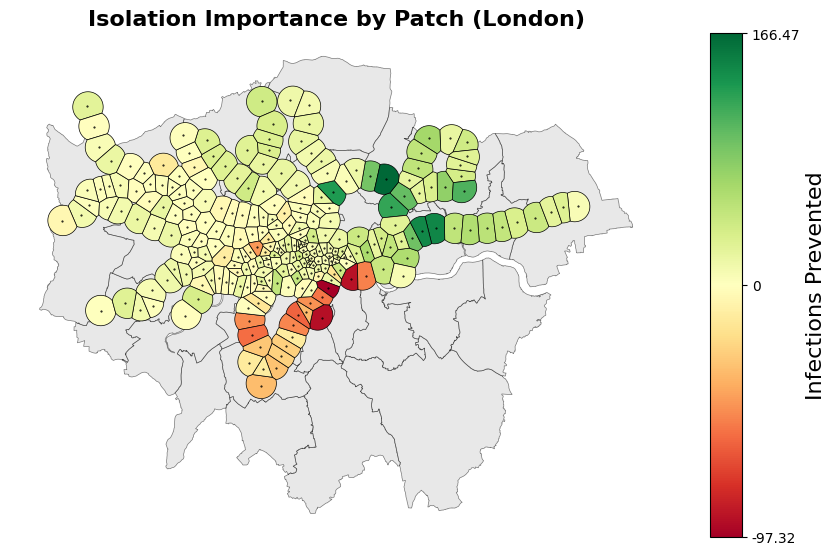

In [129]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle

with open("8 Day Patch Isolation Benefits London.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

def plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector, title="Isolation Importance by Patch (London)"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    if len(patch_isolation_effects) < 251:
        patch_isolation_effects = np.concatenate([patch_isolation_effects, np.zeros(251 - len(patch_isolation_effects))])

    if len(short_pop_vector) < 251:
        short_pop_vector = np.concatenate([short_pop_vector, np.ones(251 - len(short_pop_vector))])

    effects_normalized = patch_isolation_effects
    voronoi_gdf["effects"] = effects_normalized

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    vmin = voronoi_gdf["effects"].min()
    vmax = voronoi_gdf["effects"].max()

    norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap="RdYlGn", norm=norm)
    sm.set_array([])

    voronoi_gdf.plot(
        ax=ax,
        column="effects",
        cmap="RdYlGn",
        norm=norm,
        edgecolor="black",
        linewidth=0.5,
        alpha=1,
    )

    # Manually create the colorbar
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label("Infections Prevented", fontsize=16)
    cbar.set_ticks([vmin, 0, vmax])  # Always show min, 0, and max
    cbar.ax.set_yticklabels([f"{vmin:.2f}", "0", f"{vmax:.2f}"])

    voronoi_centroids = voronoi_gdf.to_crs(epsg=27700).centroid
    voronoi_centroids = gpd.GeoSeries(voronoi_centroids, crs="EPSG:27700").to_crs(london_gdf.crs)
    voronoi_centroids.plot(ax=ax, color="black", markersize=0.25)

    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector)


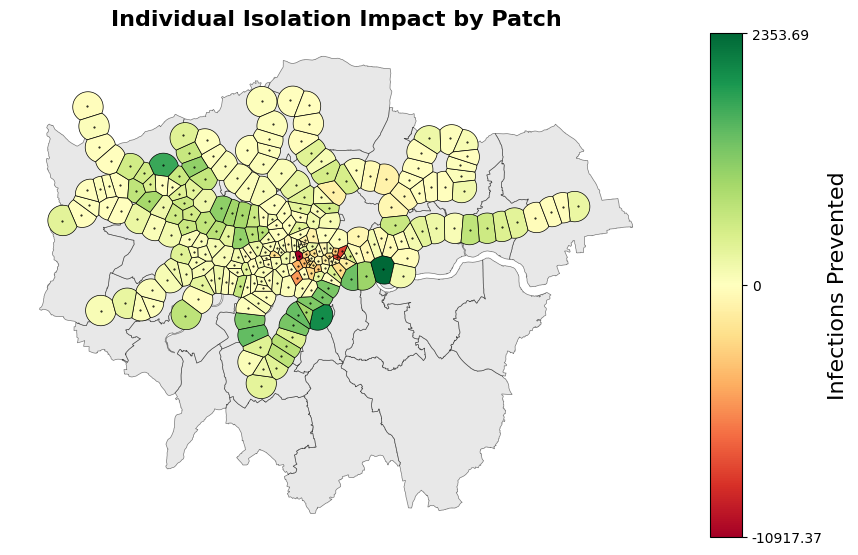

In [6]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle

with open("8 Day Patch Isolation Benefits London.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)
    
with open("Longer 60 Day Take 2 16 Day Patch Isolation Benefits Progress.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

patch_isolation_effects = patch_isolation_effects + [0]*(251-len(patch_isolation_effects))

def plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector, title="Individual Isolation Impact by Patch"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    if len(patch_isolation_effects) < 251:
        patch_isolation_effects = np.concatenate([patch_isolation_effects, np.zeros(251 - len(patch_isolation_effects))])
    if len(short_pop_vector) < 251:
        short_pop_vector = np.concatenate([short_pop_vector, np.ones(251 - len(short_pop_vector))])

    voronoi_gdf["effects"] = patch_isolation_effects

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    vmin = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].min()
    vmax = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].max()
    norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap="RdYlGn", norm=norm)
    sm.set_array([])

    # Plot nonzero patches normally
    nonzero = voronoi_gdf["effects"] != 0
    voronoi_gdf[nonzero].plot(
        ax=ax,
        column="effects",
        cmap="RdYlGn",
        norm=norm,
        edgecolor="black",
        linewidth=0.5,
        alpha=1,
    )

    # Plot zero patches manually as gray, only if any exist
    if (~nonzero).any():
        voronoi_gdf[~nonzero].plot(
            ax=ax,
            color="gray",
            edgecolor="black",
            linewidth=0.5,
            alpha=1,
        )


    # Colorbar
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label("Infections Prevented", fontsize=16)
    cbar.set_ticks([vmin, 0, vmax])
    cbar.ax.set_yticklabels([f"{vmin:.2f}", "0", f"{vmax:.2f}"])
    
    voronoi_centroids = voronoi_gdf.to_crs(epsg=27700).centroid
    voronoi_centroids = gpd.GeoSeries(voronoi_centroids, crs="EPSG:27700").to_crs(london_gdf.crs)
    voronoi_centroids.plot(ax=ax, color="black", markersize=0.25)

    # voronoi_gdf["geometry"].centroid.plot(ax=ax, color="black", markersize=0.25)

    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector)



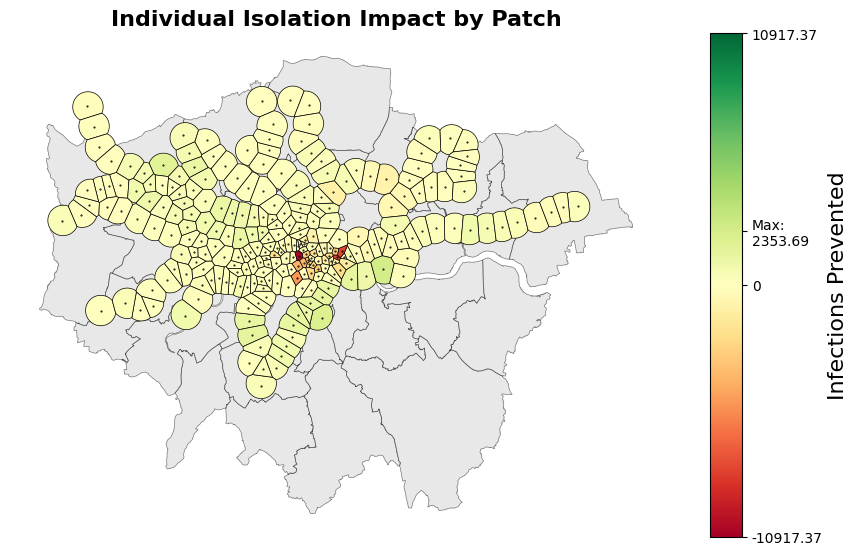

In [8]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle

with open("8 Day Patch Isolation Benefits London.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)
    
with open("Longer 60 Day Take 2 16 Day Patch Isolation Benefits Progress.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

patch_isolation_effects = patch_isolation_effects + [0]*(251 - len(patch_isolation_effects))

def plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector, title="Individual Isolation Impact by Patch"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    if len(patch_isolation_effects) < 251:
        patch_isolation_effects = np.concatenate([patch_isolation_effects, np.zeros(251 - len(patch_isolation_effects))])
    if len(short_pop_vector) < 251:
        short_pop_vector = np.concatenate([short_pop_vector, np.ones(251 - len(short_pop_vector))])

    voronoi_gdf["effects"] = patch_isolation_effects

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    # Symmetric coloring setup
    vmin_raw = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].min()
    vmax_raw = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].max()
    abs_max = max(abs(vmin_raw), abs(vmax_raw))
    vmin, vmax = -abs_max, abs_max

    norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap="RdYlGn", norm=norm)
    sm.set_array([])

    # Plot nonzero patches
    nonzero = voronoi_gdf["effects"] != 0
    voronoi_gdf[nonzero].plot(
        ax=ax,
        column="effects",
        cmap="RdYlGn",
        norm=norm,
        edgecolor="black",
        linewidth=0.5,
        alpha=1,
    )

    # Zero patches
    if (~nonzero).any():
        voronoi_gdf[~nonzero].plot(
            ax=ax,
            color="gray",
            edgecolor="black",
            linewidth=0.5,
            alpha=1,
        )

    # Colorbar
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label("Infections Prevented", fontsize=16)

    ticks = [vmin, 0, vmax]
    tick_labels = [f"{vmin:.2f}", "0", f"{vmax:.2f}"]

    if np.abs(vmin_raw - vmin) > 1e-5:
        ticks.insert(0, vmin_raw)
        tick_labels.insert(0, f"Min:\n{vmin_raw:.2f}")
    if np.abs(vmax_raw - vmax) > 1e-5:
        ticks.append(vmax_raw)
        tick_labels.append(f"Max:\n{vmax_raw:.2f}")

    cbar.set_ticks(ticks)
    cbar.ax.set_yticklabels(tick_labels)

    # Centroids (optional, small black dots)
    voronoi_centroids = voronoi_gdf.to_crs(epsg=27700).centroid
    voronoi_centroids = gpd.GeoSeries(voronoi_centroids, crs="EPSG:27700").to_crs(london_gdf.crs)
    voronoi_centroids.plot(ax=ax, color="black", markersize=0.25)

    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector)


In [192]:
sorted_indices = np.argsort(-1*np.array(patch_isolation_effects))
sorted_names = [station_list[i] for i in sorted_indices]
sorted_values = np.array(patch_isolation_effects)[sorted_indices]

for name, value in zip(sorted_names, sorted_values):
    print(f"{name}: {value}")

Walthamstow Central: 746.2524419641122
East Ham: 587.380641003605
Upton Park: 543.2896574367769
Leyton: 496.64420748036355
Stepney Green: 445.8432224635035
Leytonstone: 395.05086763575673
Manor House: 389.4588320022449
Plaistow: 321.01587732415646
Newbury Park: 239.7472172169946
London Bridge: 220.50561485113576
Gants Hill: 175.30760016059503
Kew Gardens: 168.15401258412749
Roding Valley: 133.31063011055812
Elm Park: 128.9342368976213
Latimer Road: 122.55415717000142
Victoria: 114.37731131818146
Ladbroke Grove: 113.37540842825547
South Woodford: 112.79492196300998
Upminster Bridge: 94.22988631715998
Oxford Circus: 91.90756333293393
Blackhorse Road: 91.69645206443965
Seven Sisters: 90.7445454383269
High Barnet: 85.2729064123705
Mile End: 84.41357469558716
Grange Hill: 84.1013157106936
West Ham: 82.26252406043932
Turnpike Lane: 81.33128128619865
Croxley: 79.03747486835346
Waterloo: 77.38198877777904
Paddington: 74.92826675763354
East Acton: 72.63411864358932
Redbridge: 71.71889794059098


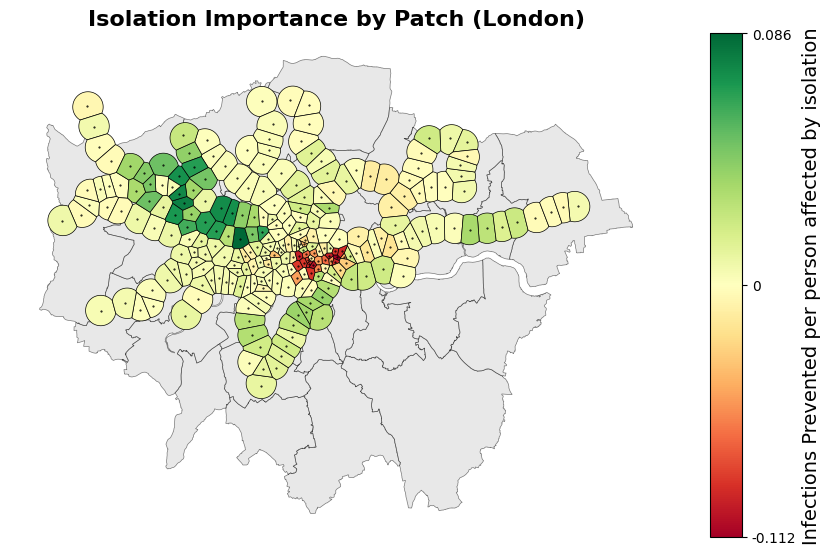

In [38]:
with open("London P Populations.pkl", "rb") as file:
    p_populations = pickle.load(file)

p_populations *= np.sum(short_pop_vector)/np.sum(p_populations)

people_affected_by_isolation = []

for home in range(251):
    #home people going to work
    people = np.sum(p_populations[home])-p_populations[home][home]
    
    #people coming to work in home
    people += np.sum(p_populations.T[home])-p_populations[home][home]
    
    people_affected_by_isolation.append(people)
    
people_affected_by_isolation

import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle

with open("Longer 60 Day Take 2 16 Day Patch Isolation Benefits Progress.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

def plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector, title="Isolation Importance by Patch (London)"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    # Pad patch_isolation_effects if needed
    if len(patch_isolation_effects) < len(voronoi_gdf):
        patch_isolation_effects = np.concatenate([patch_isolation_effects, np.zeros(len(voronoi_gdf) - len(patch_isolation_effects))])

    # Now safe to divide
    effects = np.array(patch_isolation_effects) / (0.9*np.array(people_affected_by_isolation))
    voronoi_gdf["effects"] = effects

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    vmin = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].min()
    vmax = voronoi_gdf.loc[voronoi_gdf["effects"] != 0, "effects"].max()
    norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap="RdYlGn", norm=norm)
    sm.set_array([])

    # Plot nonzero patches with gradient
    nonzero = voronoi_gdf["effects"] != 0
    voronoi_gdf[nonzero].plot(
        ax=ax,
        column="effects",
        cmap="RdYlGn",
        norm=norm,
        edgecolor="black",
        linewidth=0.5,
        alpha=1,
    )


    # Colorbar
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label("Infections Prevented per person affected by isolation", fontsize=14)
    cbar.set_ticks([vmin, 0, vmax])
    cbar.ax.set_yticklabels([f"{vmin:.3f}", "0", f"{vmax:.3f}"])

    voronoi_centroids = voronoi_gdf.to_crs(epsg=27700).centroid
    voronoi_centroids = gpd.GeoSeries(voronoi_centroids, crs="EPSG:27700").to_crs(london_gdf.crs)
    voronoi_centroids.plot(ax=ax, color="black", markersize=0.25)


    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_isolation_effects_map_london(patch_isolation_effects, short_pop_vector)



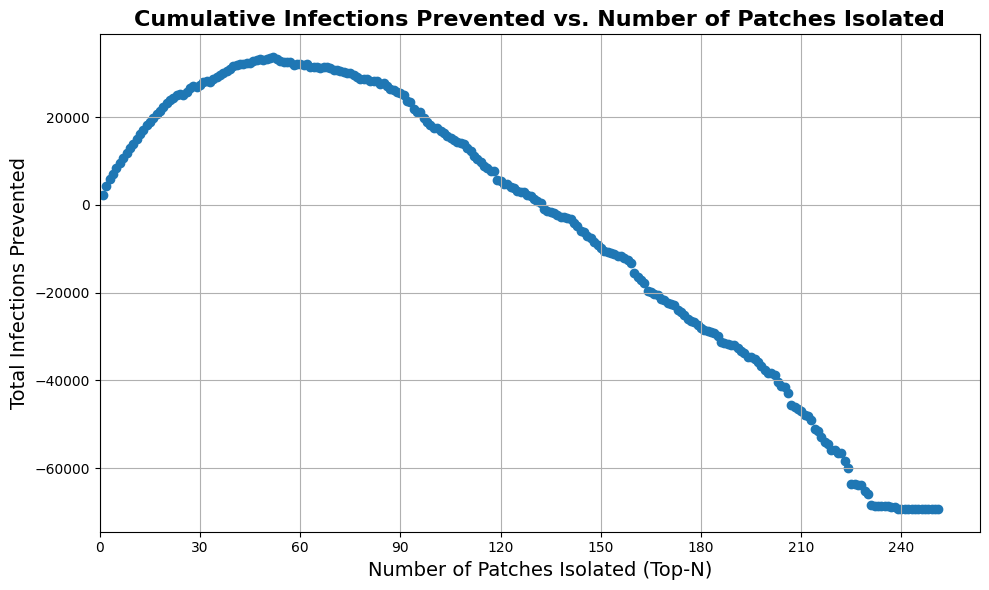

NameError: name 'patch_isolation_effects' is not defined

In [5]:
with open("Longer 60 Day take 2 total_infections_prevented_progress.pkl", 'rb') as file:
    total_infections_prevented = pickle.load(file)


x_vals = np.arange(1, len(total_infections_prevented)+ 1)

plt.figure(figsize=(10,6))
plt.scatter(x_vals, total_infections_prevented, marker='o')
plt.xlabel('Number of Patches Isolated (Top-N)', fontsize=14)
plt.ylabel('Total Infections Prevented', fontsize=14)
plt.title('Cumulative Infections Prevented vs. Number of Patches Isolated', fontsize=16, fontweight='bold')
plt.grid(True)
plt.tight_layout()
plt.xlim(left=0)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.show()

best_top_n = np.argmax(total_infections_prevented) + 1  # +1 because x_vals starts at 1

patch_isolation_effects = np.array(patch_isolation_effects)
# Now, get the top-N values from patch_isolation_effects
top_n_values = np.sort(patch_isolation_effects)[-best_top_n:]  # largest N values


top_n_indices = np.argsort(patch_isolation_effects)[-best_top_n:]
top_n_values = patch_isolation_effects[top_n_indices]

print(top_n_indices,"\n\n",top_n_values,"\n\n",top_n_values.shape[0])

In [7]:

with open("Longer 60 Day Take 2 16 Day Patch Isolation Benefits Progress.pkl", 'rb') as file:
    patch_isolation_effects = pickle.load(file)

patch_isolation_effects = np.array(patch_isolation_effects)

top_n_values = np.sort(patch_isolation_effects)[-52:]  # largest N values


top_n_indices = np.argsort(patch_isolation_effects)[-52:]
top_n_values = patch_isolation_effects[top_n_indices]

In [10]:
selected_indices.shape

(52,)

In [11]:
colors

UsageError: %colors: you must specify a color scheme. See '%colors?'


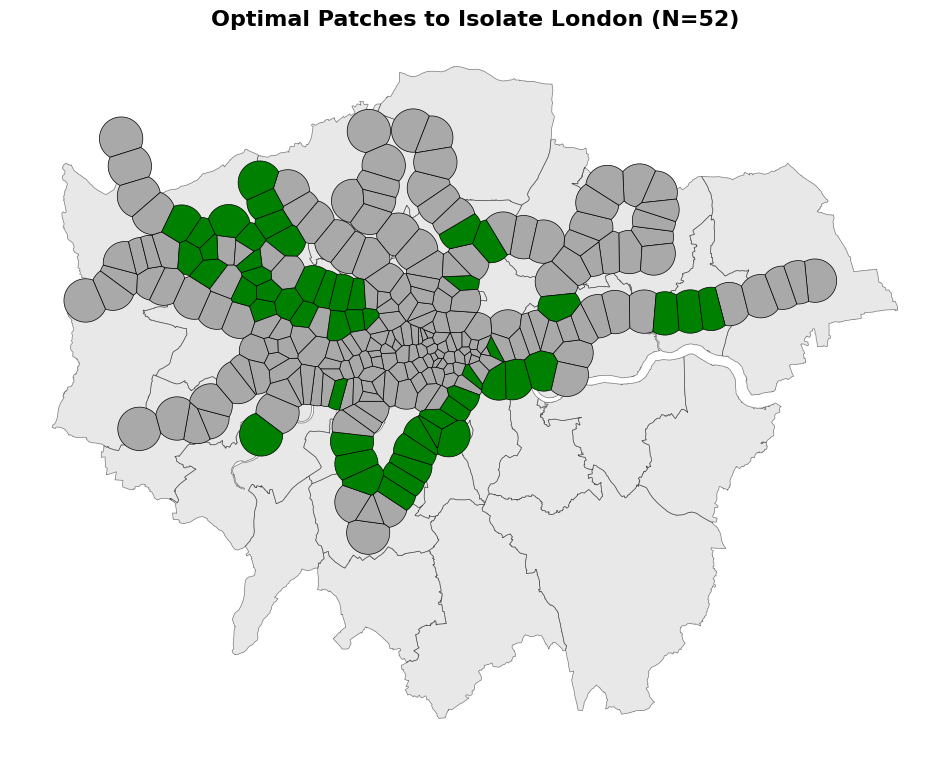

In [18]:
import geopandas as gpd


selected_indices = top_n_indices.copy()  # example selected indices

def plot_selected_patches_london(selected_indices, title="Optimal Patches to Isolate London (N=52)"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    colors = np.full(len(voronoi_gdf), 'darkgrey')
    colors[selected_indices] = 'green'
    voronoi_gdf['color'] = colors

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
    voronoi_gdf.plot(ax=ax, color=voronoi_gdf['color'], edgecolor="black", linewidth=0.5)

    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_selected_patches_london(selected_indices)


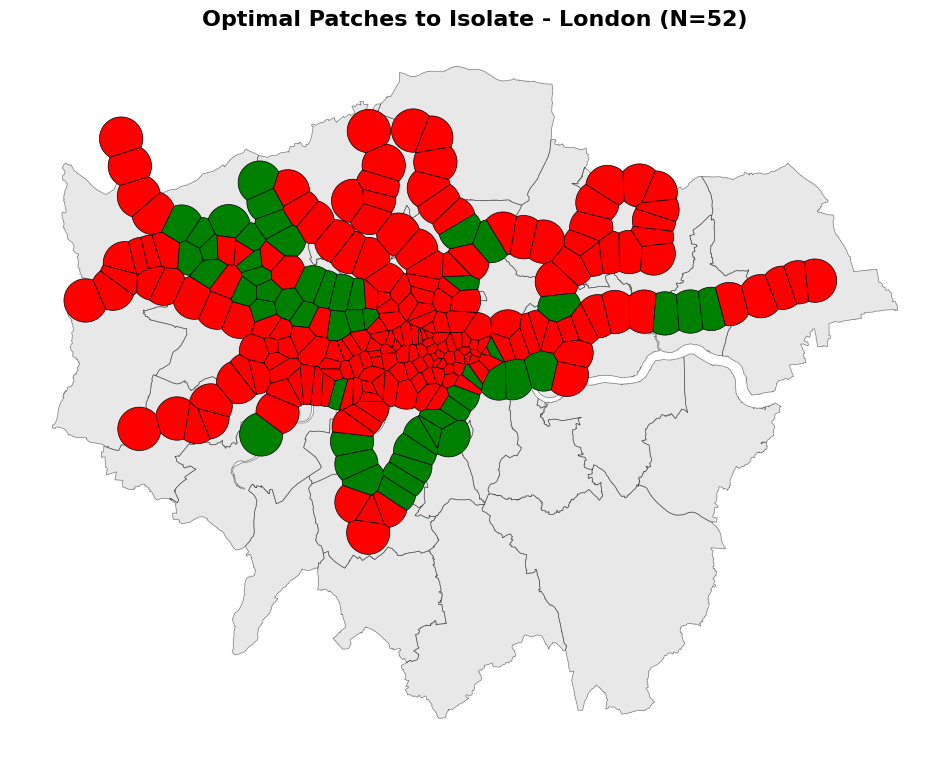

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

selected_indices = top_n_indices.copy()  # example selected indices

def plot_selected_patches_london(selected_indices, title="Optimal Patches to Isolate - London (N=52)"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Assign colors: green if selected, red otherwise
    colors = np.where(np.isin(np.arange(len(voronoi_gdf)), selected_indices), 'green', 'red')
    voronoi_gdf['color'] = colors

    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
    voronoi_gdf.plot(ax=ax, color=voronoi_gdf['color'], edgecolor="black", linewidth=0.5, alpha=1)

    ax.set_title(title, fontweight='bold', fontsize=16)
    ax.axis("off")
    plt.show()

# Call
plot_selected_patches_london(selected_indices)

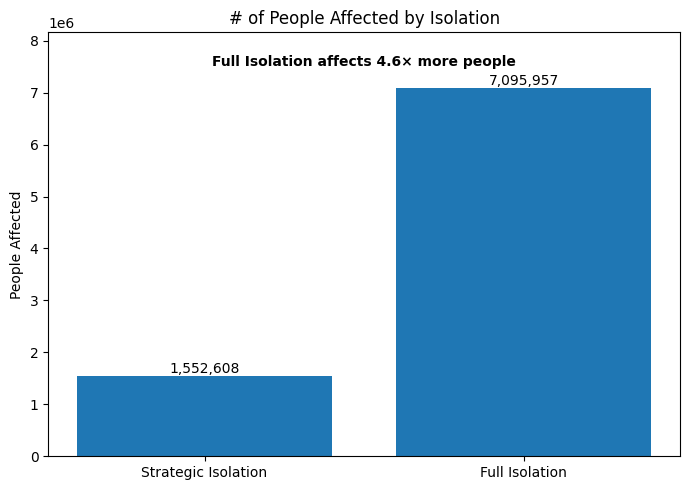

In [75]:
people_affected_by_isolation = np.array(people_affected_by_isolation)
best_iso_affected_ppl = 0.9*np.sum(people_affected_by_isolation[np.array(top_n_indices)])

full_iso_affected_ppl = 0.9*np.sum(people_affected_by_isolation)

# Values
values = [best_iso_affected_ppl, full_iso_affected_ppl]
labels = ['Strategic Isolation', 'Full Isolation']

# Plot
plt.figure(figsize=(7,5))
bars = plt.bar(labels, values)
plt.ylabel('People Affected')
plt.title('# of People Affected by Isolation')

# Add text labels above bars
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
             f'{int(value):,}', ha='center', va='bottom', fontsize=10)

# Add ratio text separately
ratio = full_iso_affected_ppl / best_iso_affected_ppl
plt.text(0.5, max(values)*1.05, 
         f'Full Isolation affects {ratio:.1f}× more people', 
         ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylim(0, max(values)*1.15)  # add extra space for text
plt.tight_layout()
plt.show()


In [28]:
# PIECEWISE FUNCTION
# Define function to process solution
def process_solution(solution,timesteps):
    # Grouping by station subpopulation
    S_sol = solution[:63001]
    I_sol = solution[63001:126002]
    I_sol_total = solution[126002:]

    return [S_sol,I_sol,I_sol_total]



def run_model_London_with_isolation(params):
    S0,I0,I_total0,beta,gamma,timesteps = params
    
    if beta.shape[0]==837:
        beta = expand_betas(beta,63001)

    
    # Ensure no dividing by zero
    Nj[Nj == 0] = 1
    
    # Set up initial y0 vector
    y0 = np.concatenate((S0,I0,I_total0))
    
    # beta_p_matrix = (beta*p_matrix.T).T
    # beta_p_matrix = beta[:, None] * p_matrix 
    beta_p_matrix = sparse_p.multiply(beta[:, None])
    
    t = np.linspace(0,timesteps-1,num=timesteps)
    
    
    
    def sir(y,timestep,used_p,used_p_sparse,bpm):
        S = y[:63001]
        I = y[63001:126002]
        I_total = y[126002:]

        dSdt = np.zeros_like(S)
        dIdt = np.zeros_like(I)
        dI_totaldt = np.zeros_like(I_total)

        Ij = used_p.T @ I
        
        
        method = "vector"
        
        if method == "vector":

            # Compute Ij_div_Nj efficiently
            Ij_div_Nj = Ij / Nj  # Shape (63001,)
        
            # Vectorized computation of infection terms using sparse matrix multiplication
            infection_terms = bpm.multiply(S[:, None])  # (63001, 63001)
            infection_terms = infection_terms @ Ij_div_Nj  # (63001,)
        
            # Update derivatives
            dSdt -= infection_terms
            dIdt += infection_terms
            

        else:
            # Essentially, for all i, all j, dSdt[i] += -beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
            for i in valid_patch_indices:
                for j in valid_patch_indices:
                    dSdt[i] += -beta[j]*used_p[i][j]*S[i]*Ij[j]/Nj[j]
            dIdt -= dSdt
    
        dI_totaldt += dIdt

        # Add the gamma terms
        dIdt -= gamma * I
        # dSdt += gamma * I

        # Concatenate results
        dx = np.concatenate((dSdt, dIdt, dI_totaldt))

        return dx
    
    y_log = np.zeros((len(t)+1,189003))
    y_log[0] = y0.copy()
    
    beta_p_matrix = sparse_p.multiply(beta[:, None])
    
    fitting_days = 16
    isolation_period = 60

    for step in range(len(t)):
        if step == fitting_days:
            beta_p_matrix = sparse_second_p.multiply(beta[:, None])
        if step == (fitting_days+isolation_period):
            beta_p_matrix = sparse_p.multiply(beta[:, None])
            
        if step >= fitting_days and step < (fitting_days+isolation_period):
            results = sir(y_log[step],step,second_p_matrix,sparse_second_p,beta_p_matrix)
        else:
            results = sir(y_log[step],step,p_matrix,sparse_p,beta_p_matrix)
        # print("step:",step)
        y_log[step+1] = y_log[step] + results
    
    solution = process_solution(y_log.T,timesteps)
    
    return solution
    
    
def plot_best_beta_vs_data_with_isolation(full_timeseries, pop_dict):
    """
    Extracts the relevant data, runs the SIR model with best_beta_yet, 
    and plots the beta values against the corresponding observed data.

    Parameters:
        full_timeseries (array-like): The full dataset of observed values.
        pop_dict (dict): Dictionary mapping population values.
    """
     # Load data
    working_timeseries = expand_timeseries(full_timeseries,day_range)
    
    short_pop_vector = np.array(list(pop_dict.values()))
    pop_vector = expand_array(short_pop_vector)
    
    day_list = np.arange(day_range)  # There are day_range days

    # Stack so each row is [day_index, corresponding 9 values]
    data = np.column_stack((day_list[:, None], working_timeseries))

    tspan = data[:, 0]
    timespan = tspan.shape[0] - 1
    gamma = 1 / 5

    # print(data.shape)
    
    I0 = np.zeros(63001)
    I0[home_patches] = current_cases
    S0 = pop_vector - I0
    I_total_0 = cum_cases
    
    params = [S0, I0, I_total_0, best_beta_yet, gamma, timespan]
    solution = run_model_London_with_isolation(params)
    y = solution[2]

    I_sum_model = compress_timeseries(y.T,day_range)
    raw_real_data = compress_timeseries(data.T[1:].T,day_range)
    normalizer = compress_array(pop_vector)[:, np.newaxis]
    test_data = I_sum_model / normalizer
    real_data = raw_real_data / normalizer

    # Get indices of the 10 stations with the highest total populations
    top_10_indices = np.argsort(-short_pop_vector)[:10]
    

    # Plot results
    # for i in top_10_indices:
        # plt.figure()
        # plt.plot(data[:, 0], test_data[i], 'r-', linewidth=2, label='Model Cumulative Cases')
        # plt.scatter(data[:, 0], real_data[i], c='k', s=50, label='Observed Cumulative Cases')

        # plt.xlabel('Time (Days)')
        # plt.ylabel('Normalized Cases')
        # plt.title(f'Beta Model vs Observed Data for Station {station_list[i]}')
        # plt.legend()
        # plt.show()
        
    # Plot total summed data across all patches
    summed_model = test_data.sum(axis=0)
    summed_real = real_data.sum(axis=0)

    # plt.figure()
    # plt.plot(data[:, 0], summed_model, 'r-', linewidth=2, label='Total Model Cumulative Cases')
    # plt.plot(data[:, 0], summed_real, 'k--', linewidth=2, label='Total Observed Cumulative Cases')
    # plt.xlabel('Time (Days)')
    # plt.ylabel('Summed Cumulative Cases')
    # plt.title('Total Model vs Observed Data Across All Patches')
    # plt.legend()
    # plt.show()
        
    return np.array(solution),params

In [269]:
# --- Precompute everything outside the function ---

def convert_back_to_classic_p(fourth_phase):
    fifth_phase = np.zeros((63001,63001))

    for i in range(63001):
        connection = connections_list[i]
        home_patch = connection[0]
        home_index = connections_list.index((home_patch,home_patch))
        fifth_phase[home_index] += fourth_phase[i]

    sixth_phase = np.zeros((63001,63001))

    for i in range(63001):
        if np.sum(fifth_phase[i]) != 0:
            sixth_phase[i] = fifth_phase[i]/np.sum(fifth_phase[i])
        else:
            sixth_phase[i][i] = 1
    
    return sixth_phase

# Assume station_list, pairs_list, home_patches already defined
station_idx_map = {station: idx for idx, station in enumerate(station_list)}
home_patches = np.array(home_patches)

station_to_rows = {}
row_home_patches = np.empty(len(pairs_list[:63001]), dtype=int)

for i, pair in enumerate(pairs_list[:63001]):
    home = home_patches[station_idx_map[pair[0]]]
    row_home_patches[i] = home
    for station in pair:
        station_to_rows.setdefault(station, []).append(i)

# (Optional) Preconvert patch indices to station names
def get_patch_station_names(patch_indices, station_list):
    return [station_list[idx] for idx in patch_indices]

def full_sparse_isolate_ultrafast_csr(sparse_expanded_p_matrix, patch_station_names, station_to_rows, row_home_patches, modification=0.9):
    affected_rows = set()
    for station_name in patch_station_names:
        affected_rows.update(station_to_rows.get(station_name, []))
    
    if not affected_rows:
        return sparse_expanded_p_matrix.copy()

    affected_rows = np.array(list(affected_rows), dtype=int)

    p_csr = sparse_expanded_p_matrix.copy().tocsr()

    for row in affected_rows:
        start, end = p_csr.indptr[row], p_csr.indptr[row+1]
        if start == end:
            continue
        
        cols = p_csr.indices[start:end]
        data = p_csr.data[start:end]

        original_total = np.sum(data)
        data *= (1 - modification)
        reduced_total = np.sum(data)
        correction = original_total - reduced_total

        home = row_home_patches[row]
        home_idx = np.where(cols == home)[0]
        
        if home_idx.size > 0:
            data[home_idx[0]] += correction
        else:
            p_csr = insert_into_csr(p_csr, row, home, correction)

    return p_csr

def insert_into_csr(csr, row, col, value):
    new_indices = np.insert(csr.indices[csr.indptr[row]:csr.indptr[row+1]], 0, col)
    new_data = np.insert(csr.data[csr.indptr[row]:csr.indptr[row+1]], 0, value)

    sorted_idx = np.argsort(new_indices)
    new_indices = new_indices[sorted_idx]
    new_data = new_data[sorted_idx]

    csr.indices = np.concatenate([
        csr.indices[:csr.indptr[row]],
        new_indices,
        csr.indices[csr.indptr[row]:]
    ])
    csr.data = np.concatenate([
        csr.data[:csr.indptr[row]],
        new_data,
        csr.data[csr.indptr[row]:]
    ])
    csr.indptr[row+1:] += 1

    return csr






from scipy.sparse import csr_matrix
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # Import tqdm for progress bar

with open("combined_travel_times.pkl", "rb") as file:
    travel_times = pickle.load(file)

connections_list = []
for i in range(251):
    for j in range(251):
        connections_list.append((station_list[i],station_list[j]))

travel_vector = np.zeros(63001)
for i in range(63001):
    current_leg = connections_list[i]
    if current_leg[0]==current_leg[1]:
        travel_vector[i] = 8/24
    else:
        if current_leg in list(travel_times.keys()):
            travel_vector[i] = travel_times[current_leg]/(60*24)


# Define time range
# timesteps = 8
# tspan = np.linspace(0, timesteps, timesteps+1)

# Initialize storage for results
# isolated_patches = np.array([0])  # [0, 5, 10, ..., 50]
isolated_patches = top_n_indices.copy()
patch_station_names = get_patch_station_names(isolated_patches, station_list)
isolation_strength = 0.9
infection_sums = []
modified_expanded_p_matrix = sparse_expanded_p_matrix.copy()

for patch in tqdm(isolated_patches, desc="Isolating patches"):
    modified_expanded_p_matrix = full_sparse_isolate_ultrafast_csr(
                                                                    sparse_expanded_p_matrix,
                                                                    patch_station_names,
                                                                    station_to_rows,
                                                                    row_home_patches,
                                                                    modification=0.9
                                                                ).toarray()



    
second_p_matrix = convert_back_to_classic_p(modified_expanded_p_matrix)
sparse_second_p = csr_matrix(second_p_matrix)


Isolating patches: 100%|██████████| 59/59 [03:18<00:00,  3.37s/it]


In [266]:
patch_station_names

['West Brompton',
 'Fairlop',
 'Tottenham Hale',
 'Northwood Hills',
 'Hainault',
 'Canning Town',
 'West Finchley',
 'Totteridge & Whetstone',
 'Highgate',
 'Parsons Green',
 'Elephant & Castle',
 'Goldhawk Road',
 'Southwark',
 'Hornchurch',
 'Redbridge',
 'East Acton',
 'Paddington',
 'Wood Green',
 'Waterloo',
 'Croxley',
 'Turnpike Lane',
 'West Ham',
 'Grange Hill',
 'Mile End',
 'High Barnet',
 'Seven Sisters',
 'Blackhorse Road',
 'Oxford Circus',
 'Upminster Bridge',
 'Woodford',
 'South Woodford',
 'Ladbroke Grove',
 'Victoria',
 'Latimer Road',
 'Elm Park',
 'Roding Valley',
 'Whitechapel',
 'Kew Gardens',
 'Gants Hill',
 'London Bridge',
 'Newbury Park',
 'Plaistow',
 'Manor House',
 'Leytonstone',
 'Stepney Green',
 'Leyton',
 'Upton Park',
 'East Ham',
 'Walthamstow Central']

In [265]:
p_matrix-second_p_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [275]:
solution_with_iso,params_with_iso = plot_best_beta_vs_data_with_isolation(all_station_timeseries, pop_dict)

In [40]:
import matplotlib.pyplot as plt
import numpy as np

y1_sum = solution[2][home_patches].sum(axis=0)  # shape (16,)
y2_sum = solution_best_iso[2][home_patches].sum(axis=0)  # shape (16,)
# y3_sum = solution_full_iso[2][home_patches].sum(axis=0)
timesteps = np.arange(solution.shape[2])

plt.figure(figsize=(8,6))
plt.plot(timesteps, y1_sum, label='No Isolation')
plt.plot(timesteps, y2_sum, label='Strategic Isolation', linestyle='--')
# plt.plot(timesteps, y3_sum, label='Full Isolation', linestyle=':')
plt.xlabel('Timestep')
plt.ylabel('Total Value Across Patches')
plt.title('Total Values Over Time')
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'solution_best_iso' is not defined

In [272]:
y1_sum-y2_sum

array([     0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,    -32.73846247,    -45.74447117,    -60.57197887,
          -77.24437089,    -95.67794703,   -115.61727911,   -136.53788329,
         -157.49891568,   -176.9187662 ,   -192.23089707,   -199.35302263,
         -191.86558374,   -159.74031949,    -87.38180541,     49.356544  ,
          287.63297422,    684.08573093,   1323.78417409,   2331.73634187,
         3885.9375848 ,   6228.73696141,   9669.71670174,  14568.90271683,
        21286.37556832,  30088.10979145,  41013.75008341,  53740.47975861,
        67505.63155866,  81154.012631  ,  93334.37787   , 102795.4064095 ,
       108671.90602251, 110651.75604245, 108974.35416904, 104289.09684455,
        97450.25579671,  

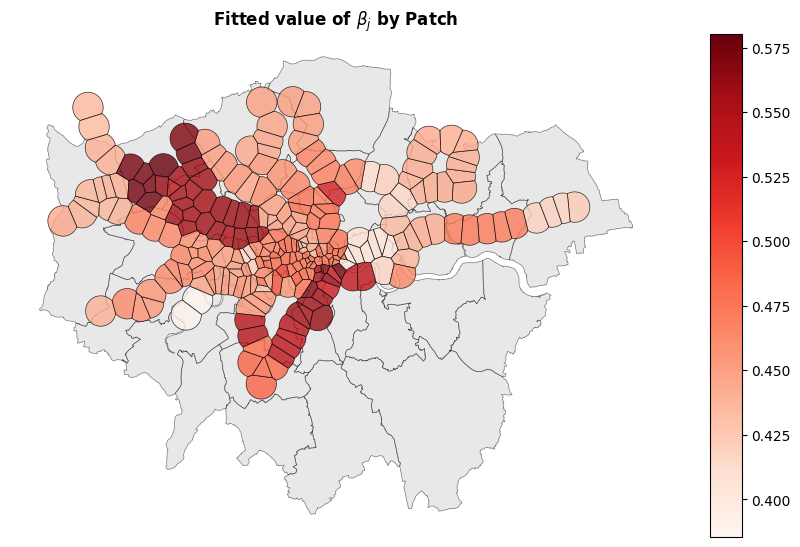

In [121]:
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

home_betas = best_beta_yet[home_patches]
home_betas.shape

def plot_beta_map(beta_array, title="Fitted value of $\\beta_j$ by Patch"):
    """
    Plots Voronoi patches of London colored by beta values,
    with boroughs in the background, station dots, and a shortened colorbar.

    Parameters:
    - beta_array: Array of beta values (length must match number of Voronoi regions).
    - title: Title of the plot.
    """
    # Load data
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    # Ensure CRS match
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    # Separate boroughs and stations
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    # Add beta values
    voronoi_gdf["beta"] = beta_array

    # Plot setup
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    # Colorbar axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    # Plot Voronoi with colorbar
    voronoi_gdf.plot(
        ax=ax,
        column="beta",
        cmap="Reds",
        edgecolor="black",
        linewidth=0.5,
        alpha=0.8,
        legend=True,
        cax=cax
    )

    # Add station dots
    # stations_gdf.plot(ax=ax, color="black", markersize=2)

    # Final touches
    ax.set_title(title, fontweight='bold')
    ax.axis("off")
    plt.show()



plot_beta_map(home_betas)

In [79]:
home_betas

array([0.48027021, 0.79993582, 0.35827432, 0.59062385, 0.48841777,
       0.49467551, 0.45873493, 0.50176444, 0.55327087, 0.56341374,
       0.79993582, 0.50925449, 0.51298118, 0.43432176, 0.45378187,
       0.4826358 , 0.50928091, 0.45234926, 0.54018491, 0.36589217,
       0.79004593, 0.37616846, 0.56966501, 0.54705924, 0.47531507,
       0.48209786, 0.3654617 , 0.44321817, 0.57197399, 0.36718624,
       0.44641909, 0.49194288, 0.44276547, 0.54667372, 0.35804466,
       0.43429344, 0.79993582, 0.61146003, 0.45513109, 0.56975119,
       0.79993582, 0.4345841 , 0.47605378, 0.56731804, 0.56687772,
       0.56413992, 0.45196362, 0.45452798, 0.48384038, 0.48281757,
       0.43854056, 0.47254485, 0.47291594, 0.5585062 , 0.46767003,
       0.45865248, 0.48223917, 0.45234962, 0.45880565, 0.44254263,
       0.5441272 , 0.44119475, 0.45321898, 0.47208595, 0.48011669,
       0.56135965, 0.42020751, 0.47903077, 0.4377117 , 0.43353587,
       0.44323243, 0.45512731, 0.45620552, 0.44476721, 0.47035

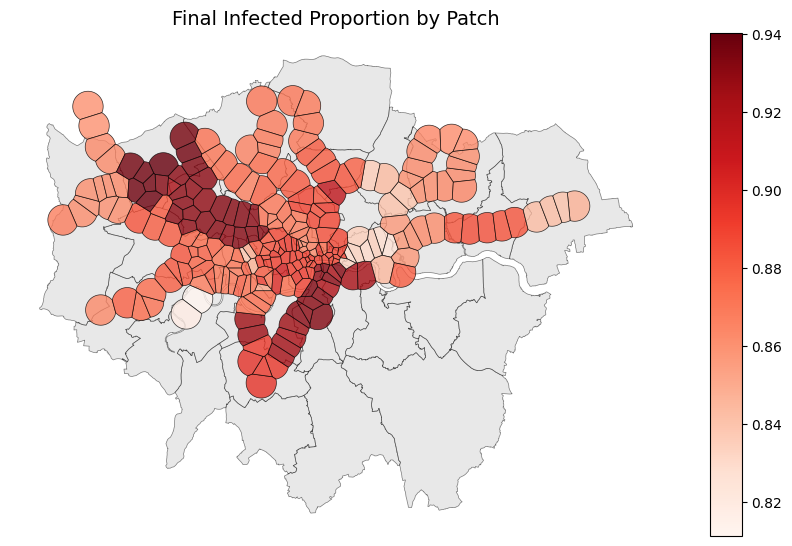

In [248]:
final_infected = solution[2][home_patches].T[-1]
final_infected_prop = final_infected/short_pop_vector
final_infected_prop

import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_inf_map(final_infected_prop, title="Final Infected Proportion by Patch"):
    """
    Plots Voronoi patches of London colored by beta values,
    with boroughs in the background, station dots, and a shortened colorbar.

    Parameters:
    - beta_array: Array of beta values (length must match number of Voronoi regions).
    - title: Title of the plot.
    """
    # Load data
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    # Ensure CRS match
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    # Separate boroughs and stations
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    stations_gdf = london_gdf[london_gdf["type"] == "station"]

    # Add beta values
    voronoi_gdf["inf_prop"] = final_infected_prop

    # Plot setup
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    # Colorbar axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    # Plot Voronoi with colorbar
    voronoi_gdf.plot(
        ax=ax,
        column="inf_prop",
        cmap="Reds",
        edgecolor="black",
        linewidth=0.5,
        alpha=0.8,
        legend=True,
        cax=cax
    )

    # Add station dots
    # stations_gdf.plot(ax=ax, color="black", markersize=2)

    # Final touches
    ax.set_title(title, fontsize=14)
    ax.axis("off")
    plt.show()



plot_inf_map(final_infected_prop)

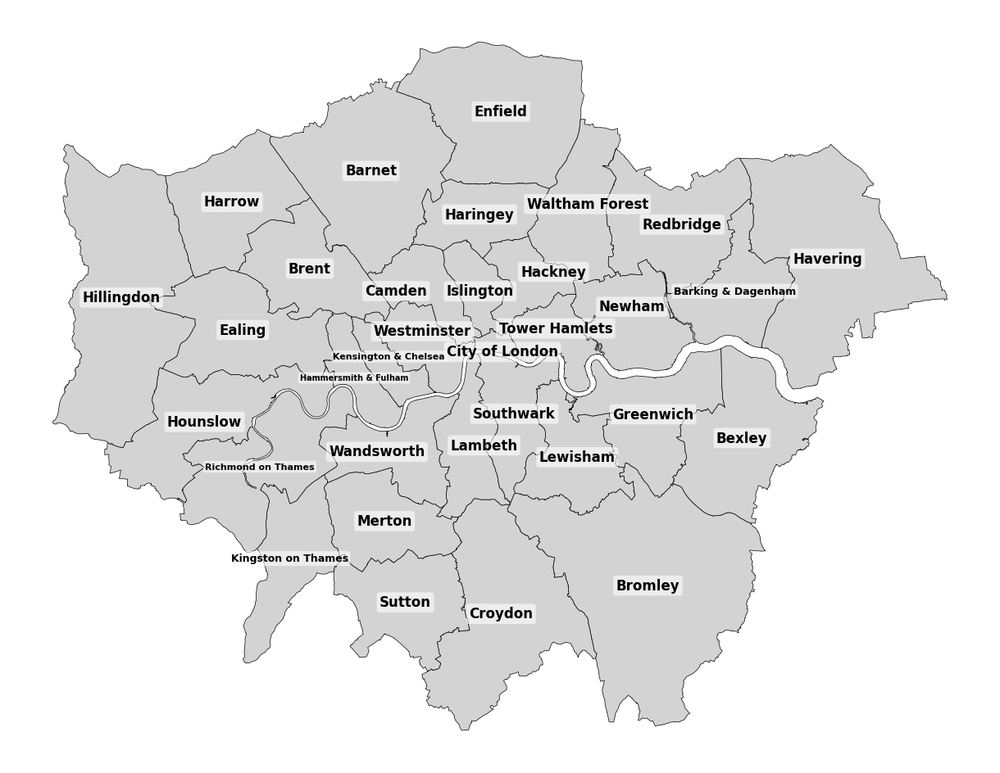

In [58]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import numpy as np
import matplotlib.transforms as mtransforms

def plot_borough_labels():
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    fig, ax = plt.subplots(figsize=(12, 10))
    ax.set_facecolor("lightgray")
    boroughs_gdf.plot(ax=ax, color="lightgray", edgecolor="black", linewidth=0.5)

    max_label_width = 150  # in display (pixel) units
    labels = []

    for _, row in boroughs_gdf.iterrows():
        name = row["name"].replace(" and ", " & ").replace(" upon ", " on ")
        centroid = row.geometry.centroid

        fontsize = 12
        label = ax.text(
            centroid.x, centroid.y, name,
            fontsize=fontsize, ha='center', va='center', fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.6, boxstyle='round,pad=0.2', edgecolor='none')
        )
        fig.canvas.draw()
        bbox = label.get_window_extent(renderer=fig.canvas.get_renderer())

        while bbox.width > max_label_width and fontsize > 6:
            fontsize -= 1
            label.set_fontsize(fontsize)
            fig.canvas.draw()
            bbox = label.get_window_extent(renderer=fig.canvas.get_renderer())

        labels.append(label)

    # Overlap resolution with vertical bias
    for _ in range(100):
        moved = False
        bboxes = [label.get_window_extent(renderer=fig.canvas.get_renderer()) for label in labels]
        for i in range(len(labels)):
            for j in range(i + 1, len(labels)):
                if bboxes[i].overlaps(bboxes[j]):
                    dx = labels[i].get_position()[0] - labels[j].get_position()[0]
                    dy = labels[i].get_position()[1] - labels[j].get_position()[1]
                    if abs(dy) < abs(dx):
                        dy *= 1.5  # favor vertical movement
                    angle = np.arctan2(dy, dx)
                    shift = 0.001
                    shift_vec = (shift * np.cos(angle), shift * np.sin(angle))
                    labels[i].set_position((
                        labels[i].get_position()[0] + shift_vec[0],
                        labels[i].get_position()[1] + shift_vec[1]
                    ))
                    labels[j].set_position((
                        labels[j].get_position()[0] - shift_vec[0],
                        labels[j].get_position()[1] - shift_vec[1]
                    ))
                    moved = True
        if not moved:
            break
        fig.canvas.draw()

    # Manually recenter Westminster
    for _, row in boroughs_gdf.iterrows():
        if "Westminster" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Westminster" in label.get_text():
                    label.set_position((centroid.x, centroid.y*1.00015))
                    break
                    
    # Manually recenter Newham
    for _, row in boroughs_gdf.iterrows():
        if "Newham" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Newham" in label.get_text():
                    label.set_position((centroid.x, centroid.y*1.00015))
                    break
    
    # Manually recenter Tower Hamlets
    for _, row in boroughs_gdf.iterrows():
        if "Tower Hamlets" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Tower Hamlets" in label.get_text():
                    label.set_position((centroid.x*0.9995, centroid.y*1.00012))
                    break
                    
    # Manually recenter Kensington & Chelsea
    for _, row in boroughs_gdf.iterrows():
        if "Kensington and Chelsea" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Kensington & Chelsea" in label.get_text():
                    label.set_position((centroid.x*1.000075, centroid.y*1.0001))
                    break
                    
    # Manually recenter Haringey
    for _, row in boroughs_gdf.iterrows():
        if "Haringey" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Haringey" in label.get_text():
                    label.set_position((centroid.x*1.0001, centroid.y))
                    break
                    
    # Manually recenter Haringey
    for _, row in boroughs_gdf.iterrows():
        if "Haringey" in row["name"]:
            centroid = row.geometry.centroid
            for label in labels:
                if "Haringey" in label.get_text():
                    label.set_position((centroid.x*1.0001, centroid.y))
                    break
                    

    ax.axis("off")
    plt.tight_layout(pad=0)
    plt.savefig("borough_labels.png", dpi=300, bbox_inches='tight', transparent=True)
    plt.show()

plot_borough_labels()


In [77]:
import matplotlib.pyplot as plt
import numpy as np

# Compute correlation
corr = np.corrcoef(home_betas, final_infected_prop)[0, 1]

# Compute residuals (difference from regression line)
residuals = final_infected_prop - np.poly1d(np.polyfit(home_betas, final_infected_prop, 1))(home_betas)

# Get indices of 5 largest absolute residuals (outliers)
outlier_indices = np.argsort(np.abs(residuals))[-1:]

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(home_betas, final_infected_prop, alpha=0.7)
for i, idx in enumerate(outlier_indices):
    if i % 2 == 0:
        offset = (0, 8)   # above
        ha, va = 'center', 'top'
    else:
        offset = (8, 0)   # right
        ha, va = 'left', 'center'
    
    plt.annotate(
        station_list[idx],
        (home_betas[idx], final_infected_prop[idx]),
        fontsize=9,
        xytext=offset,
        textcoords='offset points',
        ha=ha,
        va=va
    )


# Fit and plot dotted trend line
m, b = np.polyfit(home_betas, final_infected_prop, 1)
x_vals = np.array([min(home_betas), max(home_betas)])
y_vals = m * x_vals + b
plt.plot(x_vals, y_vals, linestyle=':', color='red', label='Trend Line')
plt.legend()

plt.title(f"Home β vs Final Infected Proportion (Correlation = {corr:.2f})")
plt.xlabel("Home β")
plt.ylabel("Final Infected Proportion")
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'home_betas' is not defined

In [82]:
best_beta_yet[home_patches]

array([0.47327663, 0.6300031 , 0.35567162, 0.58732807, 0.48559222,
       0.49333212, 0.45699795, 0.50088589, 0.53624926, 0.5607019 ,
       0.89994776, 0.50757475, 0.51507289, 0.44230306, 0.45329964,
       0.48424938, 0.51381974, 0.45350492, 0.54051009, 0.3679068 ,
       0.68980329, 0.37634398, 0.54807093, 0.54585682, 0.4742354 ,
       0.48274495, 0.36766871, 0.44298714, 0.5718019 , 0.37026497,
       0.44640754, 0.49244254, 0.44248727, 0.54688467, 0.35391119,
       0.43178914, 0.89994776, 0.61067819, 0.45275677, 0.5463641 ,
       0.89994776, 0.42964947, 0.47495952, 0.5668418 , 0.56654015,
       0.56471341, 0.45843187, 0.44755893, 0.48726836, 0.56153035,
       0.43952106, 0.50987167, 0.50833893, 0.58650127, 0.47267849,
       0.47881303, 0.48429089, 0.44876396, 0.45118627, 0.44028755,
       0.56358207, 0.43976256, 0.44641065, 0.47418761, 0.48898849,
       0.5783257 , 0.42020751, 0.47903077, 0.4377117 , 0.43353587,
       0.44323243, 0.45512731, 0.45620552, 0.44476721, 0.47035

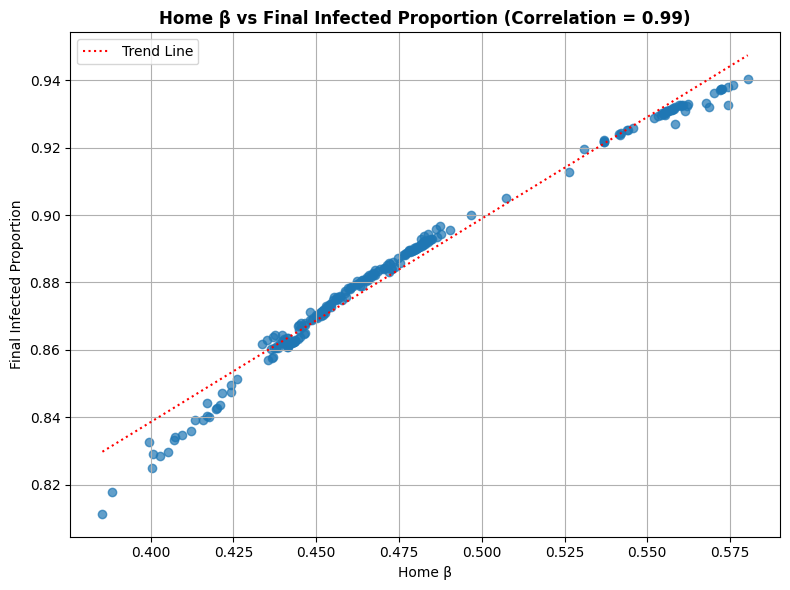

In [249]:
import matplotlib.pyplot as plt
import numpy as np

# Compute correlation
corr = np.corrcoef(home_betas, final_infected_prop)[0, 1]

# Compute residuals (difference from regression line)
residuals = final_infected_prop - np.poly1d(np.polyfit(home_betas, final_infected_prop, 1))(home_betas)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(home_betas, final_infected_prop, alpha=0.7)


# Fit and plot dotted trend line
m, b = np.polyfit(home_betas, final_infected_prop, 1)
x_vals = np.array([min(home_betas), max(home_betas)])
y_vals = m * x_vals + b
plt.plot(x_vals, y_vals, linestyle=':', color='red', label='Trend Line')
plt.legend()

plt.title(f"Home β vs Final Infected Proportion (Correlation = {corr:.2f})", fontweight='bold')
plt.xlabel("Home β")
plt.ylabel("Final Infected Proportion")
plt.grid(True)
plt.tight_layout()
plt.show()


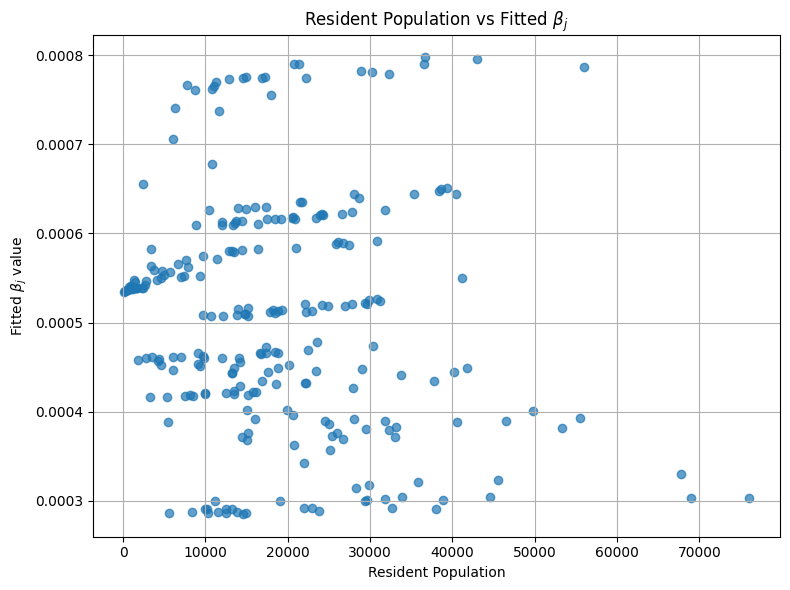

In [220]:
import matplotlib.pyplot as plt
import numpy as np

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(short_pop_vector, final_infected_prop, alpha=0.7)




plt.title(f"Resident Population vs Fitted $\\beta_j$")
plt.xlabel("Resident Population")
plt.ylabel("Fitted $\\beta_j$ value")
plt.grid(True)
plt.tight_layout()
plt.show()


In [70]:
station_list[10]

'Bank & Monument'

In [101]:
pop_vector.shape

(63001,)

In [6]:
with open("Sparse London Expanded P Matrix.pkl", "rb") as file:
    sparse_expanded_p_matrix = pickle.load(file)
    
expanded_p = sparse_expanded_p_matrix.toarray()
expanded_p.shape

(63001, 63001)

In [111]:
expanded_p

array([[1345.2709    ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   8.63432903,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   8.19027465,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       ...,
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,   30.48144931],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    1.83627333],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        , 1351.2195    ]])

In [114]:
myarr = np.array([
    [1,2,3],
    [2,3,4],
    [4,5,6]
])
np.sum(myarr,axis=0)

array([ 7, 10, 13])

In [7]:
homies = np.diag(expanded_p)[home_patches]
total_incoming = np.sum(expanded_p, axis=0)[home_patches]
commuters_vs_residents = (total_incoming - homies) / short_pop_vector
commuters_vs_residents

array([  0.37541681,   1.89941788,   0.43646397,   0.18299401,
         0.29606019,   0.22222949,   0.77549501,   0.1924569 ,
         1.12079838,   0.47066279, 101.42523556,   0.53326196,
         0.27610548,   0.26246447,   0.26773801,   0.33101228,
         0.22877043,   0.27117427,   0.41103049,   0.28631812,
         3.10474716,   0.32225747,   1.16821027,   0.43416594,
         0.32493835,   0.25863683,   0.28738821,   0.22180516,
         0.41213962,   0.25460087,   0.23263136,   0.23132471,
         0.48013688,   0.42573476,   0.51868428,   0.27487277,
         7.51145869,   0.2801635 ,   0.28122034,   1.06929372,
         7.43710391,   0.25799322,   0.34229115,   0.39098785,
         0.39495872,   0.40733198,   0.75666778,   0.23894593,
         0.32687471,   1.15816353,   0.35292542,   0.23653997,
         0.24417536,   0.17342009,   0.49589756,   0.43496231,
         0.45725491,   0.22074866,   0.26190731,   0.23022554,
         0.39527212,   0.43916323,   0.23453229,   0.28

In [187]:
with open("London P Populations.pkl", "rb") as file:
    p_populations = pickle.load(file)
p_populations

array([[1345.2709,   14.0174,   13.2965, ...,    4.8116,    1.1213,
           4.8365],
       [   0.4113,   74.6564,    2.0121, ...,    0.2444,    0.0586,
           0.1501],
       [   2.3165,   15.2961,  614.2832, ...,    5.7812,    5.5379,
           1.222 ],
       ...,
       [   9.9085,   29.0681,   37.6025, ..., 1930.2015,    9.4736,
          24.3091],
       [   3.9631,   16.5615,   73.9309, ...,   23.9857, 1388.6246,
           3.2675],
       [   9.4214,   13.6486,   16.3479, ...,   49.3183,    3.1182,
        1351.2195]])

In [189]:
short_pop_vector[0]

np.float64(18490.091793896856)

In [190]:
np.sum(p_populations[0])

np.float64(9349.1001)

In [191]:
with open("London P Populations.pkl", "rb") as file:
    p_populations = pickle.load(file)


commuters_vs_residents = []
for i in range(251):
    residents = np.sum(p_populations[i])
    col_sum = np.sum(p_populations.T[i])
    commuters = col_sum - p_populations[i][i]
    commuters_vs_residents.append(commuters/residents)
commuters_vs_residents = np.array(commuters_vs_residents)
commuters_vs_residents

array([  0.59706628,  13.67523053,   1.93020251,   0.44089177,
         1.25706713,   0.53386328,   0.39887844,   0.22095669,
         7.43721481,   0.56535884, 811.50307517,   2.72070255,
         0.84283186,   0.24195298,   0.71005424,   1.09908376,
         0.29396865,   0.32413607,   0.19287536,   0.68741663,
        23.33288073,   0.36629943,   7.80094583,   0.29054276,
         0.30423038,   0.24011481,   0.68734617,   0.23522414,
         0.22784879,   0.40617077,   0.351341  ,   0.60351676,
         1.78180673,   0.27026903,   2.75972153,   0.57477006,
        58.64964865,   0.25927106,   0.38744613,   7.01469697,
        58.05419229,   0.20862368,   0.38809697,   0.1201063 ,
         0.13110983,   0.25214954,   0.28408133,   0.3976806 ,
         0.21193751,   7.71931568,   0.3023608 ,   0.36203465,
         0.46219098,   0.29769679,   1.36961648,   0.9422017 ,
         1.75878531,   0.30497818,   0.57218643,   0.2280556 ,
         0.21318692,   0.74377506,   0.37489166,   0.74

In [116]:
full_p = p_matrix.copy()

for i in home_patches:
    full_p[i] *= pop_vector[i]

commuters_vs_residents = []
idx = 0
for i in home_patches:
    print(idx)
    homies = p_matrix[i][i] * pop_vector[i]
    commuters_vs_residents.append((np.sum(full_p,axis=0)[i]-homies)/pop_vector[i])
    idx += 1
commuters_vs_residents = np.array(commuters_vs_residents)
commuters_vs_residents

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


KeyboardInterrupt: 

In [104]:
homebodies = []
for i in home_patches:
    homebodies.append(p_matrix[i][i]*pop_vector[i])
homebodies = np.array(homebodies)
homebodies.shape

(251,)

In [92]:
short_pop_vector

array([18490.0917939 ,  1011.37883298, 15157.10015929, 16399.6964301 ,
       33704.88962954, 37748.74171402, 25377.71752355, 27886.26706993,
        7359.42919263, 28629.20110131,   126.98899843,  7853.37497071,
       44523.37998993, 11491.29965312, 18506.14328998,  7658.57500183,
       29356.13416051, 23387.12490403, 42956.06634863, 53269.5715622 ,
        1040.39934054, 29835.6257514 ,  4128.54685394, 16865.24509163,
       14118.2408711 , 33129.57943119, 26661.13479289, 22941.15696768,
       55984.45022395, 20815.1230671 , 26998.48192015, 22178.96095135,
       14265.60943902, 36512.01676723, 49764.12964483, 33910.50593091,
         184.26417739, 17339.06175149, 17633.33105403,  4643.80745544,
         586.10402699,  5577.26390803, 12013.61556653, 32343.87435059,
       22209.32145397, 40420.74722982, 15069.15646897, 31258.73511366,
       27421.74032102,  2846.67896368, 15176.98483124, 19118.30876443,
       31846.44971626, 23404.52788676, 23542.4580453 ,  7086.66036047,
      

In [107]:
commuters_vs_residents = (Nj[home_patches]-homebodies)/homebodies
commuters_vs_residents

array([  0.31968003,   4.97915185,   0.69753961,   0.14856886,
         0.36021389,   0.15500745,   0.38035398,   0.06407417,
         2.6725041 ,   0.31766728, 290.48525196,   0.98585881,
         0.28500774,   0.10995614,   0.24161675,   0.39999129,
         0.10506567,   0.14059145,   0.11184583,   0.24633156,
         8.4484693 ,   0.17728628,   2.80461764,   0.16784343,
         0.16540175,   0.08606512,   0.25074615,   0.09775204,
         0.12972359,   0.14916489,   0.14718686,   0.17433236,
         0.76659345,   0.15693641,   0.9632003 ,   0.22747193,
        21.26829918,   0.14163968,   0.16757368,   2.52928521,
        20.88959277,   0.09519227,   0.20884318,   0.06851433,
         0.07451549,   0.14172947,   0.27008774,   0.1654949 ,
         0.09811925,   2.78396866,   0.16265645,   0.13156145,
         0.16395238,   0.09836421,   0.72546384,   0.50594564,
         0.74004215,   0.10449742,   0.23572022,   0.0901769 ,
         0.12117278,   0.38480447,   0.15746914,   0.27

In [108]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import rankdata

commuters_vs_residents = Nj[home_patches]/short_pop_vector
commuters_vs_residents

# Compute correlation
corr = np.corrcoef(home_betas, final_infected_prop)[0, 1]

# Compute residuals
residuals = final_infected_prop - np.poly1d(np.polyfit(home_betas, final_infected_prop, 1))(home_betas)

# Get indices of 8 largest absolute residuals
outlier_indices = np.argsort(np.abs(residuals))[-3:]

# Rank commuters_vs_residents
ranks = rankdata(commuters_vs_residents, method='average')

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    home_betas, final_infected_prop,
    c=ranks, cmap='viridis', alpha=0.7
)

for i, idx in enumerate(outlier_indices):
    if i % 2 == 0:
        offset = (0, 8)
        ha, va = 'center', 'top'
    else:
        offset = (8, 0)
        ha, va = 'left', 'center'
    
    plt.annotate(
        station_list[idx],
        (home_betas[idx], final_infected_prop[idx]),
        fontsize=9,
        xytext=offset,
        textcoords='offset points',
        ha=ha,
        va=va
    )

# Fit and plot trend line
m, b = np.polyfit(home_betas, final_infected_prop, 1)
x_vals = np.array([min(home_betas), max(home_betas)])
y_vals = m * x_vals + b
plt.plot(x_vals, y_vals, linestyle=':', color='red', label='Trend Line')

# Colorbar with rank ticks
cbar = plt.colorbar(scatter, label='Commuters to Residents Ratio (Rank)')
cbar.set_ticks([1, 64, 128, 192, 251])

plt.legend()
plt.title(f"Home β vs Final Infected Proportion (Correlation = {corr:.2f})")
plt.xlabel("Home β")
plt.ylabel("Final Infected Proportion")
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'home_betas' is not defined

In [112]:
import numpy as np

# Convert to numpy array if needed
station_array = np.array(station_list)
sorted_indices = np.argsort(commuters_vs_residents)
sorted_stations = station_array[sorted_indices[::-1]]
sorted_stations

array(['Bank & Monument', 'Embankment', 'Oxford Circus', "St. Paul's",
       'Cannon Street', 'Charing Cross', 'Liverpool Street', 'Moorgate',
       'Westminster', 'Piccadilly Circus', 'Green Park',
       'Leicester Square', 'Waterloo', 'Blackfriars',
       'Tottenham Court Road', 'Mansion House', 'Holborn', 'Temple',
       'Victoria', 'Aldgate', 'Euston Square', 'Paddington', 'Tower Hill',
       'Euston', 'London Bridge', 'Queensway', 'Bond Street',
       'Farringdon', 'Covent Garden', "King's Cross St. Pancras",
       'Baker Street', 'Warren Street', 'Chancery Lane',
       'Hyde Park Corner', "St. James's Park", 'Marble Arch',
       'Hammersmith', 'Knightsbridge', 'Southwark',
       'Great Portland Street', 'Manor House', 'Goodge Street',
       'Lancaster Gate', 'Barbican', 'Northwick Park', 'Canary Wharf',
       'Stratford', 'Uxbridge', 'Upminster', "Shepherd's Bush",
       'Camden Town', 'Russell Square', 'South Kensington', 'Marylebone',
       'North Greenwich', 'Gu

In [134]:
voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
voronoi_gdf

,FID,geometry
0,0,"POLYGON ((0.241 51.57057, 0.24101 51.57057, 0...."
1,1,"POLYGON ((0.22021 51.5678, 0.22021 51.5678, 0...."
2,2,"POLYGON ((-0.45726 51.5411, -0.4573 51.54103, ..."
3,3,"POLYGON ((0.1617 51.53097, 0.1617 51.53097, 0...."
4,4,"POLYGON ((-0.40213 51.46438, -0.40214 51.46438..."
...,...,...
246,246,"POLYGON ((-0.09467 51.50657, -0.09744 51.50657..."
247,247,"POLYGON ((-0.0838 51.50909, -0.09424 51.50651,..."
248,248,"POLYGON ((-0.08631 51.5159, -0.08446 51.52172,..."
249,249,"POLYGON ((-0.07232 51.51196, -0.06011 51.50821..."


In [131]:
london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
stations_gdf = london_gdf[london_gdf["type"] == "station"]
stations_gdf

,name,type,station1,station2,geometry
33,Acton Town,station,None,None,POINT (-0.2803 51.50307)
34,Aldgate,station,None,None,POINT (-0.07563 51.51434)
35,Aldgate East,station,None,None,POINT (-0.073 51.51508)
36,Alperton,station,None,None,POINT (-0.29952 51.54121)
37,Angel,station,None,None,POINT (-0.10558 51.53297)
...,...,...,...,...,...
279,Wimbledon,station,None,None,POINT (-0.20666 51.42111)
280,Wimbledon Park,station,None,None,POINT (-0.19919 51.43458)
281,Wood Green,station,None,None,POINT (-0.10953 51.59745)
282,Woodford,station,None,None,POINT (0.03406 51.6072)


In [139]:
for i in range(251):
    if list(stations_gdf["name"])[i] != station_list[i]:
        print("Bad",i)

In [124]:
station_list

['Acton Town',
 'Aldgate',
 'Aldgate East',
 'Alperton',
 'Angel',
 'Archway',
 'Arnos Grove',
 'Arsenal',
 'Baker Street',
 'Balham',
 'Bank & Monument',
 'Barbican',
 'Barking',
 'Barkingside',
 'Barons Court',
 'Bayswater',
 'Becontree',
 'Belsize Park',
 'Bermondsey',
 'Bethnal Green',
 'Blackfriars',
 'Blackhorse Road',
 'Bond Street',
 'Borough',
 'Boston Manor',
 'Bounds Green',
 'Bow Road',
 'Brent Cross',
 'Brixton',
 'Bromley-by-Bow',
 'Burnt Oak',
 'Caledonian Road',
 'Camden Town',
 'Canada Water',
 'Canary Wharf',
 'Canning Town',
 'Cannon Street',
 'Canons Park',
 'Chalk Farm',
 'Chancery Lane',
 'Charing Cross',
 'Chigwell',
 'Chiswick Park',
 'Clapham Common',
 'Clapham North',
 'Clapham South',
 'Cockfosters',
 'Colindale',
 'Colliers Wood',
 'Covent Garden',
 'Croxley',
 'Dagenham East',
 'Dagenham Heathway',
 'Dollis Hill',
 'Ealing Broadway',
 'Ealing Common',
 "Earl's Court",
 'East Acton',
 'East Finchley',
 'East Ham',
 'East Putney',
 'Eastcote',
 'Edgware',
 'E

=== Ratio Summary BEFORE Transformation ===
Min: 0.0370, Max: 811.5031, Mean: 7.3884, Median: 0.5339
Top 10 values: [811.50307517 115.36091654  70.39679656  69.24223966  58.64964865
  58.05419229  50.56714204  44.95253179  42.81864415  41.19559574]

=== Ratio Summary AFTER Log base-10 Transformation ===
Min: -1.4314, Max: 2.9093, Mean: -0.0704, Median: -0.2726
Top 10 transformed values: [2.90929017 2.0620587  1.8475529  1.84037111 1.76826541 1.76383359
 1.70386841 1.65275416 1.63163291 1.61485079]


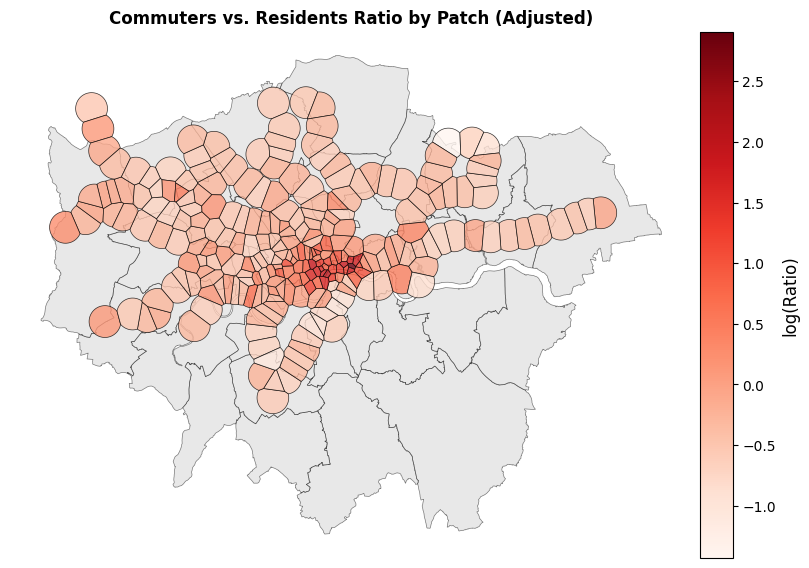

In [194]:
import math
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
from matplotlib.colors import LogNorm

def plot_ratio_map(ratio, title="Commuters vs. Residents Ratio by Patch (Adjusted)", log_base=1):
    """
    Plots Voronoi patches of London colored by actual ratio values,
    with boroughs in the background and an adjustable colorbar scale.

    Parameters:
    - ratio: Array-like, raw ratio values.
    - title: Plot title.
    - log_base: >1 to apply log-base scaling (e.g., 10); 1 for LogNorm; <=0 disables log.
    """
    # Load data
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    # Ensure CRS match
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    # Separate boroughs
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Print summary before transformation
    print("=== Ratio Summary BEFORE Transformation ===")
    print(f"Min: {np.min(ratio):.4f}, Max: {np.max(ratio):.4f}, Mean: {np.mean(ratio):.4f}, Median: {np.median(ratio):.4f}")
    print("Top 10 values:", np.sort(ratio)[-10:][::-1])

    # Apply log transform if desired
    if log_base > 1:
        ratio = np.log(np.clip(ratio, 1e-6, None)) / np.log(log_base)
        norm = None
        label = f"log(Ratio)"  # Unicode subscript for base
        print(f"\n=== Ratio Summary AFTER Log base-{log_base} Transformation ===")
        print(f"Min: {np.min(ratio):.4f}, Max: {np.max(ratio):.4f}, Mean: {np.mean(ratio):.4f}, Median: {np.median(ratio):.4f}")
        print("Top 10 transformed values:", np.sort(ratio)[-10:][::-1])
    elif log_base == 1:
        ratio = np.clip(ratio, 1e-6, None)
        norm = LogNorm(vmin=ratio.min(), vmax=ratio.max())
        label = "Log-Normalized Ratio"
    else:
        norm = None
        label = "Commuter-to-Resident Ratio"

    voronoi_gdf["ratio"] = ratio

    # Plot setup
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    # Colorbar axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-2)

    # Colormap
    cmap = plt.cm.Reds

    # Plot Voronoi
    voronoi_gdf.plot(
        ax=ax,
        column="ratio",
        cmap=cmap,
        edgecolor="black",
        linewidth=0.5,
        alpha=0.8,
        norm=norm
    )

    # Manual colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm or plt.Normalize(vmin=ratio.min(), vmax=ratio.max()))
    sm._A = []
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label(label, fontsize=12)

    ax.set_title(title, fontweight='bold')
    ax.axis("off")
    plt.show()

# Example usage:
plot_ratio_map(commuters_vs_residents, log_base=10)


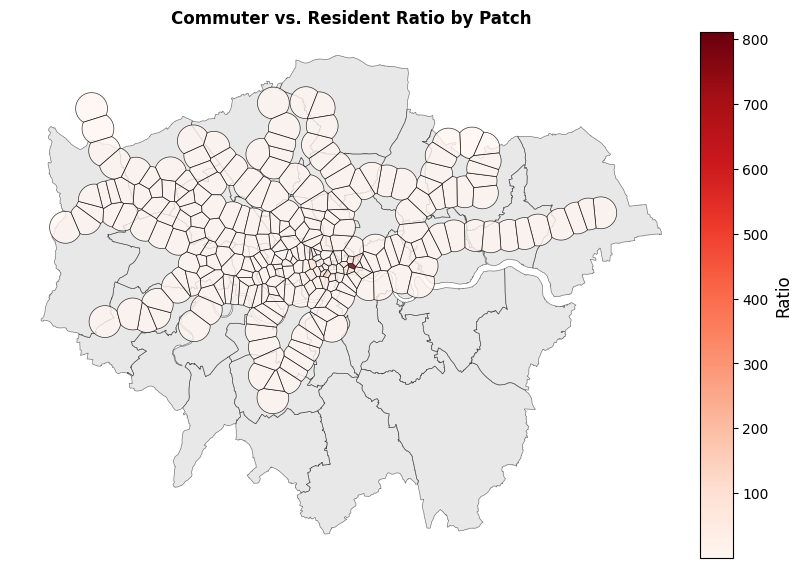

In [192]:
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

def plot_ratio_map(ratio, title="Commuters vs. Residents Ratio by Patch"):
    """
    Plots Voronoi patches of London colored by actual ratio values,
    with boroughs in the background and an adjusted colorbar.

    Parameters:
    - ratio: Array-like, raw ratio values.
    - title: Plot title.
    """
    # Load data
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    # Ensure CRS match
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    # Separate boroughs
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Add actual ratio values
    voronoi_gdf["ratio"] = ratio

    # Plot setup
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    # Colorbar axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-2)

    # Create color map
    cmap = plt.cm.Reds
    norm = plt.Normalize(voronoi_gdf["ratio"].min(), voronoi_gdf["ratio"].max())

    # Plot Voronoi
    voronoi_gdf.plot(
        ax=ax,
        column="ratio",
        cmap=cmap,
        edgecolor="black",
        linewidth=0.5,
        alpha=0.8
    )

    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label("Ratio", fontsize=12)

    ax.set_title(title, fontweight='bold')
    ax.axis("off")
    plt.show()

# Example usage:
plot_ratio_map(commuters_vs_residents)

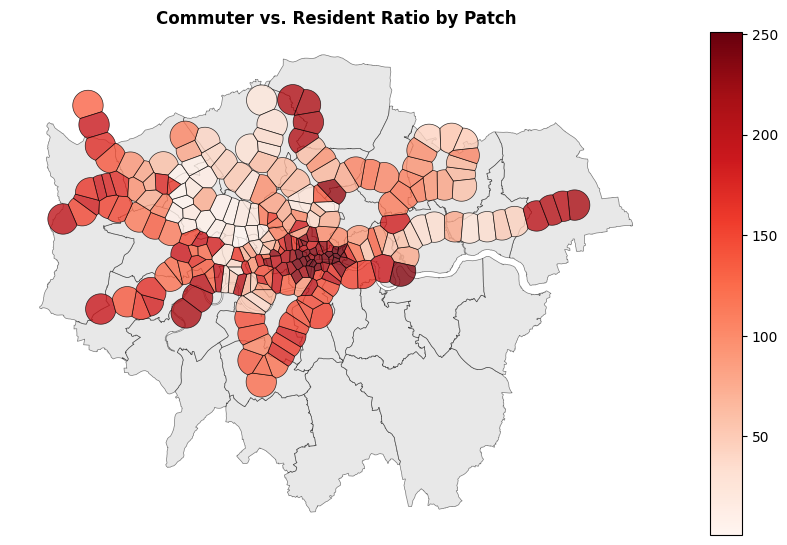

In [141]:
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

def plot_ratio_map(ratio, title="Commuter vs. Resident Ratio by Patch"):
    """
    Plots Voronoi patches of London colored by ranked ratio values,
    with boroughs in the background and an adjusted colorbar.

    Parameters:
    - ratio: Array-like, raw ratio values.
    - title: Plot title.
    """
    # Load data
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    # Ensure CRS match
    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)

    # Separate boroughs and stations
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Add ranked ratio values
    voronoi_gdf["ranked_ratio"] = np.argsort(np.argsort(ratio)) + 1

    # Plot setup
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

    # Colorbar axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=-1.5)

    # Plot Voronoi with ranked coloring
    voronoi_gdf.plot(
        ax=ax,
        column="ranked_ratio",
        cmap="Reds",
        edgecolor="black",
        linewidth=0.5,
        alpha=0.8,
        legend=True,
        cax=cax
    )

    # Final touches
    ax.set_title(title,fontweight='bold')
    ax.axis("off")
    plt.show()

plot_ratio_map(commuters_vs_residents)

In [119]:
station_list[10]

'Bank & Monument'

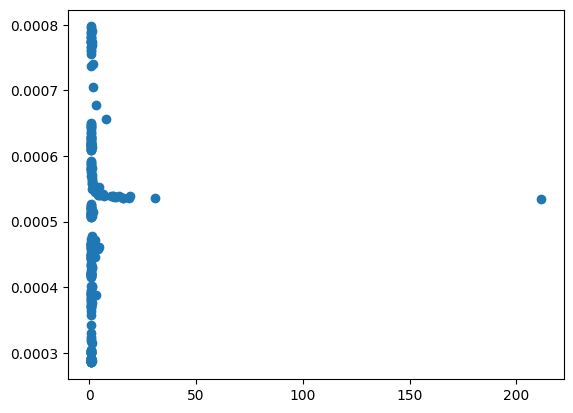

In [225]:
plt.scatter(commuters_vs_residents,final_infected_prop)

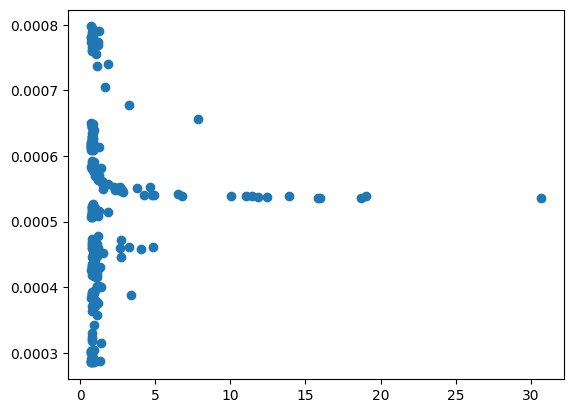

In [226]:
mask = np.arange(len(commuters_vs_residents)) != 10
plt.scatter(np.array(commuters_vs_residents)[mask],
            np.array(final_infected_prop)[mask])

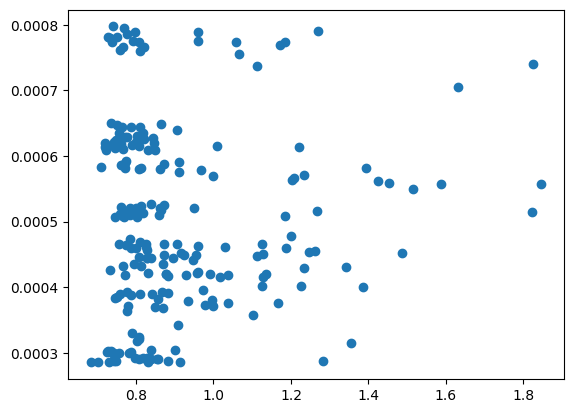

In [227]:
import numpy as np

x = np.array(commuters_vs_residents)
y = np.array(final_infected_prop)

mask = x < 2
plt.scatter(x[mask], y[mask])


(251,)

In [343]:
compress_array(best_beta_yet).shape

(251,)

In [12]:
def get_timeseries2(station_name,covid_df,props_dict):
    
    current_borough = props_dict[station_name][0]
    
    # Filter data for the given area_name "Lambeth" and within the maximum date range
    filtered_df = covid_df[
        (covid_df['date'] <= "2020-03-22") & 
        (covid_df['area_name'] == current_borough)
    ]

    # Find the earliest date where total_cases is nonzero
    # earliest_nonzero_date = filtered_df.loc[filtered_df['total_cases'] > 0, 'date'].min()
    earliest_nonzero_date = "2020-03-07"

    # Filter again using the adjusted start date
    filtered_df = filtered_df[
        (filtered_df['date'] >= earliest_nonzero_date) & 
        (filtered_df['date'] <= "2020-03-22")
    ]
    
    borough_timeseries = np.array(list(filtered_df['total_cases']))
    
    station_timeseries = props_dict[station_name][1]*borough_timeseries
    
    
    return station_timeseries

all_station_timeseries2 = []
for i in range(len(station_list)):
    all_station_timeseries2.append(get_timeseries2(station_list[i],covid_df,props_dict))
    
all_station_timeseries2 = np.array(all_station_timeseries2)


In [310]:
all_station_timeseries.T[0:16].shape

(16, 251)

full timeseries shape: (251, 16)
(16, 63001)
step: 0
step: 1
step: 2
step: 3
step: 4
step: 5
step: 6
step: 7
step: 8
step: 9
step: 10
step: 11
step: 12
step: 13
step: 14
R-squared: 0.8956


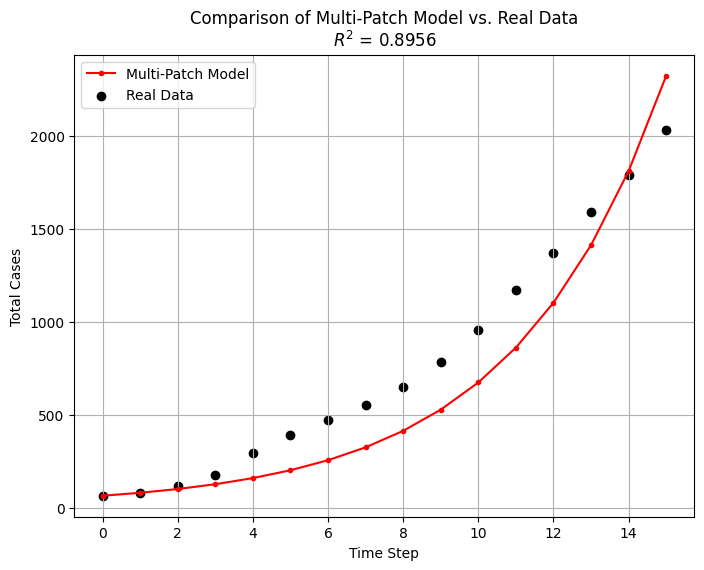

In [14]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

travel_patches = []
for i in valid_patch_indices:
    if i not in home_patches:
        travel_patches.append(i)

# Load best beta values
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    best_beta_yet_0 = pickle.load(file)
    
summed_timeseries = all_station_timeseries.T[0:16].T.sum(axis=0)
    
def expand_concise_betas(home_patches,travel_patches,concise_beta):
    long_beta = np.zeros(63001)
    for i in range(251):
        long_beta[home_patches[i]] = concise_beta[i]
    long_beta[travel_patches] = concise_beta[-1]
    
    return long_beta
    
# best_beta_yet = expand_detailed_beta(best_beta_yet_0)
best_beta_yet = expand_concise_betas(home_patches,travel_patches,best_beta_yet_0)

def plot_best_beta_vs_data(full_timeseries, pop_dict):
    """
    Extracts the relevant data, runs the SIR model with best_beta_yet, 
    and plots the beta values against the corresponding observed data.

    Parameters:
        full_timeseries (array-like): The full dataset of observed values.
        pop_dict (dict): Dictionary mapping population values.
    """
     # Load data
    print("full timeseries shape:",full_timeseries.shape)
    working_timeseries = expand_timeseries(full_timeseries,16)
    print(working_timeseries.shape)
    
    short_pop_vector = np.array(list(pop_dict.values()))
    pop_vector = expand_array(short_pop_vector)
    
    day_range = all_station_timeseries[0].shape[0]
    day_list = np.arange(16)  # There are day_range days

    # Stack so each row is [day_index, corresponding 9 values]
    data = np.column_stack((day_list[:, None], working_timeseries))

    tspan = data[:, 0]
    timespan = tspan.shape[0] - 1
    gamma = 1 / 5

    

    I0 = expand_array(current_cases)
    S0 = pop_vector - I0
    I_total_0 = cum_cases
    
    params = [S0, I0, I_total_0, best_beta_yet, gamma, timespan]
    solution = run_model_London(params)
    y = solution[2]

    I_sum_model = compress_timeseries(y.T,16)
    raw_real_data = compress_timeseries(data.T[1:].T,16)
    normalizer = compress_array(pop_vector)[:, np.newaxis]
    test_data = I_sum_model / normalizer
    real_data = raw_real_data / normalizer

        
    return np.array(solution)

solution = plot_best_beta_vs_data(all_station_timeseries.T[0:16].T, pop_dict)

result = np.sum(solution[2, :, :], axis=0)


# Compute R-squared value
r_squared = r2_score(summed_timeseries, result)
print(f"R-squared: {r_squared:.4f}")

# Plot the two time series against each other
plt.figure(figsize=(8, 6))
plt.plot(result, label="Multi-Patch Model", linestyle='-', marker='o', markersize=3,color='red')
plt.scatter(range(len(summed_timeseries)),summed_timeseries, label="Real Data",color='black')

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Total Cases")
plt.title(f"Comparison of Multi-Patch Model vs. Real Data\n$R^2$ = {r_squared:.4f}")
plt.legend()
plt.grid(True)

# Show plot
plt.show()

In [394]:
with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
    new_beta = pickle.load(file)
new_beta

array([0.47245108, 0.48426265, 0.40862553, 0.56131393, 0.48469031,
       0.48829084, 0.45858642, 0.48965567, 0.49401209, 0.54695653,
       0.48081676, 0.48965665, 0.48016174, 0.44539951, 0.46070712,
       0.47905562, 0.47821588, 0.45956003, 0.54452492, 0.42134313,
       0.48257533, 0.41664871, 0.48751571, 0.54085766, 0.46762458,
       0.47298331, 0.40789037, 0.45112907, 0.56772925, 0.40297304,
       0.45604876, 0.47925144, 0.44825934, 0.54415611, 0.41849449,
       0.43678087, 0.47922412, 0.57486016, 0.452677  , 0.48493345,
       0.47961167, 0.44309654, 0.46407739, 0.55652236, 0.55524315,
       0.5435204 , 0.45129978, 0.4552269 , 0.48189631, 0.48230706,
       0.43935428, 0.47188182, 0.47162714, 0.55926996, 0.46729677,
       0.45861503, 0.48348373, 0.45095085, 0.45685982, 0.436111  ,
       0.54057577, 0.43940453, 0.45051119, 0.47021132, 0.4778616 ,
       0.55692276, 0.41618063, 0.47781197, 0.4344228 , 0.43150561,
       0.44168285, 0.45209611, 0.45264193, 0.44175104, 0.46337

In [347]:
home_betas = new_beta[:251]
travel_beta = new_beta[-1]

In [348]:
np.average(home_betas),travel_beta

(np.float64(0.47359064269417933), np.float64(0.429071882608352))

In [179]:
away_times = np.zeros((251, 250))
idx = 0

for home_idx in home_patches:
    away_times[idx] = p_matrix[home_idx][[i for i in home_patches if i != home_idx]]
    idx += 1
away_times

array([[0.00049978, 0.00047407, 0.00061624, ..., 0.00017155, 0.00003998,
        0.00017244],
       [0.0003622 , 0.00177192, 0.00020316, ..., 0.00021523, 0.0000516 ,
        0.00013218],
       [0.00014212, 0.00093845, 0.00004724, ..., 0.00035469, 0.00033976,
        0.00007497],
       ...,
       [0.00025047, 0.0007348 , 0.00095053, ..., 0.00003487, 0.00023948,
        0.0006145 ],
       [0.00013646, 0.00057026, 0.00254565, ..., 0.00002101, 0.0008259 ,
        0.00011251],
       [0.00044295, 0.0006417 , 0.00076861, ..., 0.00003011, 0.00231874,
        0.0001466 ]])

In [180]:
for i in range(251):
    print(np.sum(away_times[i]))

0.2853689700751699
0.26758865128311343
0.29564561438634607
0.290456484574374
0.2889866082503788
0.2908041593370175
0.2651186908766244
0.29195216997920254
0.26417935744895105
0.2870921869441385
0.2601683152414438
0.26695890338500894
0.27197264316541375
0.29019016028901207
0.2856062906209168
0.26803783711744034
0.29664988094477973
0.2719070180013302
0.2926821743649636
0.29400883219283996
0.26671989687481834
0.28935862836985327
0.2660582313476731
0.2938076264985028
0.28822432451969726
0.28548811562942655
0.2977980497201448
0.2700460768019445
0.29246974417937144
0.29978416514354855
0.26871742809915505
0.29136303612147174
0.2703339862004379
0.2921934845832966
0.2735355604790089
0.29305186385038073
0.2678404497923017
0.27909071623135306
0.2719741815793445
0.26602723253896116
0.2659091699980382
0.29106496369020707
0.28807540988694635
0.2944313283918487
0.2946458397539572
0.28860701595505883
0.28079401296364564
0.2677487321352501
0.27899463264178276
0.26691057633992943
0.286194789470929
0.2981

In [184]:
away_times[118]

array([ 0.00038301,  0.00142219,  0.00174444,  0.00013145,  0.00120463,
        0.00057355,  0.00020953,  0.00017494,  0.00563706,  0.00129235,
        0.01059407,  0.00220085,  0.0000466 ,  0.00000709,  0.00130177,
        0.00086699,  0.00001032,  0.00036955,  0.00048758,  0.0022343 ,
        0.00249621,  0.00009287,  0.0033143 ,  0.00028129,  0.0001482 ,
        0.00007397,  0.00110024,  0.00006438,  0.00075445,  0.00050581,
        0.00011359,  0.00037949,  0.00123616,  0.00057715,  0.00836172,
        0.00010022,  0.00111103,  0.00003429,  0.00033255,  0.00335263,
        0.00349841,  0.00000294,  0.00016044,  0.00022623,  0.00016847,
        0.00082124,  0.00008214,  0.00014949,  0.00021158,  0.00226061,
        0.00009249,  0.00000807,  0.00001771,  0.00012726,  0.00112589,
        0.00022837, -0.00235945,  0.00067315,  0.00020519,  0.00009418,
        0.00060366,  0.00023756,  0.00012472,  0.00074607,  0.00129265,
        0.00096002,  0.00001327,  0.00321493,  0.00244557,  0.00

In [181]:
station_list.index("Knightsbridge")

118

In [234]:
import imageio.v2 as imageio
import IPython

def create_patch_focus_gif(p_matrix, home_patches, station_list, label="Patch"):
    output_filename = "patch_focus_voronoi.gif"
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']

    metric_voronoi = voronoi_gdf.to_crs(epsg=27700)
    metric_voronoi["x"] = metric_voronoi.geometry.centroid.x
    sorted_indices = metric_voronoi.sort_values("x").index.tolist()

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for i, gdf_idx in enumerate(tqdm(sorted_indices, desc="Generating Patch Focus Frames")):
            true_idx = home_patches[gdf_idx]
            row_vals = p_matrix[true_idx, home_patches]
            row_vals[gdf_idx] = np.nan  # exclude self

            if np.all(np.isnan(row_vals)):
                norm_vals = np.full(len(home_patches), 0.5)
            else:
                masked_vals = np.where(np.isnan(row_vals), np.nan, row_vals)
                max_val = np.nanmax(masked_vals)
                norm_vals = row_vals / max_val if max_val > 0 else np.zeros_like(row_vals)

            voronoi_gdf["color"] = norm_vals

            # ADDITION: force focused patch to be green
            base_colors = plt.cm.plasma(voronoi_gdf["color"].fillna(0))
            base_colors[gdf_idx] = (0, 1, 0, 1)  # green RGBA
            voronoi_gdf["custom_color"] = list(base_colors)

            fig, ax = plt.subplots(figsize=(6, 6))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(ax=ax, color=voronoi_gdf["custom_color"], edgecolor="black", linewidth=0.5, alpha=1)
            stations_gdf.plot(ax=ax, color="black", markersize=1)

            ax.text(0.5, 1.01, f"{label}: {station_list[gdf_idx]}", transform=ax.transAxes,
                    fontsize=12, ha="center", va="bottom", fontweight="bold")
            ax.set_axis_off()
            plt.tight_layout(pad=0)

            temp_path = os.path.join(temp_dir, f"frame_{i}.png")
            plt.savefig(temp_path, bbox_inches='tight', pad_inches=0)
            plt.close(fig)
            frames.append(imageio.imread(temp_path))
 
        print("Creating GIF...")
        imageio.mimsave(output_filename, frames, duration=1.5, loop=0)
        IPython.display.clear_output(wait=True)
    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')

create_patch_focus_gif(p_matrix, home_patches, station_list)


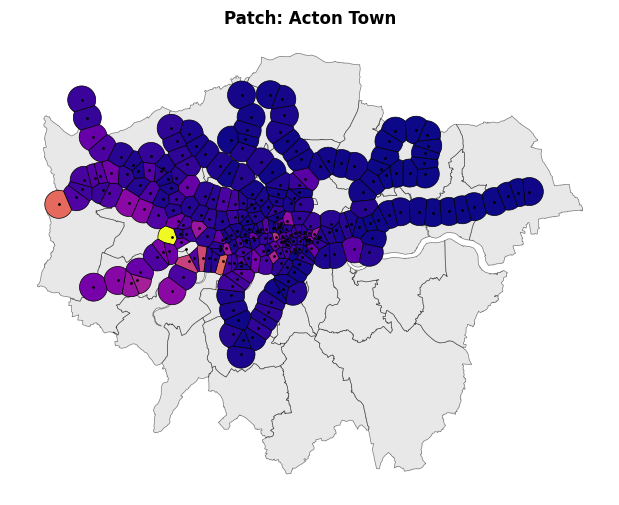

In [233]:
def preview_first_patch_frame(p_matrix, home_patches, station_list, label="Patch"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[london_gdf['type'] == 'station']

    i = 0
    true_idx = home_patches[i]
    row_vals = p_matrix[true_idx, home_patches]
    row_vals[i] = np.nan  # exclude self

    if np.all(np.isnan(row_vals)):
        norm_vals = np.full(len(home_patches), 0.5)
    else:
        cmin, cmax = np.nanmin(row_vals), np.nanmax(row_vals)
        norm_vals = (row_vals - cmin) / (cmax - cmin) if cmax > cmin else np.full_like(row_vals, 0.5)

    voronoi_gdf["color"] = norm_vals

    fig, ax = plt.subplots(figsize=(6, 6))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
    voronoi_gdf.plot(ax=ax, column="color", cmap="plasma", edgecolor="black", linewidth=0.5, alpha=1)
    stations_gdf.plot(ax=ax, color="black", markersize=1)

    ax.text(0.5, 1.01, f"{label}: {station_list[i]}", transform=ax.transAxes,
            fontsize=12, ha="center", va="bottom", fontweight="bold")
    ax.set_axis_off()
    plt.tight_layout(pad=0)
    plt.show()

preview_first_patch_frame(p_matrix, home_patches, station_list)


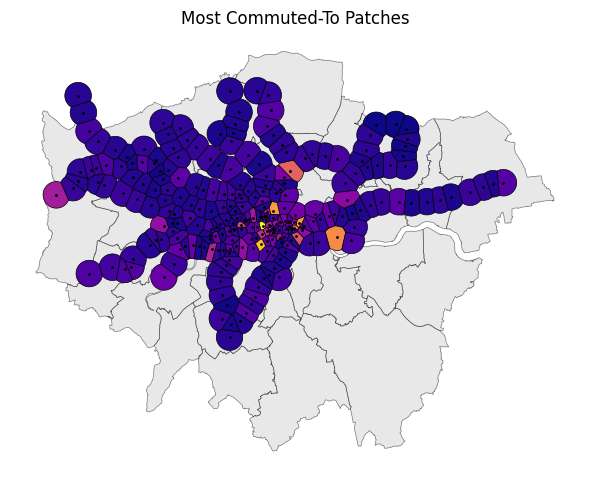

In [228]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt

# Load data
voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")
london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

# Align coordinate systems
voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
stations_gdf = london_gdf[london_gdf['type'] == 'station']

# Compute color values
color_vals = []
for idx, val in enumerate(home_patches):
    col_vals = p_matrix[:, val].copy()
    col_vals[val] = 0  # remove self-entry
    total = np.sum(col_vals[home_patches])  # sum over relevant home_patches
    color_vals.append(total)

color_vals = np.array(color_vals)

# Normalize for color map
cmin, cmax = np.min(color_vals), np.max(color_vals)
norm_color = (color_vals - cmin) / (cmax - cmin) if cmax > cmin else np.full_like(color_vals, 0.5)
voronoi_gdf["color"] = norm_color

# Plot
fig, ax = plt.subplots(figsize=(6, 6))
boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
voronoi_gdf.plot(ax=ax, column="color", cmap="plasma", edgecolor="black", linewidth=0.5)
stations_gdf.plot(ax=ax, color="black", markersize=1)
plt.title("Most Commuted-To Patches")
ax.set_axis_off()
plt.tight_layout()
plt.show()


In [63]:
import numpy as np
import matplotlib.pyplot as plt

# remove diagonals
p_no_diag = p_matrix.copy()
np.fill_diagonal(p_no_diag, 0)

# remove all-zero rows and columns
nonzero_rows = ~np.all(p_no_diag[home_patches] == 0, axis=1)
nonzero_cols = ~np.all(p_no_diag[home_patches] == 0, axis=0)
p_trimmed = p_no_diag[nonzero_rows][:, nonzero_cols]

# plot
plt.imshow(p_trimmed, cmap='viridis')
plt.colorbar(label='Value')
plt.title('Filtered p_matrix (no diagonals, no zero rows/cols)')
plt.xlabel('Column')
plt.ylabel('Row')
plt.show()


IndexError: boolean index did not match indexed array along axis 0; size of axis is 63001 but size of corresponding boolean axis is 251

In [66]:
p_matrix.shape

(63001, 63001)

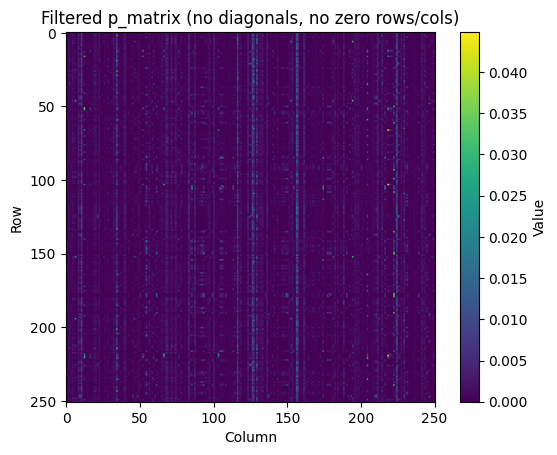

In [68]:
import numpy as np
import matplotlib.pyplot as plt

# remove diagonals
p_no_diag = p_matrix.copy()
np.fill_diagonal(p_no_diag, 0)

# remove all-zero rows and columns
p_trimmed = p_no_diag[np.ix_(home_patches, home_patches)]

# plot
plt.imshow(p_trimmed, cmap='viridis')
plt.colorbar(label='Value')
plt.title('Filtered p_matrix (no diagonals, no zero rows/cols)')
plt.xlabel('Column')
plt.ylabel('Row')
plt.show()


(63001,)


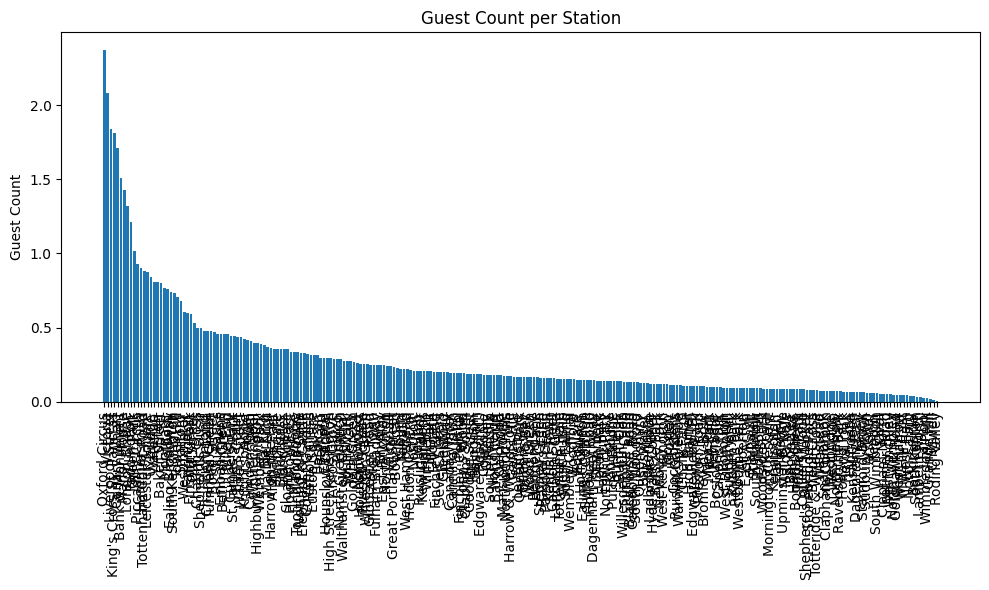

In [16]:
guest_arr = np.sum(p_no_diag,axis=0)
print(guest_arr.shape)
guest_arr = guest_arr[home_patches]

# Sort descending
sorted_pairs = sorted(zip(guest_arr, station_list), reverse=True)
sorted_guest, sorted_stations = zip(*sorted_pairs)

# Plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_stations, sorted_guest)
plt.ylabel('Guest Count')
plt.title('Guest Count per Station')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

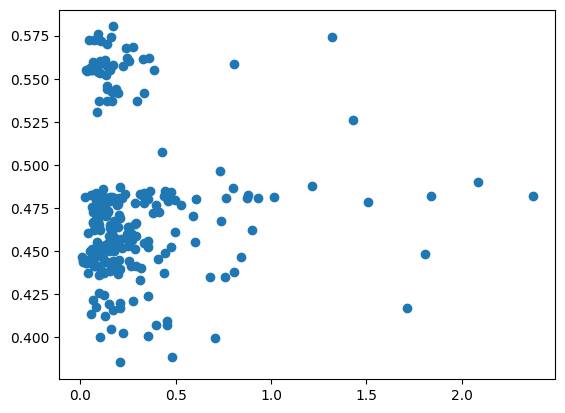

In [229]:
plt.scatter(color_vals,home_betas)

In [11]:
def get_leg_infections(timesteps):
    day_range = timesteps
    def expand_array(short_array):
        long_array = np.zeros(63001)  # Create a zero array of the desired size

        # Assign values at the correct positions
        long_array[np.arange(251) * (251 + 1)] = short_array
        return long_array

    def compress_timeseries(long_timeseries,timespan=day_range):
        compressed = np.zeros((timespan, 251))  # Adjusted to match the original short array shape

        for i in range(timespan):
            compressed[i] = compress_array(long_timeseries[i])

        return compressed.T  # Transpose back to match original input shape

    def compress_array(long_array):
        return long_array[np.arange(251) * (251 + 1)]  # Extract values from the expanded positions



    # Load dictionary
    with open("Proper_London_Patch_Populations_1_5km_fixed.pkl", "rb") as file:
        pop_dict = pickle.load(file)

    # Extract values in order
    short_pop_vector = np.array(list(pop_dict.values()))

    pop_vector = expand_array(short_pop_vector)

    with open("London Borough List.pkl", 'rb') as f:
        borough_list = pickle.load(f)

    with open("London Station List.pkl", "rb") as file:
        station_list = pickle.load(file)

    with open("London Station Borough List.pkl", 'rb') as f:
        station_borough_list = pickle.load(f)

    with open("Proper London Station Borough Proportions Dict.pkl", 'rb') as f:
        props_dict = pickle.load(f)

    with open("London Home Patch Indices.pkl", "rb") as file:
        home_patches = pickle.load(file)

    with open("London Unique Patches.pkl", 'rb') as f:
        valid_patches = pickle.load(f)

    with open("London Valid Patch Indices.pkl", 'rb') as f:
        valid_patch_indices = pickle.load(f)

    # Load files
    with open("Sparse London P Matrix.pkl", "rb") as file:
        sparse_p = pickle.load(file)

    p_matrix = sparse_p.toarray()
    Nj = pop_vector @ p_matrix
    
    Nj_safe = Nj.copy()
    Nj_safe[Nj_safe == 0] = 1
    Nj = Nj_safe.copy()



    covid_df = pd.read_csv("phe_cases_london_boroughs_fixed.csv")
    covid_df['date'] = pd.to_datetime(covid_df['date'])


    ################################################################################################
    ################################################################################################
    ################################################################################################
    ################################################################################################

    def get_timeseries(station_name,covid_df,props_dict):

        current_borough = props_dict[station_name][0]

        # Filter data for the given area_name "Lambeth" and within the maximum date range
        filtered_df = covid_df[
            (covid_df['date'] <= "2020-03-22") & 
            (covid_df['area_name'] == current_borough)
        ]

        # Find the earliest date where total_cases is nonzero
        # earliest_nonzero_date = filtered_df.loc[filtered_df['total_cases'] > 0, 'date'].min()
        earliest_nonzero_date = "2020-03-07"

        # Filter again using the adjusted start date
        filtered_df = filtered_df[
            (filtered_df['date'] >= earliest_nonzero_date) & 
            (filtered_df['date'] <= "2020-03-07")
        ]

        borough_timeseries = np.array(list(filtered_df['total_cases']))

        station_timeseries = props_dict[station_name][1]*borough_timeseries




        return station_timeseries



    def get_timeseries_with_five(station_name, covid_df, props_dict):
        current_borough = props_dict[station_name][0]

        # Define the start and end dates
        earliest_nonzero_date = pd.to_datetime("2020-03-07")
        end_date = earliest_nonzero_date + pd.Timedelta(days=timesteps - 1)
        five_days_before = "2020-03-04"  # 5 days before the earliest nonzero date

        # Filter data for the given borough within the maximum date range
        filtered_df = covid_df[
            (covid_df['date'] >= earliest_nonzero_date) & 
            (covid_df['date'] <= end_date) & 
            (covid_df['area_name'] == current_borough)
        ]

        borough_timeseries = np.array(filtered_df['total_cases'])
        station_timeseries = props_dict[station_name][1] * borough_timeseries

        # Get new cases in the 5 days before the earliest nonzero date
        previous_df = covid_df[
            (covid_df['date'] >= five_days_before) & 
            (covid_df['date'] < earliest_nonzero_date) & 
            (covid_df['area_name'] == current_borough)
        ]

        total_new_cases_prev_5_days = props_dict[station_name][1]*previous_df['new_cases'].sum()

        return station_timeseries, total_new_cases_prev_5_days


    ################################################################################################
    ################################################################################################
    ################################################################################################
    ################################################################################################

    all_station_timeseries = []
    all_new_cases_prev_5_days = []
    for i in range(len(station_list)):
        timeseries = get_timeseries_with_five(station_list[i],covid_df,props_dict)
        all_station_timeseries.append(timeseries[0])
        all_new_cases_prev_5_days.append(timeseries[1])


    all_station_timeseries = np.array(all_station_timeseries)
    day_range = all_station_timeseries[0].shape[0]


    # Define function to process solution
    def process_solution(solution,timesteps):
        # Grouping by station subpopulation
        S_sol = solution[:63001]
        I_sol = solution[63001:126002]
        I_sol_total = solution[126002:]

        return [S_sol,I_sol,I_sol_total]



    def run_model_London(params):
        S0,I0,I_total0,beta,gamma,timesteps = params

        if beta.shape[0]==837:
            beta = expand_betas(beta,63001)

        # Ensure no dividing by zero
        # Nj[Nj == 0] = 1

        # Set up initial y0 vector
        y0 = np.concatenate((S0,I0,I_total0))

        # beta_p_matrix = (beta*p_matrix.T).T
        # beta_p_matrix = beta[:, None] * p_matrix 
        beta_p_matrix = sparse_p.multiply(beta[:, None])

        t = np.linspace(0,timesteps-1,num=timesteps)



        def sir(y,timestep):
            S = y[:63001]
            I = y[63001:126002]
            I_total = y[126002:]

            dSdt = np.zeros_like(S)
            dIdt = np.zeros_like(I)
            dI_totaldt = np.zeros_like(I_total)

            Ij = p_matrix.T @ I


            method = "vector"

            if method == "vector":

                # Compute Ij_div_Nj efficiently
                Ij_div_Nj = Ij / Nj  # Shape (63001,)

                # Vectorized computation of infection terms using sparse matrix multiplication
                infection_terms = beta_p_matrix.multiply(S[:, None])  # (63001, 63001)
                infection_terms = infection_terms @ Ij_div_Nj  # (63001,)


                leg_infections = (beta_p_matrix.T).multiply(S) @ Ij_div_Nj
                
                # Update derivatives
                dSdt -= infection_terms
                dIdt += infection_terms


            else:
                leg_infections = np.zeros(63001)
                # Essentially, for all i, all j, dSdt[i] += -beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
                for i in valid_patch_indices:
                    for j in valid_patch_indices:
                        dSdt[i] += -beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
                        leg_infections[j] += beta[j]*p_matrix[i][j]*S[i]*Ij[j]/Nj[j]
                dIdt -= dSdt

            dI_totaldt += dIdt

            # Add the gamma terms
            dIdt -= gamma * I
            # dSdt += gamma * I

            # Concatenate results
            dx = np.concatenate((dSdt, dIdt, dI_totaldt))

            return dx, leg_infections[valid_patch_indices]

        y_log = np.zeros((len(t)+1,189003))
        y_log[0] = y0.copy()

        leg_infection_log = np.zeros((len(t),837))

        for step in range(len(t)):
            # print("step:",step)
            results = sir(y_log[step],step)
            y_log[step+1] = y_log[step] + results[0]
            leg_infection_log[step] = results[1]

        solution = process_solution(y_log.T,timesteps)

        return solution, leg_infection_log


    def expand_timeseries(short_timeseries,timesteps=day_range):

        transposed = short_timeseries.T

        long_timeseries = np.zeros((timesteps,63001))
        for i in range(timesteps):
            long_timeseries[i] = expand_array(transposed[i])

        long_timeseries = np.array(long_timeseries)

        return long_timeseries

    working_timeseries = expand_timeseries(all_station_timeseries)
    short_pop_vector = np.array(list(pop_dict.values()))
    pop_vector = expand_array(short_pop_vector)
    day_list = np.arange(day_range)
    data = np.column_stack((day_list[:, None], working_timeseries))


    current_cases = np.array(all_new_cases_prev_5_days)
    cum_cases = data[0][1:]

    gamma = 1/5



    with open("London Home Patch Indices.pkl", "rb") as file:
        home_patches = pickle.load(file)


    travel_patches = []
    for i in valid_patch_indices:
        if i not in home_patches:
            travel_patches.append(i)

    def make_detailed_beta(short_beta):
        new_beta_0 = np.zeros(837)

        for i in range(251):
            new_beta_0[i] = short_beta[i]
        for i in range(837-251):
            new_beta_0[i+251] = short_beta[-1]
        return np.array(new_beta_0)

    def expand_detailed_beta(detailed_beta):
        big_beta = np.zeros(63001)
        home_betas = detailed_beta[:251]
        travel_betas = detailed_beta[251:]
        big_beta[home_patches] = home_betas
        big_beta[travel_patches] = travel_betas

        return big_beta

    # Load best beta values
    with open("Distributed Updated Formalized London Beta.pkl", "rb") as file:
        best_beta_yet_0 = pickle.load(file)

    def expand_concise_betas(home_patches,travel_patches,concise_beta):
        long_beta = np.zeros(63001)
        for i in range(251):
            long_beta[home_patches[i]] = concise_beta[i]
        long_beta[travel_patches] = concise_beta[-1]

        return long_beta

    best_beta_yet = expand_concise_betas(home_patches,travel_patches,best_beta_yet_0)

    def plot_best_beta_vs_data(full_timeseries, pop_dict):
        """
        Extracts the relevant data, runs the SIR model with best_beta_yet, 
        and plots the beta values against the corresponding observed data.

        Parameters:
            full_timeseries (array-like): The full dataset of observed values.
            pop_dict (dict): Dictionary mapping population values.
        """
         # Load data
        working_timeseries = expand_timeseries(full_timeseries,day_range)

        short_pop_vector = np.array(list(pop_dict.values()))
        pop_vector = expand_array(short_pop_vector)

        day_list = np.arange(day_range)  # There are day_range days

        # Stack so each row is [day_index, corresponding 9 values]
        data = np.column_stack((day_list[:, None], working_timeseries))

        tspan = data[:, 0]
        timespan = tspan.shape[0] - 1
        gamma = 1 / 5



        I0 = expand_array(current_cases)
        S0 = pop_vector - I0
        I_total_0 = cum_cases

        params = [S0, I0, I_total_0, best_beta_yet, gamma, timespan]
        solution = run_model_London(params)
        y = solution[0][1]
        leg_infections = solution[1]

        I_sum_model = compress_timeseries(y.T,day_range)
        raw_real_data = compress_timeseries(data.T[1:].T,day_range)
        normalizer = compress_array(pop_vector)[:, np.newaxis]
        test_data = I_sum_model / normalizer
        real_data = raw_real_data / normalizer

        # Get indices of the 10 stations with the highest total populations
        top_10_indices = np.argsort(-short_pop_vector)[:10]


        return np.array(y),params,leg_infections

    solution_model,params,leg_infections = plot_best_beta_vs_data(all_station_timeseries, pop_dict)

    return solution_model, leg_infections

solution_legs, trial_legs = get_leg_infections(150)
solution_legs = solution_legs = solution_legs[..., 1:]
solution_legs = np.array([solution_legs,solution_legs,solution_legs])

In [12]:
timesteps = trial_legs.shape[0]
home_legs = []
travel_legs = []
idx = 0
for i in valid_patch_indices:
    if i in home_patches:
        home_legs.append(trial_legs.T[idx])
    elif i in travel_patches:
        travel_legs.append(trial_legs.T[idx])
    else:
        print("BAD")
        break
    idx += 1
home_legs = np.array(home_legs)
travel_legs = np.array(travel_legs)

pairs_list = []
for i in station_list:
    for j in station_list:
        pairs_list.append((i,j))
        
travel_leg_pairs_dict = {}
idx = 0
for i in travel_patches:
    travel_leg_pairs_dict[pairs_list[i]] = travel_legs[idx]
    idx += 1
    


In [168]:
import numpy as np
import pandas as pd
from itertools import combinations

def top_10_avg_pairs(data_dict):
    keys = list(data_dict.keys())
    pair_avgs = []
    for k1 in keys:
        avg_val = np.mean(data_dict[k1])
        pair_avgs.append((k1, avg_val))
    pair_avgs.sort(key=lambda x: x[1], reverse=True)
    return pair_avgs[:10]

def top_10_max_pairs(data_dict):
    keys = list(data_dict.keys())
    pair_maxes = []
    for k1 in keys:
        max_val = np.max(data_dict[k1])
        pair_maxes.append((k1, max_val))
    pair_maxes.sort(key=lambda x: x[1], reverse=True)
    return pair_maxes[:10]

def format_pairs_table(pair_list, value_name="Value"):
    return pd.DataFrame([
        {"Pair": f"{a} - {b}", value_name: val}
        for (a, b), val in pair_list
    ])

# Example usage:
avg_table = format_pairs_table(top_10_avg_pairs(travel_leg_pairs_dict), "Average")
max_table = format_pairs_table(top_10_max_pairs(travel_leg_pairs_dict), "Maximum")


In [169]:
avg_table

,Pair,Average
0,Camden Town - Euston,5.847732
1,Euston - Camden Town,5.847732
2,Finchley Road - Wembley Park,5.186538
3,Wembley Park - Finchley Road,5.186538
4,Highbury & Islington - King's Cross St. Pancras,4.396429
5,King's Cross St. Pancras - Highbury & Islington,4.396429
6,Hammersmith - Turnham Green,4.180506
7,Turnham Green - Hammersmith,4.180506
8,Bethnal Green - Liverpool Street,3.940250
9,Liverpool Street - Bethnal Green,3.940250


In [170]:
max_table

,Pair,Maximum
0,Camden Town - Euston,53.014198
1,Euston - Camden Town,53.014198
2,Finchley Road - Wembley Park,48.783112
3,Wembley Park - Finchley Road,48.783112
4,Highbury & Islington - King's Cross St. Pancras,39.185306
5,King's Cross St. Pancras - Highbury & Islington,39.185306
6,Hammersmith - Turnham Green,38.025862
7,Turnham Green - Hammersmith,38.025862
8,Baker Street - Finchley Road,36.892183
9,Finchley Road - Baker Street,36.892183


In [171]:
travel_pop_dict = {}
for i in travel_patches:
    travel_pop_dict[pairs_list[i]] = Nj[i]
travel_pop_dict

{('Acton Town', 'Chiswick Park'): np.float64(28.41752196107986),
 ('Acton Town', 'Ealing Common'): np.float64(285.3422432771224),
 ('Acton Town', 'South Ealing'): np.float64(554.9255644955613),
 ('Acton Town', 'Turnham Green'): np.float64(421.9527805184785),
 ('Aldgate', 'Liverpool Street'): np.float64(13.244942173519894),
 ('Aldgate', 'Tower Hill'): np.float64(7.577952990682409),
 ('Aldgate East', 'Liverpool Street'): np.float64(176.34965138494954),
 ('Aldgate East', 'Tower Hill'): np.float64(180.68026620084893),
 ('Aldgate East', 'Whitechapel'): np.float64(248.58364373505844),
 ('Alperton', 'Park Royal'): np.float64(321.05252113139306),
 ('Alperton', 'Sudbury Town'): np.float64(200.53992462206335),
 ('Angel', "King's Cross St. Pancras"): np.float64(378.50671115332773),
 ('Angel', 'Old Street'): np.float64(348.8842290349663),
 ('Archway', 'Highgate'): np.float64(374.5761806190463),
 ('Archway', 'Tufnell Park'): np.float64(154.79318520515793),
 ('Arnos Grove', 'Bounds Green'): np.float

In [172]:
sorted_travel_pop = dict(sorted(travel_pop_dict.items(), key=lambda x: x[1], reverse=True))
sorted_travel_pop

{('Camden Town', 'Euston'): np.float64(991.2722853325756),
 ('Euston', 'Camden Town'): np.float64(991.2722853325756),
 ('Finchley Road', 'Wembley Park'): np.float64(822.7826472512807),
 ('Wembley Park', 'Finchley Road'): np.float64(822.7826472512807),
 ('Highbury & Islington',
  "King's Cross St. Pancras"): np.float64(756.8173281888165),
 ("King's Cross St. Pancras",
  'Highbury & Islington'): np.float64(756.8173281888165),
 ('Bethnal Green', 'Liverpool Street'): np.float64(699.7146185081118),
 ('Liverpool Street', 'Bethnal Green'): np.float64(699.7146185081118),
 ('Hammersmith', 'Turnham Green'): np.float64(697.5941828759646),
 ('Turnham Green', 'Hammersmith'): np.float64(697.5941828759646),
 ('Leyton', 'Leytonstone'): np.float64(666.7487145237909),
 ('Leytonstone', 'Leyton'): np.float64(666.7487145237909),
 ('Bethnal Green', 'Mile End'): np.float64(641.6525447378488),
 ('Mile End', 'Bethnal Green'): np.float64(641.6525447378488),
 ('Euston', "King's Cross St. Pancras"): np.float64(63

In [59]:
london_gdf

,name,type,station1,station2,geometry
0,Kingston upon Thames,borough,None,None,"POLYGON ((-0.33068 51.32901, -0.33059 51.32909..."
1,Croydon,borough,None,None,"POLYGON ((-0.06402 51.31864, -0.06408 51.31861..."
2,Bromley,borough,None,None,"POLYGON ((0.01213 51.2996, 0.01196 51.2998, 0...."
3,Hounslow,borough,None,None,"POLYGON ((-0.24456 51.4887, -0.24468 51.48868,..."
4,Ealing,borough,None,None,"POLYGON ((-0.41183 51.53408, -0.41188 51.53412..."
5,Havering,borough,None,None,"POLYGON ((0.15869 51.51219, 0.15871 51.51224, ..."
6,Hillingdon,borough,None,None,"POLYGON ((-0.40407 51.61318, -0.40388 51.61229..."
7,Harrow,borough,None,None,"POLYGON ((-0.40407 51.61318, -0.4032 51.61318,..."
8,Brent,borough,None,None,"POLYGON ((-0.19657 51.52765, -0.19685 51.52773..."
9,Barnet,borough,None,None,"POLYGON ((-0.1999 51.67017, -0.1997 51.66986, ..."


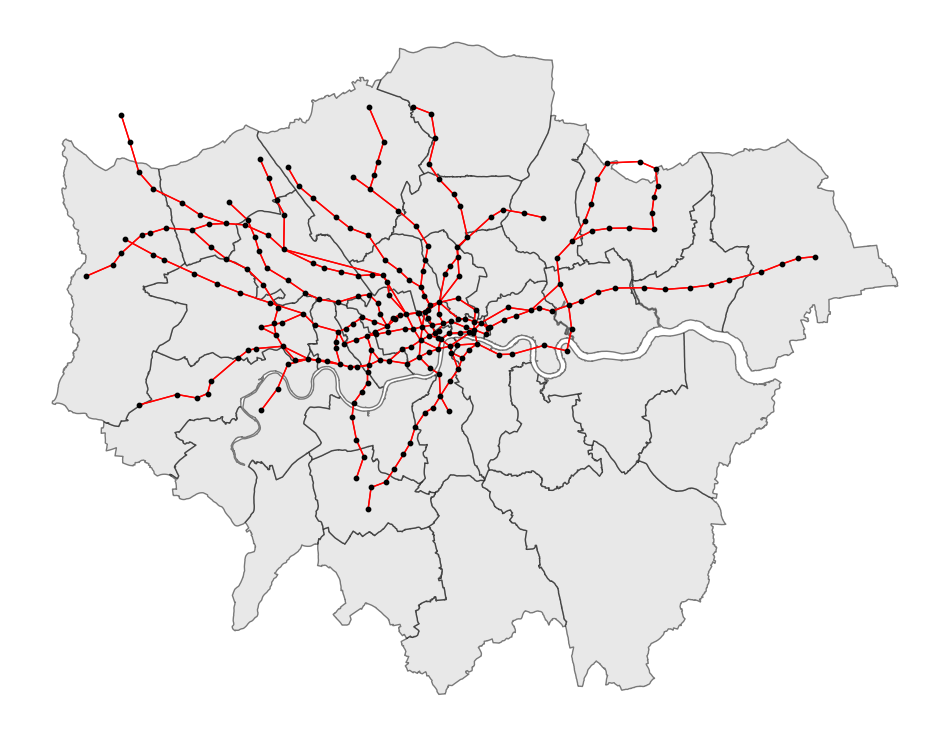

In [15]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import LineString

# Load full GeoDataFrame
london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")

# Filter for stations in station_list
stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))]

# Create a dict for name-to-geometry lookup
station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))

# Filter pairs using travel_patches indices
selected_pairs = [pairs_list[i] for i in travel_patches]

# Create GeoDataFrame of LineString connections between station pairs
lines = []
for s1, s2 in selected_pairs:
    if s1 in station_geom and s2 in station_geom:
        line = LineString([station_geom[s1], station_geom[s2]])
        lines.append({"station1": s1, "station2": s2, "geometry": line})

lines_gdf = gpd.GeoDataFrame(lines, geometry="geometry", crs=stations_gdf.crs)

# Load boroughs
boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

# Plot
fig, ax = plt.subplots(figsize=(12, 10))
boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
lines_gdf.plot(ax=ax, color="red", linewidth=1)  # thinner black lines
stations_gdf.plot(ax=ax, color="black", markersize=10,zorder=3)  # larger red dots

ax.axis("off")
plt.show()


In [17]:
selected_pairs

[('Acton Town', 'Chiswick Park'),
 ('Acton Town', 'Ealing Common'),
 ('Acton Town', 'South Ealing'),
 ('Acton Town', 'Turnham Green'),
 ('Aldgate', 'Liverpool Street'),
 ('Aldgate', 'Tower Hill'),
 ('Aldgate East', 'Liverpool Street'),
 ('Aldgate East', 'Tower Hill'),
 ('Aldgate East', 'Whitechapel'),
 ('Alperton', 'Park Royal'),
 ('Alperton', 'Sudbury Town'),
 ('Angel', "King's Cross St. Pancras"),
 ('Angel', 'Old Street'),
 ('Archway', 'Highgate'),
 ('Archway', 'Tufnell Park'),
 ('Arnos Grove', 'Bounds Green'),
 ('Arnos Grove', 'Southgate'),
 ('Arsenal', 'Finsbury Park'),
 ('Arsenal', 'Holloway Road'),
 ('Baker Street', 'Bond Street'),
 ('Baker Street', 'Edgware Road (C)'),
 ('Baker Street', 'Finchley Road'),
 ('Baker Street', 'Great Portland Street'),
 ('Baker Street', 'Marylebone'),
 ('Baker Street', "Regent's Park"),
 ('Baker Street', "St. John's Wood"),
 ('Balham', 'Clapham South'),
 ('Balham', 'Tooting Bec'),
 ('Bank & Monument', 'Cannon Street'),
 ('Bank & Monument', 'Liverpool

In [19]:
import networkx as nx

# Create graph
G = nx.Graph()
G.add_nodes_from(stations_gdf["name"])
G.add_edges_from(selected_pairs)

# Basic connectivity measures
avg_degree = sum(dict(G.degree()).values()) / G.number_of_nodes()
density = nx.density(G)
num_components = nx.number_connected_components(G)

print(f"Average Degree: {avg_degree:.2f}")
print(f"Density: {density:.4f}")
print(f"Connected Components: {num_components}")
avg_clustering = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {avg_clustering:.4f}")



Average Degree: 2.33
Density: 0.0093
Connected Components: 1
Average Clustering Coefficient: 0.0270


Average Clustering Coefficient: 0.0270


In [141]:
import geopandas as gpd
import numpy as np
import os
import tempfile
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from shapely.geometry import LineString
from tqdm import tqdm
from datetime import datetime, timedelta
from IPython.display import HTML
import IPython
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors

def create_line_gif_with_date(travel_leg_pairs_dict, london_gdf, station_list, duration=0.1, output_filename="london_tube_dynamics.gif"):
    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))]
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    seen = set()
    line_data = []
    for (s1, s2), values in travel_leg_pairs_dict.items():
        key = tuple(sorted((s1, s2)))
        if key in seen or s1 not in station_geom or s2 not in station_geom:
            continue
        seen.add(key)
        line_data.append({
            "s1": s1,
            "s2": s2,
            "geometry": LineString([station_geom[s1], station_geom[s2]]),
            "values": values
        })

    num_timesteps = len(next(iter(travel_leg_pairs_dict.values())))
    lines_gdf = gpd.GeoDataFrame(line_data, geometry="geometry", crs=stations_gdf.crs)
    start_date = datetime(2020, 3, 7)

    # Global normalization
    all_values = [val for ld in line_data for val in ld["values"]]
    vmin, vmax = min(all_values), max(all_values)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.cm.plasma

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Frames", unit="frame"):
            lines_gdf["value"] = [ld["values"][t] for ld in line_data]
            values = lines_gdf["value"].values

            fig, ax = plt.subplots(figsize=(12, 10))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)

            colors = [cmap(norm(val)) for val in values]
            lines_coords = [list(line.coords) for line in lines_gdf.geometry]

            sorted_indices = np.argsort(values)
            sorted_lines = [lines_coords[i] for i in sorted_indices]
            sorted_colors = [colors[i] for i in sorted_indices]

            lc = LineCollection(
                sorted_lines,
                colors=sorted_colors,
                linewidths=10,
                joinstyle="round",
                capstyle="round",
                zorder=2
            )
            ax.add_collection(lc)
            stations_gdf.plot(ax=ax, color="black", markersize=10, zorder=3)

            date_label = (start_date + timedelta(days=t)).strftime("%m/%d/%Y")
            ax.text(0.5, 1.02, date_label, transform=ax.transAxes, fontsize=14, ha="center", va="bottom", fontweight="bold")

            ax.axis("off")
            plt.tight_layout(pad=0.1)
            temp_filepath = os.path.join(temp_dir, f"frame_{t:03d}.png")
            plt.savefig(temp_filepath, bbox_inches='tight', pad_inches=0)
            plt.close(fig)
            frames.append(imageio.imread(temp_filepath))

        imageio.mimsave(output_filename, frames, duration=duration, loop=0)
        IPython.display.clear_output(wait=True)
    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')


In [142]:
create_line_gif_with_date(travel_leg_pairs_dict, london_gdf, station_list)


In [26]:
station_list

['Acton Town',
 'Aldgate',
 'Aldgate East',
 'Alperton',
 'Angel',
 'Archway',
 'Arnos Grove',
 'Arsenal',
 'Baker Street',
 'Balham',
 'Bank & Monument',
 'Barbican',
 'Barking',
 'Barkingside',
 'Barons Court',
 'Bayswater',
 'Becontree',
 'Belsize Park',
 'Bermondsey',
 'Bethnal Green',
 'Blackfriars',
 'Blackhorse Road',
 'Bond Street',
 'Borough',
 'Boston Manor',
 'Bounds Green',
 'Bow Road',
 'Brent Cross',
 'Brixton',
 'Bromley-by-Bow',
 'Burnt Oak',
 'Caledonian Road',
 'Camden Town',
 'Canada Water',
 'Canary Wharf',
 'Canning Town',
 'Cannon Street',
 'Canons Park',
 'Chalk Farm',
 'Chancery Lane',
 'Charing Cross',
 'Chigwell',
 'Chiswick Park',
 'Clapham Common',
 'Clapham North',
 'Clapham South',
 'Cockfosters',
 'Colindale',
 'Colliers Wood',
 'Covent Garden',
 'Croxley',
 'Dagenham East',
 'Dagenham Heathway',
 'Dollis Hill',
 'Ealing Broadway',
 'Ealing Common',
 "Earl's Court",
 'East Acton',
 'East Finchley',
 'East Ham',
 'East Putney',
 'Eastcote',
 'Edgware',
 'E

In [29]:
with open("London Formatted Paths.pkl", "rb") as file:
    paths = pickle.load(file)

paths

array([[list([('Acton Town', 'Acton Town')]),
        list([('Acton Town', 'Acton Town'), ('Acton Town', 'Turnham Green'), ('Turnham Green', 'Hammersmith'), ('Hammersmith', 'Barons Court'), ('Barons Court', "Earl's Court"), ("Earl's Court", 'Gloucester Road'), ('Gloucester Road', 'South Kensington'), ('South Kensington', 'Knightsbridge'), ('Knightsbridge', 'Hyde Park Corner'), ('Hyde Park Corner', 'Green Park'), ('Green Park', 'Piccadilly Circus'), ('Piccadilly Circus', 'Charing Cross'), ('Charing Cross', 'Embankment'), ('Embankment', 'Waterloo'), ('Waterloo', 'Bank & Monument'), ('Bank & Monument', 'Tower Hill'), ('Tower Hill', 'Aldgate'), ('Aldgate', 'Aldgate'), ('Turnham Green', 'Acton Town'), ('Hammersmith', 'Turnham Green'), ('Barons Court', 'Hammersmith'), ("Earl's Court", 'Barons Court'), ('Gloucester Road', "Earl's Court"), ('South Kensington', 'Gloucester Road'), ('Knightsbridge', 'South Kensington'), ('Hyde Park Corner', 'Knightsbridge'), ('Green Park', 'Hyde Park Corner'), (

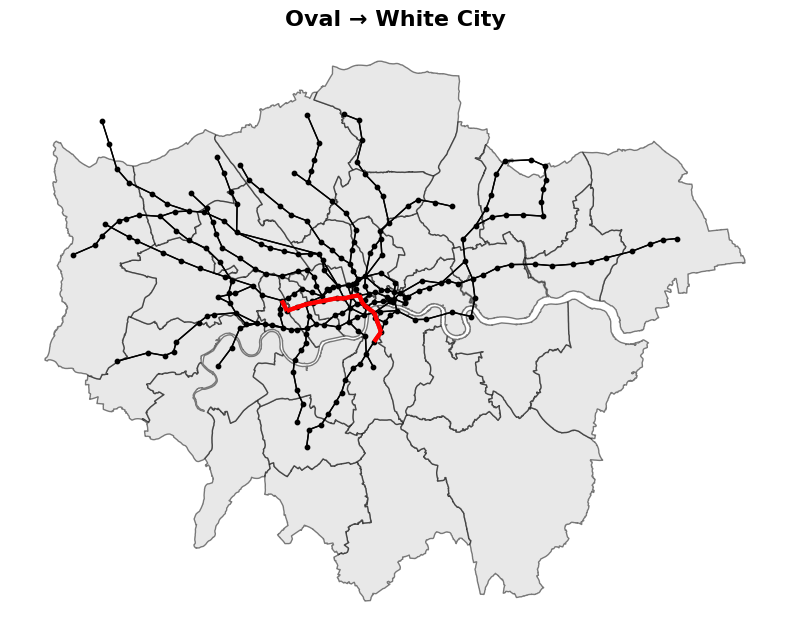

In [200]:
def plot_path_between(station1, station2, paths, station_list, london_gdf, selected_pairs):
    import geopandas as gpd
    import matplotlib.pyplot as plt
    from shapely.geometry import LineString

    # Setup
    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))]
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Base lines (gray)
    base_lines = []
    for s1, s2 in selected_pairs:
        if s1 in station_geom and s2 in station_geom:
            base_lines.append(LineString([station_geom[s1], station_geom[s2]]))
    base_lines_gdf = gpd.GeoSeries(base_lines, crs=stations_gdf.crs)

    # Target path (red)
    i, j = station_list.index(station1), station_list.index(station2)
    path = paths[i][j]
    red_lines = [LineString([station_geom[s1], station_geom[s2]]) for s1, s2 in path
                 if s1 in station_geom and s2 in station_geom]
    red_lines_gdf = gpd.GeoSeries(red_lines, crs=stations_gdf.crs)

    # Plot
    fig, ax = plt.subplots(figsize=(8, 8))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
    base_lines_gdf.plot(ax=ax, color="black", linewidth=1, zorder=1)
    red_lines_gdf.plot(ax=ax, color="red", linewidth=3, zorder=3)
    stations_gdf.plot(ax=ax, color="black", markersize=10, zorder=2)

    ax.set_title(f"{station1} → {station2}", fontsize=16, fontweight='bold')
    ax.axis("off")
    plt.tight_layout()
    plt.show()
    
plot_path_between("Oval", "White City", paths, station_list, london_gdf, selected_pairs)


In [50]:
import os
import imageio
from tqdm import tqdm

def make_gif_from_station(station1, paths, station_list, london_gdf, selected_pairs, outpath="path_animation.gif"):
    import geopandas as gpd
    import matplotlib.pyplot as plt
    from shapely.geometry import LineString

    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))]
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]
    base_lines = [LineString([station_geom[s1], station_geom[s2]])
                  for s1, s2 in selected_pairs if s1 in station_geom and s2 in station_geom]
    base_lines_gdf = gpd.GeoSeries(base_lines, crs=stations_gdf.crs)

    os.makedirs("gif_frames", exist_ok=True)
    frame_paths = []

    for station2 in tqdm(station_list, desc=f"Rendering paths from {station1}"):
        if station1 == station2:
            continue
        i, j = station_list.index(station1), station_list.index(station2)
        path = paths[i][j]
        red_lines = [LineString([station_geom[s1], station_geom[s2]])
                     for s1, s2 in path if s1 in station_geom and s2 in station_geom]
        red_lines_gdf = gpd.GeoSeries(red_lines, crs=stations_gdf.crs)

        fig, ax = plt.subplots(figsize=(12, 10))
        boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
        base_lines_gdf.plot(ax=ax, color="black", linewidth=1, zorder=1)
        red_lines_gdf.plot(ax=ax, color="red", linewidth=3, zorder=3)
        stations_gdf.plot(ax=ax, color="black", markersize=10, zorder=2)
        ax.set_title(f"{station1} → {station2}", fontsize=15)
        ax.axis("off")
        plt.tight_layout()

        frame_path = f"gif_frames/frame_{station1}_{station2}.png"
        plt.savefig(frame_path)
        plt.close()
        frame_paths.append(frame_path)

    images = [imageio.v2.imread(fp) for fp in frame_paths]
    imageio.mimsave(outpath, images, fps=1)

    
make_gif_from_station("Oval", paths, station_list, london_gdf, selected_pairs)


Rendering paths from Oval: 100%|██████████| 251/251 [01:44<00:00,  2.41it/s]


In [ ]:
import os
import imageio
from tqdm import tqdm
import geopandas as gpd
import matplotlib
matplotlib.use("Agg")  # Use non-interactive backend
import matplotlib.pyplot as plt
from shapely.geometry import LineString

def make_gif_from_station(station1, paths, station_list, london_gdf, selected_pairs, outpath="path_animation.gif"):
    # Prepare station geometries
    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))]
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Order station_list west to east by centroid x
    station_order = sorted(
        [s for s in station_list if s != station1 and s in station_geom],
        key=lambda s: station_geom[s].centroid.x
    )

    # Precompute base lines
    base_lines = [LineString([station_geom[s1], station_geom[s2]])
                  for s1, s2 in selected_pairs if s1 in station_geom and s2 in station_geom]
    base_lines_gdf = gpd.GeoSeries(base_lines, crs=stations_gdf.crs)

    os.makedirs("gif_frames", exist_ok=True)
    frame_paths = []

    for station2 in tqdm(station_order, desc=f"Rendering {station1} paths (W→E)"):
        i, j = station_list.index(station1), station_list.index(station2)
        path = paths[i][j]
        red_lines = [LineString([station_geom[s1], station_geom[s2]])
                     for s1, s2 in path if s1 in station_geom and s2 in station_geom]
        red_lines_gdf = gpd.GeoSeries(red_lines, crs=stations_gdf.crs)

        fig, ax = plt.subplots(figsize=(8, 6), dpi=100)  # Faster render
        boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
        base_lines_gdf.plot(ax=ax, color="black", linewidth=0.5, zorder=1)
        red_lines_gdf.plot(ax=ax, color="red", linewidth=2, zorder=3)
        stations_gdf.plot(ax=ax, color="black", markersize=5, zorder=2)
        ax.set_title(f"{station1} → {station2}", fontsize=10)
        ax.axis("off")
        plt.tight_layout()

        frame_path = f"gif_frames/frame_{station1}_{station2}.png"
        plt.savefig(frame_path, bbox_inches="tight", pad_inches=0.1)
        plt.close()
        frame_paths.append(frame_path)

    images = [imageio.v2.imread(fp) for fp in frame_paths]
    imageio.mimsave(outpath, images, fps=10)

make_gif_from_station("Oval", paths, station_list, london_gdf, selected_pairs)


Rendering Oval paths (W→E): 100%|██████████| 250/250 [01:27<00:00,  2.85it/s]

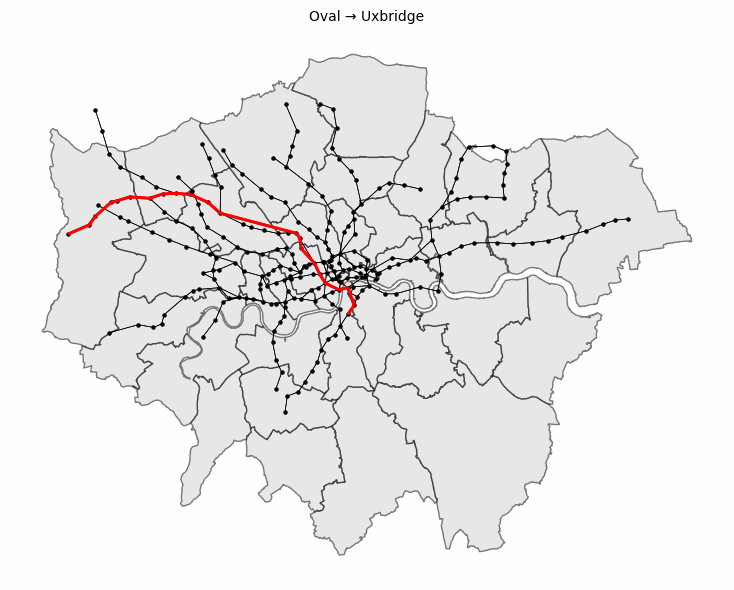

In [56]:
from PIL import Image, ImageSequence
import io
from IPython.display import display, Image as IPyImage

def display_gif_with_speed(path, speed_factor=1.0):
    original = Image.open(path)
    orig_duration = original.info.get('duration', 100)

    # Fast path: Speed up by skipping frames while iterating
    if speed_factor >= 1:
        step = int(speed_factor)
        frames = []
        for i, frame in enumerate(ImageSequence.Iterator(original)):
            if i % step == 0:
                frames.append(frame.copy())
        duration = orig_duration
    else:
        # Slow down by adjusting duration; need all frames
        frames = [frame.copy() for frame in ImageSequence.Iterator(original)]
        duration = int(orig_duration / speed_factor)

    buffer = io.BytesIO()
    frames[0].save(
        buffer,
        format='GIF',
        save_all=True,
        append_images=frames[1:],
        duration=duration,
        loop=0,
        disposal=2
    )
    buffer.seek(0)
    display(IPyImage(data=buffer.read()))
    
display_gif_with_speed("path_animation.gif", speed_factor=1)  # much faster



In [62]:
all_pairs = []
for station1 in station_list:
    for station2 in station_list:
        all_pairs.append((station1,station2))
        
all_pairs

[('Acton Town', 'Acton Town'),
 ('Acton Town', 'Aldgate'),
 ('Acton Town', 'Aldgate East'),
 ('Acton Town', 'Alperton'),
 ('Acton Town', 'Angel'),
 ('Acton Town', 'Archway'),
 ('Acton Town', 'Arnos Grove'),
 ('Acton Town', 'Arsenal'),
 ('Acton Town', 'Baker Street'),
 ('Acton Town', 'Balham'),
 ('Acton Town', 'Bank & Monument'),
 ('Acton Town', 'Barbican'),
 ('Acton Town', 'Barking'),
 ('Acton Town', 'Barkingside'),
 ('Acton Town', 'Barons Court'),
 ('Acton Town', 'Bayswater'),
 ('Acton Town', 'Becontree'),
 ('Acton Town', 'Belsize Park'),
 ('Acton Town', 'Bermondsey'),
 ('Acton Town', 'Bethnal Green'),
 ('Acton Town', 'Blackfriars'),
 ('Acton Town', 'Blackhorse Road'),
 ('Acton Town', 'Bond Street'),
 ('Acton Town', 'Borough'),
 ('Acton Town', 'Boston Manor'),
 ('Acton Town', 'Bounds Green'),
 ('Acton Town', 'Bow Road'),
 ('Acton Town', 'Brent Cross'),
 ('Acton Town', 'Brixton'),
 ('Acton Town', 'Bromley-by-Bow'),
 ('Acton Town', 'Burnt Oak'),
 ('Acton Town', 'Caledonian Road'),
 ('Ac

In [65]:
# Compare functional residents of travel patches
leg_Nj_dict = {}

for idx in travel_patches:
    leg_Nj_dict[all_pairs[idx]] = Nj[idx]
    
leg_Nj_dict

{('Acton Town', 'Chiswick Park'): np.float64(28.41752196107986),
 ('Acton Town', 'Ealing Common'): np.float64(285.3422432835748),
 ('Acton Town', 'South Ealing'): np.float64(554.9255644883025),
 ('Acton Town', 'Turnham Green'): np.float64(421.9527805201684),
 ('Aldgate', 'Liverpool Street'): np.float64(13.244942171258904),
 ('Aldgate', 'Tower Hill'): np.float64(7.577952987667762),
 ('Aldgate East', 'Liverpool Street'): np.float64(176.3496513502821),
 ('Aldgate East', 'Tower Hill'): np.float64(180.68026621670307),
 ('Aldgate East', 'Whitechapel'): np.float64(248.58364373542776),
 ('Alperton', 'Park Royal'): np.float64(321.0525211270906),
 ('Alperton', 'Sudbury Town'): np.float64(200.53992461933436),
 ('Angel', "King's Cross St. Pancras"): np.float64(378.5067111357936),
 ('Angel', 'Old Street'): np.float64(348.88422901870894),
 ('Archway', 'Highgate'): np.float64(374.57618061788327),
 ('Archway', 'Tufnell Park'): np.float64(154.79318520446628),
 ('Arnos Grove', 'Bounds Green'): np.float6

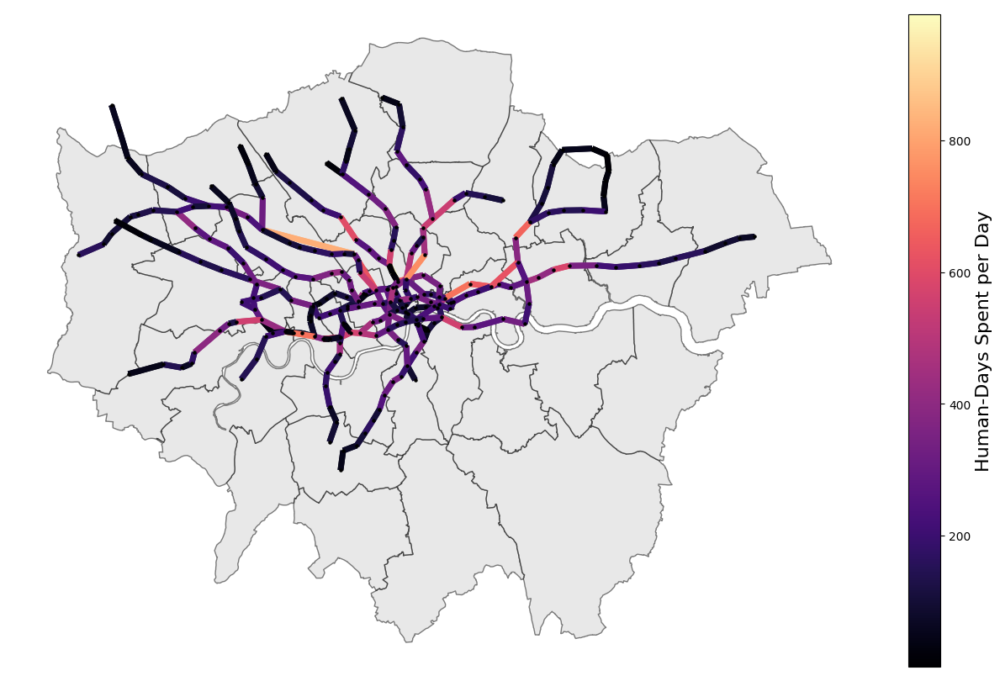

In [87]:
%matplotlib inline
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import LineString
import numpy as np

def plot_leg_values(london_gdf, leg_Nj_dict, station_list, cmap="magma"):
    # Filter stations
    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))].copy()
    if stations_gdf.crs is None:
        stations_gdf.set_crs("EPSG:4326", inplace=True)
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))

    # Boroughs
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Normalize values
    values = np.array(list(leg_Nj_dict.values()))
    norm = plt.Normalize(vmin=values.min(), vmax=values.max())
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    # Build line geometries and colors
    colored_lines = []
    colors = []
    for (s1, s2), val in leg_Nj_dict.items():
        if s1 in station_geom and s2 in station_geom:
            colored_lines.append(LineString([station_geom[s1], station_geom[s2]]))
            colors.append(sm.to_rgba(val))

    # Pack into GeoDataFrame
    lines_gdf = gpd.GeoDataFrame({"geometry": colored_lines, "color": colors}, crs=stations_gdf.crs)

    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
    lines_gdf.plot(ax=ax, color=lines_gdf["color"], linewidth=5, zorder=2)
    stations_gdf.plot(ax=ax, color="black", markersize=5, zorder=3)
    ax.axis("off")

    # Add colorbar only as tall as the plot
    cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
    cbar.set_label("Human-Days Spent per Day",fontsize=16)

    plt.tight_layout()
    plt.show()


plot_leg_values(london_gdf, leg_Nj_dict, station_list)




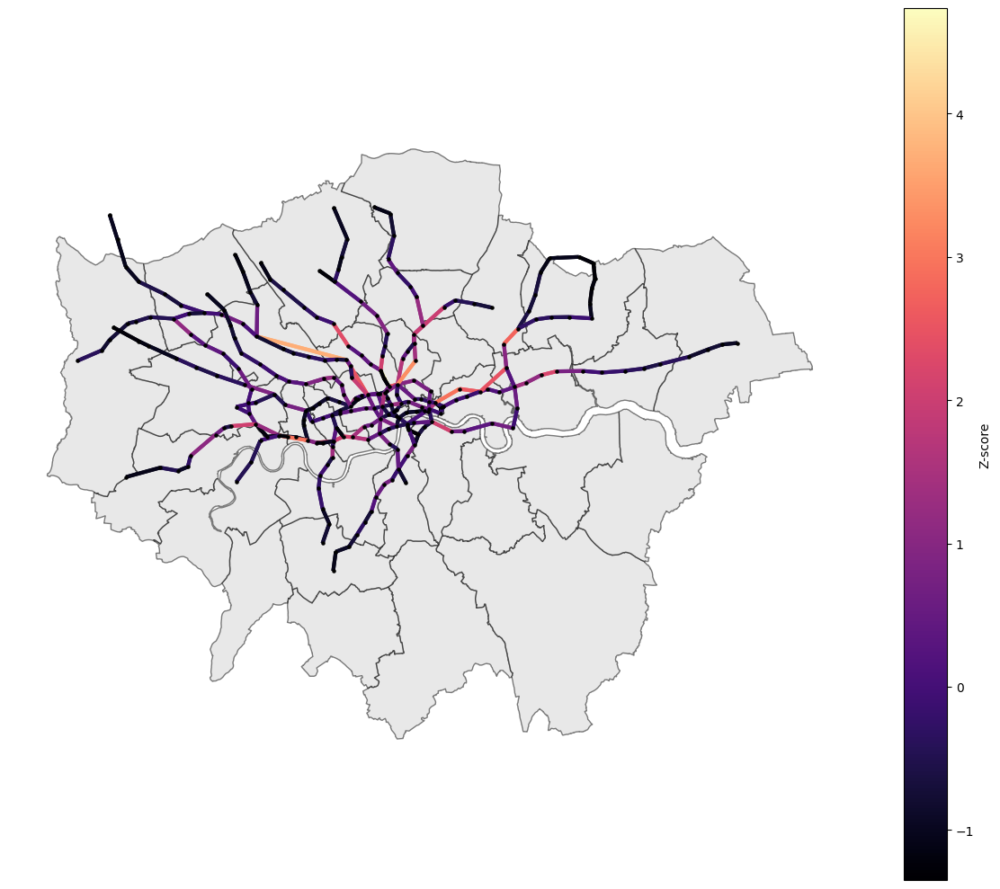

In [77]:
# Color by z-score

%matplotlib inline
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import LineString
import numpy as np

def plot_leg_values(london_gdf, leg_Nj_dict, station_list, cmap="magma"):
    # Filter stations
    stations_gdf = london_gdf[(london_gdf["type"] == "station") & (london_gdf["name"].isin(station_list))].copy()
    if stations_gdf.crs is None:
        stations_gdf.set_crs("EPSG:4326", inplace=True)
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))

    # Boroughs
    boroughs_gdf = london_gdf[london_gdf["type"] == "borough"]

    # Compute z-scores
    values = np.array(list(leg_Nj_dict.values()))
    z_scores = (values - values.mean()) / values.std()
    norm = plt.Normalize(vmin=z_scores.min(), vmax=z_scores.max())
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    # Build line geometries and colors using z-scores
    colored_lines = []
    colors = []
    for i, ((s1, s2), _) in enumerate(leg_Nj_dict.items()):
        if s1 in station_geom and s2 in station_geom:
            colored_lines.append(LineString([station_geom[s1], station_geom[s2]]))
            colors.append(sm.to_rgba(z_scores[i]))

    # Pack into GeoDataFrame
    lines_gdf = gpd.GeoDataFrame({"geometry": colored_lines, "color": colors}, crs=stations_gdf.crs)

    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))
    boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
    lines_gdf.plot(ax=ax, color=lines_gdf["color"], linewidth=3, zorder=2)
    stations_gdf.plot(ax=ax, color="black", markersize=5, zorder=3)
    ax.axis("off")
    plt.colorbar(sm, ax=ax, label="Z-score")
    plt.tight_layout()
    plt.show()

# Example call
plot_leg_values(london_gdf, leg_Nj_dict, station_list)


In [27]:
import geopandas as gpd
import numpy as np
import os
import tempfile
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from shapely.geometry import LineString
from datetime import timedelta, datetime
from IPython.display import HTML
from tqdm import tqdm
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors

# Assumes pop_dict, solution, params, travel_leg_pairs_dict, home_patches, and station_list are defined
pop_array = np.array(list(pop_dict.values()))

def create_combined_gif(solution, params, travel_leg_pairs_dict, station_list, label_mode="date", duration=0.1, output_filename="combined_voronoi_lines.gif"):
    voronoi_gdf = gpd.read_file("London_Voronoi_File_1_5km.shp")  
    london_gdf = gpd.read_file("Complete London Shapefile.gpkg", layer="Combined_London_Data")
    boroughs_gdf = london_gdf[london_gdf['type'] == 'borough']
    stations_gdf = london_gdf[(london_gdf['type'] == 'station') & (london_gdf["name"].isin(station_list))]

    map_data = solution
    station_data = map_data[1][home_patches]
    for i in range(251):
        station_data[i] = station_data[i] / pop_array[i]
    num_timesteps = station_data.shape[1]
    
    station_coords = np.stack([stations_gdf.geometry.x.values, stations_gdf.geometry.y.values], axis=1)
    station_geom = dict(zip(stations_gdf["name"], stations_gdf.geometry))

    line_data = []
    seen = set()
    for (s1, s2), values in travel_leg_pairs_dict.items():
        key = tuple(sorted((s1, s2)))
        if key in seen or s1 not in station_geom or s2 not in station_geom:
            continue
        seen.add(key)
        line_data.append({
            "s1": s1,
            "s2": s2,
            "geometry": LineString([station_geom[s1], station_geom[s2]]),
            "values": values
        })
    lines_gdf = gpd.GeoDataFrame(line_data, geometry="geometry", crs=stations_gdf.crs)

    # Global normalization for line values
    all_values = [val for ld in line_data for val in ld["values"]]
    vmin, vmax = min(all_values), max(all_values)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.cm.plasma

    voronoi_gdf = voronoi_gdf.to_crs(london_gdf.crs)
    start_date = datetime(2020, 3, 7)

    with tempfile.TemporaryDirectory() as temp_dir:
        frames = []
        for t in tqdm(range(num_timesteps), desc="Generating Combined Frames", unit="frame"):
            color_values = station_data[:, t]
            color_min, color_max = np.nanmin(color_values), np.nanmax(color_values)
            voronoi_gdf["color"] = (color_values - color_min) / (color_max - color_min) if color_max > color_min else 0.5

            weighted_x = np.sum(station_coords[:, 0] * station_data[:, t] * pop_array) / np.sum(station_data[:, t] * pop_array)
            weighted_y = np.sum(station_coords[:, 1] * station_data[:, t] * pop_array) / np.sum(station_data[:, t] * pop_array)

            lines_gdf["value"] = [ld["values"][t] for ld in line_data]
            values = lines_gdf["value"].values
            colors = [cmap(norm(val)) for val in values]
            lines_coords = [list(line.coords) for line in lines_gdf.geometry]
            sorted_indices = np.argsort(values)
            sorted_lines = [lines_coords[i] for i in sorted_indices]
            sorted_colors = [colors[i] for i in sorted_indices]

            fig, ax = plt.subplots(figsize=(10, 10))
            boroughs_gdf.plot(ax=ax, color="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5)
            voronoi_gdf.plot(ax=ax, column="color", cmap="plasma", edgecolor="black", linewidth=0.5, alpha=1)
            
            lc = LineCollection(
                sorted_lines,
                colors=sorted_colors,
                linewidths=6,
                joinstyle="round",
                capstyle="round",
                zorder=2
            )
            ax.add_collection(lc)

            stations_gdf.plot(ax=ax, color="black", markersize=10, zorder=3)
            ax.plot(weighted_x, weighted_y, marker='+', color='red', markersize=12, markeredgewidth=2)

            label_text = (start_date + timedelta(days=t)).strftime("%m/%d/%Y") if label_mode == "date" else f"t = {t}"
            ax.text(0.5, 1.02, label_text, transform=ax.transAxes, fontsize=12, ha="center", va="bottom", fontweight="bold")
            ax.set_axis_off()
            plt.tight_layout(pad=0)

            temp_filepath = os.path.join(temp_dir, f"frame_{t:03d}.png")
            plt.savefig(temp_filepath, bbox_inches='tight', pad_inches=0)
            plt.close(fig)
            frames.append(imageio.imread(temp_filepath))

        imageio.mimsave(output_filename, frames, duration=duration, loop=0)
    return HTML(f'<img src="{output_filename}" style="display:block;margin:0 auto;" loop="infinite" autoplay>')

create_combined_gif(
    solution=solution_legs,
    params=params,
    travel_leg_pairs_dict=travel_leg_pairs_dict,
    station_list=station_list,
    label_mode="date",  # or "number"
    duration=0.1,        # seconds per frame
    output_filename="combined_voronoi_lines.gif"
)


NameError: name 'solution_legs' is not defined

In [160]:
solution_legs.shape

(3, 3, 63001, 80)